In [1]:
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Draw
from rdkit.Chem import rdMolDescriptors  
from rdkit.Chem import Lipinski
from rdkit import DataStructs
from rdkit.Chem import Descriptors
from rdkit.ML.Descriptors import MoleculeDescriptors

#import pubchempy as pcp
#from IPython.display import Imag

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

import seaborn as sns


from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor

#import torch
from scipy import stats
import os

import joblib
import json


In [ ]:
os.listdir('.')

# The raw QM9 dataset - double check

In [2]:
from openbabel import pybel

def xyz_to_smiles(fname: str) -> str:
    mol = next(pybel.readfile("xyz", fname))
    smi = mol.write(format="smi")
    return smi.split()[0].strip()


In [ ]:
def screen_qm9_raw(filename):
    with open(filename, 'r') as f1:
        lines = f1.readlines()
        natom = int(lines.pop(0))
        au2ev = 27.2107
        line = lines.pop(0).split()
        homo,lumo = float(line[7])*au2ev, float(line[8])*au2ev
        smiles = lines[natom+1].split()[1]
        inchi  = lines[natom+2].split()[1]
        output = [filename, homo, lumo, smiles, inchi]
        
        smi_pybel = xyz_to_smiles(filename)
        output.append(smi_pybel)
        
        return output

jobdir = 'QM9 dataset/dsgdb9nsd.xyz'
qm9_raw = [os.path.join(jobdir,x) for x in os.listdir(jobdir) if '.xyz' in x]

data = [ screen_qm9_raw( q ) for q in qm9_raw ]

df_qm9_raw = pd.DataFrame(data, columns=['name','HOMO','LUMO','SMILES','INCHI','SMILES_pybel'])
df_qm9_raw.to_csv('df_qm9_raw.csv')
df_qm9_raw

In [3]:
df_qm9_raw = pd.read_csv('df_qm9_raw.csv', index_col=0)
df_qm9_raw

,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel
0,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000001.xyz,-10.549588,3.186373,C,InChI=1S/CH4/h1H4,C
1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000002.xyz,-6.993150,2.255767,N,InChI=1S/H3N/h1H3,N
2,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000003.xyz,-7.967293,1.869375,O,InChI=1S/H2O/h1H2,O
3,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000004.xyz,-7.741444,1.376861,C#C,InChI=1S/C2H2/c1-2/h1-2H,C#C
4,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000005.xyz,-9.806736,0.519724,C#N,InChI=1S/CHN/c1-2/h1H,C#N
...,...,...,...,...,...,...
133880,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133881.xyz,-6.133292,1.599989,C1[C@@H]2[C@@H]3[C@H]4[C@@H]5O[C@]14[C@@H]5N23,"InChI=1S/C7H7NO/c1-2-4-3-5-6(8(2)4)7(1,3)9-5/h...",C1[C@@H]2[C@@H]3[C@H]4[C@@H]5O[C@]14[C@@H]5[N@]23
133881,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133882.xyz,-6.511521,1.654411,C1N2[C@H]3[C@@H]2[C@@H]2[C@H]4O[C@@]12[C@@H]34,InChI=1S/C7H7NO/c1-7-2-4-5(8(1)4)3(7)6(2)9-7/h...,C1[N@@]2[C@H]3[C@@H]2[C@@H]2[C@H]4O[C@@]12[C@@...
133882,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133883.xyz,-6.076149,1.959170,C1N2[C@@H]3[C@@H]4[C@@H]5[C@H]2[C@]13CN45,InChI=1S/C7H8N2/c1-7-2-9-5(7)3-4(6(7)9)8(1)3/h...,C1[N@]2[C@@H]3[C@@H]4[C@@H]5[C@H]2[C@]13C[N@]45
133883,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133884.xyz,-5.774111,2.397263,C1N2[C@H]3[C@@H]4[C@@H]5C[C@]13[C@H]2[C@H]45,InChI=1S/C8H9N/c1-3-4-5(3)7-8(1)2-9(7)6(4)8/h3...,C1[N@@]2[C@H]3[C@@H]4[C@@H]5C[C@]13[C@H]2[C@H]45


In [4]:
%%capture --no-display

## check the bad SMILES and INCHI
## Remove complex
mask_is_good = []
for s1,c,s2 in zip(df_qm9_raw['SMILES'],df_qm9_raw['INCHI'],df_qm9_raw['SMILES_pybel']):
    try:
        mol1 = Chem.MolFromSmiles(s1)
        mol2 = Chem.MolFromSmiles(s2)
        #mol3 = Chem.MolFromInchi(c)
        #s = Chem.MolToSmiles(mol3)
        if mol1 is None or mol2 is None:
            mask = False
        else:
            mask =True
    except:
        mask =False
    if '.' in s1 or '.' in s2: ## keep non-complex
        mask = False
    mask_is_good.append( mask )

df_qm9_valid = df_qm9_raw[mask_is_good]
df_qm9_valid.to_csv('df_qm9_valid.csv')
df_qm9_valid

,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel
0,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000001.xyz,-10.549588,3.186373,C,InChI=1S/CH4/h1H4,C
1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000002.xyz,-6.993150,2.255767,N,InChI=1S/H3N/h1H3,N
2,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000003.xyz,-7.967293,1.869375,O,InChI=1S/H2O/h1H2,O
3,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000004.xyz,-7.741444,1.376861,C#C,InChI=1S/C2H2/c1-2/h1-2H,C#C
4,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000005.xyz,-9.806736,0.519724,C#N,InChI=1S/CHN/c1-2/h1H,C#N
...,...,...,...,...,...,...
133880,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133881.xyz,-6.133292,1.599989,C1[C@@H]2[C@@H]3[C@H]4[C@@H]5O[C@]14[C@@H]5N23,"InChI=1S/C7H7NO/c1-2-4-3-5-6(8(2)4)7(1,3)9-5/h...",C1[C@@H]2[C@@H]3[C@H]4[C@@H]5O[C@]14[C@@H]5[N@]23
133881,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133882.xyz,-6.511521,1.654411,C1N2[C@H]3[C@@H]2[C@@H]2[C@H]4O[C@@]12[C@@H]34,InChI=1S/C7H7NO/c1-7-2-4-5(8(1)4)3(7)6(2)9-7/h...,C1[N@@]2[C@H]3[C@@H]2[C@@H]2[C@H]4O[C@@]12[C@@...
133882,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133883.xyz,-6.076149,1.959170,C1N2[C@@H]3[C@@H]4[C@@H]5[C@H]2[C@]13CN45,InChI=1S/C7H8N2/c1-7-2-9-5(7)3-4(6(7)9)8(1)3/h...,C1[N@]2[C@@H]3[C@@H]4[C@@H]5[C@H]2[C@]13C[N@]45
133883,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133884.xyz,-5.774111,2.397263,C1N2[C@H]3[C@@H]4[C@@H]5C[C@]13[C@H]2[C@H]45,InChI=1S/C8H9N/c1-3-4-5(3)7-8(1)2-9(7)6(4)8/h3...,C1[N@@]2[C@H]3[C@@H]4[C@@H]5C[C@]13[C@H]2[C@H]45


In [3]:
df_qm9_valid = pd.read_csv('df_qm9_valid.csv', index_col=0) 
#df_qm9_valid

In [4]:
%%capture --no-display

## Remove radical
def has_radical(smi):
    contains_radical = False
    mol = Chem.MolFromSmiles(smi)
    if any([True if atom.GetNumRadicalElectrons()>0 else False for atom in mol.GetAtoms() ]):
        contains_radical = True
    return contains_radical


mask_without_radical = []
for s1,s2 in zip(df_qm9_valid['SMILES'],df_qm9_valid['SMILES_pybel']):
    #mol = Chem.MolFromInchi(c)
    #s2 = Chem.MolToSmiles(mol, canonical=True, isomericSmiles=True)
    try:
        #mask = not any([has_radical(s1), has_radical(s2)])
        mask = not has_radical(s2)
    except:
        mask = False
    mask_without_radical.append( mask )
    #print(s, s2, mask)

df_qm9_radical_removed = df_qm9_valid[mask_without_radical]
df_qm9_radical_removed.to_csv('df_qm9_radical_removed.csv')
df_qm9_radical_removed

,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel
0,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000001.xyz,-10.549588,3.186373,C,InChI=1S/CH4/h1H4,C
1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000002.xyz,-6.993150,2.255767,N,InChI=1S/H3N/h1H3,N
2,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000003.xyz,-7.967293,1.869375,O,InChI=1S/H2O/h1H2,O
3,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000004.xyz,-7.741444,1.376861,C#C,InChI=1S/C2H2/c1-2/h1-2H,C#C
4,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000005.xyz,-9.806736,0.519724,C#N,InChI=1S/CHN/c1-2/h1H,C#N
...,...,...,...,...,...,...
133880,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133881.xyz,-6.133292,1.599989,C1[C@@H]2[C@@H]3[C@H]4[C@@H]5O[C@]14[C@@H]5N23,"InChI=1S/C7H7NO/c1-2-4-3-5-6(8(2)4)7(1,3)9-5/h...",C1[C@@H]2[C@@H]3[C@H]4[C@@H]5O[C@]14[C@@H]5[N@]23
133881,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133882.xyz,-6.511521,1.654411,C1N2[C@H]3[C@@H]2[C@@H]2[C@H]4O[C@@]12[C@@H]34,InChI=1S/C7H7NO/c1-7-2-4-5(8(1)4)3(7)6(2)9-7/h...,C1[N@@]2[C@H]3[C@@H]2[C@@H]2[C@H]4O[C@@]12[C@@...
133882,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133883.xyz,-6.076149,1.959170,C1N2[C@@H]3[C@@H]4[C@@H]5[C@H]2[C@]13CN45,InChI=1S/C7H8N2/c1-7-2-9-5(7)3-4(6(7)9)8(1)3/h...,C1[N@]2[C@@H]3[C@@H]4[C@@H]5[C@H]2[C@]13C[N@]45
133883,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133884.xyz,-5.774111,2.397263,C1N2[C@H]3[C@@H]4[C@@H]5C[C@]13[C@H]2[C@H]45,InChI=1S/C8H9N/c1-3-4-5(3)7-8(1)2-9(7)6(4)8/h3...,C1[N@@]2[C@H]3[C@@H]4[C@@H]5C[C@]13[C@H]2[C@H]45


In [5]:
## The structures with radicals
df_qm9_contain_radicals = df_qm9_valid[ [not t for t in mask_without_radical] ]
df_qm9_contain_radicals.to_csv('df_qm9_contain_radicals.csv')
df_qm9_contain_radicals

,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel
166,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000167.xyz,-7.360494,0.160543,[nH]1cncn1,"InChI=1S/C2H3N3/c1-3-2-5-4-1/h1-2H,(H,3,4,5)",N1[CH]N=C[N]1
209,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000210.xyz,-5.458466,0.857137,Oc1c[nH]cn1,"InChI=1S/C3H4N2O/c6-3-1-4-2-5-3/h1-2,6H,(H,4,5)",OC1=N[CH]N[CH]1
723,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000724.xyz,-7.159135,-2.734675,c1nnncn1,InChI=1S/C2H2N4/c1-3-2-5-6-4-1/h1-2H,C1=N[N]N=C[N]1
733,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000734.xyz,-6.979545,0.299318,Cc1ncn[nH]1,"InChI=1S/C3H5N3/c1-3-4-2-5-6-3/h2H,1H3,(H,4,5,6)",C[C]1N=C[N]N1
745,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000746.xyz,-7.140088,0.247617,Cn1cncn1,"InChI=1S/C3H5N3/c1-6-3-4-2-5-6/h2-3H,1H3",CN1[CH]N=C[N]1
...,...,...,...,...,...,...
133858,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133859.xyz,-5.561867,-1.496589,CN1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21,"InChI=1S/C8H9N/c1-9-7-5-4-2-3-8(7,9)6(4)5/h2,5...",CN1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21
133859,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133860.xyz,-5.692478,-1.578221,O[C@@H]1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21,"InChI=1S/C8H8O/c9-7-6-4-3-1-2-8(6,7)5(3)4/h1,4...",O[C@@H]1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21
133863,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133864.xyz,-3.771403,-1.736043,C1[C@H]2C[CH]O[C@H]3C[C@@H]1[C]23,"InChI=1S/C8H10O/c1-2-9-7-4-6-3-5(1)8(6)7/h2,5-...",C1[C@H]2C[CH]O[C@H]3C[C@@H]1[C]23
133864,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133865.xyz,-3.605418,-1.466657,C1[C@H]2CN3C[CH]O[C@@H]1[C]23,"InChI=1S/C7H9NO/c1-2-9-6-3-5-4-8(1)7(5)6/h2,5-...",C1[C@H]2C[N@]3C[CH]O[C@@H]1[C]23


In [3]:
###### Jump start with processed dataset
df_qm9_radical_removed = pd.read_csv('df_qm9_radical_removed.csv', index_col=0)
df_qm9_contain_radicals = pd.read_csv('df_qm9_contain_radicals.csv', index_col=0)

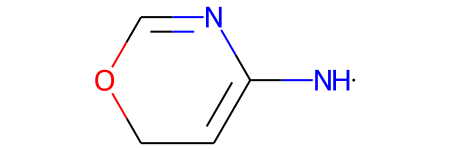

In [31]:
Chem.MolFromSmiles('[NH]C1=CCOC=N1')

In [89]:
## Now, let's find dienes in radical_removed data
def has_substructure(smi, sub_struct=None):
    if sub_struct is None:
        sub_struct = ['C=CC=C']
    mol = Chem.RemoveHs( Chem.MolFromSmiles(smi) )
    Chem.Kekulize(mol)
    if any([mol.HasSubstructMatch( Chem.MolFromSmiles(s) ) for s in sub_struct]):
        match = True
    else:
        match = False
    return match

def add_diene_tag(df):
    match_smi1, match_smi2, match_both = [],[],[]
    for s1,s2 in zip(df['SMILES'],df['SMILES_pybel']):
        mask_smi1 = has_substructure(s1)
        mask_smi2 = has_substructure(s2)
        mask_both = all([mask_smi1,mask_smi2])
        match_smi1.append( mask_smi1 )
        match_smi2.append( mask_smi2 )
        match_both.append( mask_both )
    df['SMILES_match_diene'] = match_smi1
    df['SMILES_pybel_match_diene'] = match_smi2
    df['BOTH_match_diene'] = match_both
    display( 'Match results: ', np.sum([match_smi1, match_smi2, match_both], axis=1) )

def has_diene_pattern(df, pattern='C=CC=C'):
    new_col = 'SMILES_pattern_'+pattern
    match_smi = [ has_substructure(s, sub_struct=[pattern]) for s in df['SMILES_pybel'] ]
    df[new_col] = match_smi
    display( 'Match results: ', pattern, np.sum(match_smi) )

In [88]:
%%capture --no-display
    
#add_diene_tag(df_qm9_radical_removed)
patterns = ['C=CC=C','N=CC=C','C=NC=C','N=NC=C','N=CN=C','N=CC=N','C=NN=C','N=NN=C','N=NC=N','N=NN=N']
for p in patterns:
    has_diene_pattern(df_qm9_radical_removed, pattern=p)
df_qm9_radical_removed

NameError: name 'df_qm9_radical_removed' is not defined

In [5]:
%%capture --no-display

#add_diene_tag(df_qm9_contain_radicals)
patterns = ['C=CC=C','N=CC=C','C=NC=C','N=NC=C','N=CN=C','N=CC=N','C=NN=C','N=NN=C','N=NC=N','N=NN=N']
for p in patterns:
    has_diene_pattern(df_qm9_contain_radicals, pattern=p)
df_qm9_contain_radicals

'Match results: '

'C=CC=C'

303

'Match results: '

'N=CC=C'

288

'Match results: '

'C=NC=C'

341

'Match results: '

'N=NC=C'

6

'Match results: '

'N=CN=C'

112

'Match results: '

'N=CC=N'

121

'Match results: '

'C=NN=C'

1

'Match results: '

'N=NN=C'

1

'Match results: '

'N=NC=N'

10

'Match results: '

'N=NN=N'

0

,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
166,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000167.xyz,-7.360494,0.160543,[nH]1cncn1,"InChI=1S/C2H3N3/c1-3-2-5-4-1/h1-2H,(H,3,4,5)",N1[CH]N=C[N]1,False,False,False,False,False,False,False,False,False,False
209,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000210.xyz,-5.458466,0.857137,Oc1c[nH]cn1,"InChI=1S/C3H4N2O/c6-3-1-4-2-5-3/h1-2,6H,(H,4,5)",OC1=N[CH]N[CH]1,False,False,False,False,False,False,False,False,False,False
723,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000724.xyz,-7.159135,-2.734675,c1nnncn1,InChI=1S/C2H2N4/c1-3-2-5-6-4-1/h1-2H,C1=N[N]N=C[N]1,False,False,False,False,False,False,False,False,False,False
733,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000734.xyz,-6.979545,0.299318,Cc1ncn[nH]1,"InChI=1S/C3H5N3/c1-3-4-2-5-6-3/h2H,1H3,(H,4,5,6)",C[C]1N=C[N]N1,False,False,False,False,False,False,False,False,False,False
745,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000746.xyz,-7.140088,0.247617,Cn1cncn1,"InChI=1S/C3H5N3/c1-6-3-4-2-5-6/h2-3H,1H3",CN1[CH]N=C[N]1,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133858,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133859.xyz,-5.561867,-1.496589,CN1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21,"InChI=1S/C8H9N/c1-9-7-5-4-2-3-8(7,9)6(4)5/h2,5...",CN1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21,False,False,False,False,False,False,False,False,False,False
133859,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133860.xyz,-5.692478,-1.578221,O[C@@H]1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21,"InChI=1S/C8H8O/c9-7-6-4-3-1-2-8(6,7)5(3)4/h1,4...",O[C@@H]1[C@H]2[C@@]31[C@@H]1[C]([CH]C3)[C@H]21,False,False,False,False,False,False,False,False,False,False
133863,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133864.xyz,-3.771403,-1.736043,C1[C@H]2C[CH]O[C@H]3C[C@@H]1[C]23,"InChI=1S/C8H10O/c1-2-9-7-4-6-3-5(1)8(6)7/h2,5-...",C1[C@H]2C[CH]O[C@H]3C[C@@H]1[C]23,False,False,False,False,False,False,False,False,False,False
133864,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133865.xyz,-3.605418,-1.466657,C1[C@H]2CN3C[CH]O[C@@H]1[C]23,"InChI=1S/C7H9NO/c1-2-9-6-3-5-4-8(1)7(5)6/h2,5-...",C1[C@H]2C[N@]3C[CH]O[C@@H]1[C]23,False,False,False,False,False,False,False,False,False,False


In [6]:
df_qm9_radical_removed.to_csv('df_qm9_radical_removed.csv')
df_qm9_contain_radicals.to_csv('df_qm9_contain_radicals.csv')

In [8]:
pattern_col = ['SMILES_pattern_'+p for p in patterns]

mask = np.any( df_qm9_radical_removed[pattern_col]==True, axis=1)
df_qm9_diene_radical_removed = df_qm9_radical_removed[mask]
display( df_qm9_diene_radical_removed )

mask = np.any( df_qm9_contain_radicals[pattern_col]==True, axis=1)
df_qm9_diene_contain_radicals = df_qm9_contain_radicals[mask]
display( df_qm9_diene_contain_radicals )

df_qm9_diene_radical_removed.to_csv('df_qm9_diene_radical_removed.csv')
df_qm9_diene_contain_radicals.to_csv('df_qm9_diene_contain_radicals.csv')

,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
49,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000050.xyz,-5.521051,1.357814,[nH]1cccc1,InChI=1S/C4H5N/c1-2-4-5-3-1/h1-5H,[nH]1cccc1,True,False,False,False,False,False,False,False,False,False
50,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000051.xyz,-6.130571,0.903395,[nH]1ccnc1,"InChI=1S/C3H4N2/c1-2-5-3-4-1/h1-3H,(H,4,5)",[nH]1ccnc1,False,False,True,False,False,False,False,False,False,False
51,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000052.xyz,-6.111523,0.541493,o1cccc1,InChI=1S/C4H4O/c1-2-4-5-3-1/h1-4H,o1cccc1,True,False,False,False,False,False,False,False,False,False
52,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000053.xyz,-6.827165,0.027211,o1ccnc1,InChI=1S/C3H3NO/c1-2-5-3-4-1/h1-3H,o1ccnc1,False,False,True,False,False,False,False,False,False,False
164,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000165.xyz,-6.633969,0.650336,[nH]1cccn1,"InChI=1S/C3H4N2/c1-2-4-5-3-1/h1-3H,(H,4,5)",[nH]1cccn1,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133476,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133477.xyz,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,"InChI=1S/C3H2F3N3/c4-3(5,6)2-1-7-9-8-2/h1H,(H,...",FC(F)(F)c1n[nH]nc1,False,False,False,False,False,True,False,False,False,False
133477,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133478.xyz,-7.869334,-1.036728,FC(F)(F)c1nocc1,"InChI=1S/C4H2F3NO/c5-4(6,7)3-1-2-9-8-3/h1-2H",FC(F)(F)c1nocc1,False,True,False,False,False,False,False,False,False,False
133478,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133479.xyz,-8.889736,-1.504752,FC(F)(F)c1nocn1,"InChI=1S/C3HF3N2O/c4-3(5,6)2-7-1-9-8-2/h1H",FC(F)(F)c1nocn1,False,False,False,False,True,False,False,False,False,False
133479,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133480.xyz,-9.281570,-2.005429,FC(F)(F)c1nonc1,"InChI=1S/C3HF3N2O/c4-3(5,6)2-1-7-9-8-2/h1H",FC(F)(F)c1nonc1,False,False,False,False,False,True,False,False,False,False


,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
905,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000906.xyz,-6.565942,-0.862579,[NH]C1=CCOC=N1,"InChI=1S/C4H5N2O/c5-4-1-2-7-3-6-4/h1,3,5H,2H2",[NH]C1=C[CH]OC=N1,False,False,True,False,False,False,False,False,False,False
913,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000914.xyz,-6.473426,-1.646247,[NH]C1=NC=NCN1,"InChI=1S/C3H5N4/c4-3-6-1-5-2-7-3/h1,4H,2H2,(H,...",[NH]C1=NC=N[CH]N1,False,False,False,False,True,False,False,False,False,False
915,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000916.xyz,-6.443494,-1.877538,[NH]C1=NC=CCO1,"InChI=1S/C4H5N2O/c5-4-6-2-1-3-7-4/h1-2,5H,3H2",[NH]C1=NC=C[CH]O1,False,False,True,False,False,False,False,False,False,False
3829,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_003830.xyz,-6.862539,-2.340120,[NH]C1=N[N]OC=C1,"InChI=1S/C3H3N3O/c4-3-1-2-7-6-5-3/h1-2,4H",[NH]C1=N[N]OC=C1,False,True,False,False,False,False,False,False,False,False
3830,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_003831.xyz,-6.318325,-1.268019,[NH]C1=NCNN=C1,"InChI=1S/C3H5N4/c4-3-1-6-7-2-5-3/h1,4,7H,2H2",[NH]C1=N[CH]NN=C1,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133375,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133376.xyz,-5.902001,-0.723805,NC1=NN[C@@H](F)N=C1[NH],"InChI=1S/C3H5FN5/c4-3-7-1(5)2(6)8-9-3/h3,5,9H,...",NC1=NN[C](F)N=C1[NH],False,False,False,False,False,True,False,False,False,False
133376,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133377.xyz,-5.159149,-0.585030,NC1=NNCC(=C1[NH])F,"InChI=1S/C4H6FN4/c5-2-1-8-9-4(7)3(2)6/h6,8H,1H...",NC1=C(C(=CN[N]1)F)[NH],True,False,False,False,False,False,False,False,False,False
133407,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133408.xyz,-5.866627,-0.995912,O[C@@H]1C=C([NH])C(=NN1)F,"InChI=1S/C4H5FN3O/c5-4-2(6)1-3(9)7-8-4/h1,3,6-...",O[C]1C=C([NH])C(=NN1)F,False,True,False,False,False,False,False,False,False,False
133426,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133427.xyz,-6.081591,-1.697948,FC1=C(NN=C(C1)F)[NH],"InChI=1S/C4H4F2N3/c5-2-1-3(6)8-9-4(2)7/h7,9H,1H2",FC1=C(N[N]C(=C1)F)[NH],True,False,False,False,False,False,False,False,False,False


# Now we have the QM9 diene data

In [2]:
def has_substructure(smi, sub_struct=None):
    if sub_struct is None:
        sub_struct = ['C=CC=C']
    mol = Chem.MolFromSmiles(smi) 
    if mol is None:
        match = False
    else:
        mol = Chem.RemoveHs( mol )
        Chem.Kekulize(mol)
        if any([mol.HasSubstructMatch( Chem.MolFromSmiles(s) ) for s in sub_struct]):
            match = True
        else:
            match = False
    return match

def has_radical(smi):
    contains_radical = False
    mol = Chem.MolFromSmiles(smi)
    if mol is None:
        contains_radical = True
    else:
        if any([True if atom.GetNumRadicalElectrons()>0 else False for atom in mol.GetAtoms() ]):
            contains_radical = True
        
    return contains_radical

def has_diene_pattern(df, pattern='C=CC=C', smiles_col='SMILES_pybel'):
    new_col = 'SMILES_pattern_'+pattern
    match_smi = [ has_substructure(s, sub_struct=[pattern]) for s in df[smiles_col] ]
    df[new_col] = match_smi
    display( 'Match results: ', pattern, np.sum(match_smi) )

In [3]:
## Remove data column with std=0
def clean_std(df):
    print('Before clean', df.shape )
    #X_features.loc[ :, X_features.std() > X_features.mean() ]
    df_new = df.loc[ :, df.std()>0 ]
    print('After clean', df_new.shape )
    return df_new

# Remove high correlated data, step by step
def remove_high_corr_gradually(df, cutoff=0.9, highlight=None):
    corr_matx = df.corr()
    #sns.heatmap(corr_matx.abs())
    # The upper triangle of absolute values
    upper_tri = corr_matx.abs().where(np.triu(np.ones(corr_matx.shape),k=1).astype(bool))
    upper_tri = upper_tri>cutoff
    
    for n in range(len(upper_tri)):
        if upper_tri.sum().sum()>0:
            ## Find which one has the most overlap 
            occur = upper_tri.sum(axis=0).add( upper_tri.sum(axis=1) ).sort_values(ascending=False)
            bad_fp = list( occur.index )[0]
            #print( bad_fp, occur[bad_fp])
            upper_tri.drop( bad_fp, axis=1, inplace=True)
            upper_tri.drop( bad_fp, axis=0, inplace=True)
        else:
            break
    
    print("Num of keep: ",len(upper_tri.columns))
    print("Num of drop: ",len(df.columns)-len(upper_tri.columns))
    print("---------")
    
    if highlight is not None:
        highlight = corr_matx[ highlight ]
        
    return  df[ upper_tri.columns ], highlight

## Standardization of a pd dataframe
def get_std(data_x):   
    scaler = StandardScaler()
    scaler.fit(data_x)
    X_scale = scaler.transform(data_x)
    data_new = pd.DataFrame(X_scale, columns=data_x.columns, index=data_x.index)
    return data_new, scaler  ## Save the new data, and its scaler


In [4]:
def perform_pca_n(df, n_pca, if_plot=False, top_features=0):
    X_scale,scaler = get_std(df)

    pca = PCA(n_components=n_pca)
    principal = pca.fit_transform(X_scale)
    
    num_pc = pca.n_components_
    name_pc = [ f'pc{n+1}' for n in range(num_pc) ]
    df_pca = pd.DataFrame(data=principal, columns=name_pc, index=df.index)

    ## See what PCA can tell
    explained_var = pca.explained_variance_ratio_
    print('Total Var ', np.sum(explained_var) ,' from ',len(explained_var) )
    print('Exp Var: ', explained_var)

    component = pca.components_
    pca_coeff = pd.DataFrame(data=np.transpose(component), columns=name_pc)
    pca_coeff.index = X_scale.columns
    
    if if_plot:
        contribution = (pca_coeff*explained_var)**2
        contribution['Total'] = contribution.sum(axis=1)
        contribution = contribution.sort_values('Total',ascending=True)
        if top_features>=1:
            fig, axs = plt.subplots(1,1, figsize=(8,0.2*top_features),tight_layout=True)
            contribution.tail(top_features).plot(kind='barh', stacked=True, y=name_pc, ax=axs) #, color=['red','skyblue'])
        elif top_features>0:
            top_features = contribution['Total'].tail(1).values[0]*top_features
            contribution = contribution[ contribution['Total'] >= top_features ]
            fig, axs = plt.subplots(1,1, figsize=(8,0.2*len(contribution)),tight_layout=True)
            contribution.plot(kind='barh', stacked=True, y=name_pc, ax=axs) #, color=['red','skyblue'])
        else:
            fig, axs = plt.subplots(1,1, figsize=(8,0.2*len(explained_var) ),tight_layout=True)
            contribution.plot(kind='barh', stacked=True, y=name_pc, ax=axs) #, color=['red','skyblue'])
        #display('Contribution matrix is', contribution.shape, contribution)
        axs.set_xlabel('Weighting')
        axs.get_legend().remove()
        plt.show()
    return df_pca, pca_coeff, explained_var

def plot_pca_2d(df_pca, pca_coef, color, xname='pc1', yname='pc2' , wname=None, cbar_label='LUMO (eV)',
                feature_arrow=False, num_feature=10, xrange=None, yrange=None, color_map='jet',
                size=None, explained_var=None, save_to_file=None, data_alpha=0.5):
    """
    df_pca: the pca dataframe
    df_coef: the pca coefficient
    xname,yname: the name for pc, e.g. pc2, pc3. 
    color: the list for color
    """
    color_map = color_map
    fig, axs = plt.subplots(1,1, figsize=(3.5,3.5),tight_layout=True)
    if wname==None:
        if size is not None:
            im = axs.scatter( df_pca[xname], df_pca[yname], c=color, cmap=color_map,alpha=data_alpha,edgecolors='none', s=size)
        else:
            im = axs.scatter( df_pca[xname], df_pca[yname], c=color, cmap=color_map,alpha=data_alpha,edgecolors='none')
    else:
        size =(df_pca[wname] - np.amin(df_pca[wname]))*10 
        im = axs.scatter( df_pca[xname], df_pca[yname], c=color, cmap=color_map,alpha=data_alpha,edgecolors='none', s=size)
    
    if xrange is not None:
        axs.set_xlim(xrange)
    if yrange is not None:
        axs.set_ylim(yrange)
    
    axs.set_xlabel(xname,fontsize=10) ## input X name
    axs.set_ylabel(yname,fontsize=10) ## input Y name
    axs.tick_params(direction='in',labelsize='8')
        
    ## The feature contribution
    if feature_arrow:
        if explained_var is not None:
            #pca_coef['length'] = np.sum( (pca_coef[[xname,yname]]*explained_var[:2])**2, axis=1 )
            pca_coef['length'] = np.sum( (pca_coef*explained_var)**2, axis=1 )
        else:
            pca_coef['length'] = np.sqrt( pca_coef[xname]**2 + pca_coef[yname]**2 )
        pca_coef = pca_coef.sort_values('length',ascending=False)
        pca_coef = pca_coef.head(num_feature)
        display('In plot',pca_coef)
        factor = 20
        for i,(m,c1,c2) in enumerate(zip(pca_coef.index, pca_coef[xname], pca_coef[yname])):
            axs.arrow(0,0, c1*factor, c2*factor, head_width=0.5, facecolor='m', edgecolor='k')
            print( str(i),m )
            axs.text( c1*factor*1.4, c2*factor*1.3, str(i), ha='center', va='center', fontsize=8 )
    #comp = comp*var*100  # scale comp by its variance explaination power
    #axs.plot([0,c1*10],[0,c2*10], label=m, lw=3, linestyle='-',marker='o',markersize=7)
    
    fig.colorbar(im, shrink=0.5, label=cbar_label)
    
    if save_to_file is not None:
        plt.savefig(save_to_file, dpi=800)     

    #im.set_clim( df.min().min(), df.max().max() )
    plt.show()

import matplotlib.colors as mcolors
def feature_weight( pca_coef, explained_var, num_variable=10, if_var_considered=False, header=None, save_to_file=None, fig_size=None):
    pc_names = list(pca_coef.drop('length',axis=1).columns)
    print(pc_names)
    
    if if_var_considered:
        weight = (pca_coef[pc_names]*explained_var)**2
        weight['length'] = weight.sum(axis=1)
    weight = weight.sort_values('length',ascending=False)
    weight = weight.head(num_variable)
    if header is not None:
        weight.index = [i.replace(header,'')+f'({n})' for n,i in enumerate(weight.index)]
    #display(weight)
    n_pc_show = 5
    colors = ['tab:cyan' for p in pc_names]
    colors = list(mcolors.TABLEAU_COLORS.keys())[:n_pc_show] + colors[n_pc_show:]
    
    if fig_size is None: fig_size = (7,0.25*num_variable)
    fig, axs = plt.subplots(1,1, figsize=fig_size,tight_layout=True)
    weight.plot(kind='barh', y=pc_names, ax=axs, stacked=True, color=colors)#, colormap='tab10')
    axs.set_xlabel('Variable weighting in PC',fontsize=10) ## input X name
    axs.set_ylabel('Variables',fontsize=10) ## input Y name
    axs.tick_params(direction='in',labelsize='8')
    axs.invert_yaxis()
    
    handles, labels = axs.get_legend_handles_labels()
    handles,labels = handles[:n_pc_show+1],labels[:n_pc_show+1]
    labels[-1] = 'Other pc'
    axs.legend( handles,labels, bbox_to_anchor=(1.0, 1.0), fontsize=8, frameon=False, ncol=1 ) #int(len(pc_names)/10)+1 )
    #axs.get_legend().remove()
    
    if save_to_file is not None:
        plt.savefig(save_to_file, dpi=800)    
    plt.show()

In [5]:
def see_correlation(df, xlabel, ylabel='LUMO'):
    fig, axs = plt.subplots(1,1, figsize=(5,4),tight_layout=True)
    y= np.array(df[ylabel])
    x= np.array(df[xlabel])
    xy = np.vstack([x, y])
    z = stats.gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    #z = plt.cm.jet(z)    
    im = axs.scatter( x,y, c=z, marker='o', cmap='jet',alpha=0.5, edgecolors='none', s=20)
    axs.set_ylabel('LUMO',fontsize=14) ## input X name
    axs.set_xlabel(xlabel,fontsize=14) ## input Y name
    axs.tick_params(direction='in',labelsize='10')
    plt.show()

## The new QM9 of mine

In [3]:
###### Jump start with processed dataset
df_qm9_diene_radical_removed = pd.read_csv('df_qm9_diene_radical_removed.csv', index_col=0)
df_qm9_diene_contain_radicals = pd.read_csv('df_qm9_diene_contain_radicals.csv', index_col=0)

In [4]:
df_qm9_diene_radical_removed = df_qm9_diene_radical_removed.drop_duplicates(subset=['SMILES_pybel'])
## Check duplicates ##
mask_duplicated_items = df_qm9_diene_radical_removed[['SMILES_pybel']].duplicated(keep=False)
counts = df_qm9_diene_radical_removed[mask_duplicated_items]['SMILES_pybel'].value_counts()
print( counts )
df_qm9_diene_radical_removed

Series([], Name: count, dtype: int64)


,name,HOMO,LUMO,SMILES,INCHI,SMILES_pybel,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
49,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000050.xyz,-5.521051,1.357814,[nH]1cccc1,InChI=1S/C4H5N/c1-2-4-5-3-1/h1-5H,[nH]1cccc1,True,False,False,False,False,False,False,False,False,False
50,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000051.xyz,-6.130571,0.903395,[nH]1ccnc1,"InChI=1S/C3H4N2/c1-2-5-3-4-1/h1-3H,(H,4,5)",[nH]1ccnc1,False,False,True,False,False,False,False,False,False,False
51,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000052.xyz,-6.111523,0.541493,o1cccc1,InChI=1S/C4H4O/c1-2-4-5-3-1/h1-4H,o1cccc1,True,False,False,False,False,False,False,False,False,False
52,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000053.xyz,-6.827165,0.027211,o1ccnc1,InChI=1S/C3H3NO/c1-2-5-3-4-1/h1-3H,o1ccnc1,False,False,True,False,False,False,False,False,False,False
164,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000165.xyz,-6.633969,0.650336,[nH]1cccn1,"InChI=1S/C3H4N2/c1-2-4-5-3-1/h1-3H,(H,4,5)",[nH]1cccn1,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133476,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133477.xyz,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,"InChI=1S/C3H2F3N3/c4-3(5,6)2-1-7-9-8-2/h1H,(H,...",FC(F)(F)c1n[nH]nc1,False,False,False,False,False,True,False,False,False,False
133477,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133478.xyz,-7.869334,-1.036728,FC(F)(F)c1nocc1,"InChI=1S/C4H2F3NO/c5-4(6,7)3-1-2-9-8-3/h1-2H",FC(F)(F)c1nocc1,False,True,False,False,False,False,False,False,False,False
133478,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133479.xyz,-8.889736,-1.504752,FC(F)(F)c1nocn1,"InChI=1S/C3HF3N2O/c4-3(5,6)2-7-1-9-8-2/h1H",FC(F)(F)c1nocn1,False,False,False,False,True,False,False,False,False,False
133479,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133480.xyz,-9.281570,-2.005429,FC(F)(F)c1nonc1,"InChI=1S/C3HF3N2O/c4-3(5,6)2-1-7-9-8-2/h1H",FC(F)(F)c1nonc1,False,False,False,False,False,True,False,False,False,False


In [5]:
#patterns = ['C=CC=C','N=CC=C','C=NC=C','N=NC=C','N=CN=C','N=CC=N','C=NN=C','N=NN=C','N=NC=N','N=NN=N']
#pattern_col = ['SMILES_pattern_'+p for p in patterns]
patterns_col = [ c for c in df_qm9_diene_radical_removed.columns if 'SMILES_pattern_' in c ]
print( patterns_col )
for p in patterns_col:
    mask = df_qm9_diene_radical_removed[p]==True
    df = df_qm9_diene_radical_removed[mask]
    print( p, df.shape)

['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N']
SMILES_pattern_C=CC=C (5935, 16)
SMILES_pattern_N=CC=C (6524, 16)
SMILES_pattern_C=NC=C (5177, 16)
SMILES_pattern_N=NC=C (1574, 16)
SMILES_pattern_N=CN=C (1530, 16)
SMILES_pattern_N=CC=N (1549, 16)
SMILES_pattern_C=NN=C (171, 16)
SMILES_pattern_N=NN=C (88, 16)
SMILES_pattern_N=NC=N (389, 16)
SMILES_pattern_N=NN=N (82, 16)


In [6]:
df_qm9 = df_qm9_diene_radical_removed[['HOMO','LUMO','SMILES_pybel','name']+patterns_col]
df_qm9 = df_qm9.rename(columns={'SMILES_pybel':'SMILES'})
df_qm9['source'] = 'QM9'
df_qm9.to_csv('df_qm9_diene_final.csv')
df_qm9

,HOMO,LUMO,SMILES,name,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N,source
49,-5.521051,1.357814,[nH]1cccc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000050.xyz,True,False,False,False,False,False,False,False,False,False,QM9
50,-6.130571,0.903395,[nH]1ccnc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000051.xyz,False,False,True,False,False,False,False,False,False,False,QM9
51,-6.111523,0.541493,o1cccc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000052.xyz,True,False,False,False,False,False,False,False,False,False,QM9
52,-6.827165,0.027211,o1ccnc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000053.xyz,False,False,True,False,False,False,False,False,False,False,QM9
164,-6.633969,0.650336,[nH]1cccn1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000165.xyz,False,True,False,False,False,False,False,False,False,False,QM9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133476,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133477.xyz,False,False,False,False,False,True,False,False,False,False,QM9
133477,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133478.xyz,False,True,False,False,False,False,False,False,False,False,QM9
133478,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133479.xyz,False,False,False,False,True,False,False,False,False,False,QM9
133479,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133480.xyz,False,False,False,False,False,True,False,False,False,False,QM9


## Compare the two (old and new) QM9 diene dataset

In [3]:
# The old QM9 diene
df_qm9 = pd.read_csv('qm9_dienes_homo_lumo.csv') 
df_qm9=df_qm9.rename(columns={'Name.1':'Self_Name', 'Name':'QM9_Name'})
df_qm9['source'] = 'QM9'

mask_complex = [ True if '.' not in smi else False for smi in df_qm9['SMILES'] ]  ## keep non-complex
df_qm9 = df_qm9[mask_complex]
df_qm9

,HOMO,LUMO,Dipole,QM9_Name,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,...,SubFP299,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source
0,-5.521193,1.357849,1.8689,dsgdb9nsd_000050.xyz,[nH]1cccc1,AUTOGEN_20211231133556228_1,0,-0.4204,0.176736,3.3000,...,0,1,1,0,0,0,0,0,1,QM9
1,-6.111680,0.541507,0.5571,dsgdb9nsd_000052.xyz,o1cccc1,AUTOGEN_20211231133556228_2,0,-0.1541,0.023747,1.6191,...,0,0,0,0,0,0,0,0,1,QM9
2,-5.262685,1.349685,1.9162,dsgdb9nsd_000190.xyz,Cc1ccc[nH]1,AUTOGEN_20211231133556228_3,0,0.0191,0.000365,9.0325,...,0,1,1,0,0,0,0,0,1,QM9
3,-5.779701,0.650352,0.5222,dsgdb9nsd_000191.xyz,Cc1ccco1,AUTOGEN_20211231133556228_4,0,0.2854,0.081453,7.3516,...,0,1,1,0,0,0,0,0,1,QM9
4,-5.034109,1.512954,1.5102,dsgdb9nsd_000194.xyz,Nc1ccc[nH]1,AUTOGEN_20211231133556228_5,0,-1.1703,1.369602,7.5221,...,0,1,1,0,0,0,0,0,1,QM9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6062,-6.791965,-0.136057,2.0127,dsgdb9nsd_133465.xyz,FC(F)(F)c1cocc1,AUTOGEN_20211231151947085_3,0,0.9440,0.891136,8.0537,...,0,0,0,1,0,0,0,0,1,QM9
6063,-5.812355,-2.481680,1.5676,dsgdb9nsd_133813.xyz,C1[CH]/C(=C\C=O)/[CH][C]1,AUTOGEN_20211231151947085_4,0,0.1446,0.020909,32.1704,...,0,1,1,1,0,0,0,0,1,QM9
6064,-5.885826,-0.846275,2.4988,dsgdb9nsd_133819.xyz,C1CC(=O)[C@H]2[CH]C=C[C]12,AUTOGEN_20211231151947085_5,0,0.1060,0.011236,35.9554,...,0,1,1,0,0,0,0,0,1,QM9
6065,-5.464049,-0.868044,3.0938,dsgdb9nsd_133820.xyz,N1[C@@H]2[C@@H](OC=CC=C2)[C]1,AUTOGEN_20211231151947085_6,0,-0.2491,0.062051,36.3060,...,0,1,1,0,0,0,0,0,1,QM9


In [4]:
%%capture --no-display

mask_without_radical = [ not has_radical(s) for s in df_qm9['SMILES']]
display(np.sum(mask_without_radical))

mask_is_diene = [ has_substructure(s) for s in df_qm9['SMILES']]
display(np.sum(mask_is_diene))

mask_both = np.all([mask_without_radical,mask_is_diene], axis=0)
display(np.sum(mask_both))

df_qm9_old = df_qm9[mask_both]
display( df_qm9_old )

5765

5071

4930

,HOMO,LUMO,Dipole,QM9_Name,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,...,SubFP299,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source
0,-5.521193,1.357849,1.8689,dsgdb9nsd_000050.xyz,[nH]1cccc1,AUTOGEN_20211231133556228_1,0,-0.4204,0.176736,3.3000,...,0,1,1,0,0,0,0,0,1,QM9
1,-6.111680,0.541507,0.5571,dsgdb9nsd_000052.xyz,o1cccc1,AUTOGEN_20211231133556228_2,0,-0.1541,0.023747,1.6191,...,0,0,0,0,0,0,0,0,1,QM9
2,-5.262685,1.349685,1.9162,dsgdb9nsd_000190.xyz,Cc1ccc[nH]1,AUTOGEN_20211231133556228_3,0,0.0191,0.000365,9.0325,...,0,1,1,0,0,0,0,0,1,QM9
3,-5.779701,0.650352,0.5222,dsgdb9nsd_000191.xyz,Cc1ccco1,AUTOGEN_20211231133556228_4,0,0.2854,0.081453,7.3516,...,0,1,1,0,0,0,0,0,1,QM9
4,-5.034109,1.512954,1.5102,dsgdb9nsd_000194.xyz,Nc1ccc[nH]1,AUTOGEN_20211231133556228_5,0,-1.1703,1.369602,7.5221,...,0,1,1,0,0,0,0,0,1,QM9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6058,-6.231411,-0.536065,1.1555,dsgdb9nsd_133122.xyz,COc1ncccc1F,AUTOGEN_20211231150854217_9,0,0.4279,0.183098,8.1883,...,0,1,1,1,0,0,0,0,1,QM9
6059,-6.231411,0.331979,2.4656,dsgdb9nsd_133457.xyz,FC(F)(F)c1ccc[nH]1,AUTOGEN_20211231150854217_10,0,0.6777,0.459277,9.7346,...,0,1,1,1,0,0,0,0,1,QM9
6060,-6.781081,-0.367354,2.7119,dsgdb9nsd_133458.xyz,FC(F)(F)c1ccco1,AUTOGEN_20211231151947085_1,0,0.9440,0.891136,8.0537,...,0,0,0,1,0,0,0,0,1,QM9
6061,-6.228689,0.658516,4.3244,dsgdb9nsd_133463.xyz,FC(F)(F)c1c[nH]cc1,AUTOGEN_20211231151947085_2,0,0.6777,0.459277,9.7346,...,0,1,1,1,0,0,0,0,1,QM9


In [22]:
df_qm9_new = pd.read_csv('df_qm9_diene_final.csv', index_col=0)
df_qm9_new

,name,HOMO,LUMO,SMILES
49,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000050.xyz,-5.521051,1.357814,[nH]1cccc1
51,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000052.xyz,-6.111523,0.541493,o1cccc1
189,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000190.xyz,-5.262549,1.349651,Cc1ccc[nH]1
190,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000191.xyz,-5.779553,0.650336,Cc1ccco1
193,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000194.xyz,-5.033980,1.512915,Nc1ccc[nH]1
...,...,...,...,...
133124,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133125.xyz,-6.383630,-0.029932,OCc1ccccc1F
133456,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133457.xyz,-6.231250,0.331971,FC(F)(F)c1ccc[nH]1
133457,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133458.xyz,-6.780906,-0.367344,FC(F)(F)c1ccco1
133462,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133463.xyz,-6.228529,0.658499,FC(F)(F)c1c[nH]cc1


In [6]:
name_old = [ m.split('_')[-1][:-4] for m in df_qm9_old['QM9_Name'] ]
name_new = [ m.split('_')[-1][:-4] for m in df_qm9_new['name'] ]

unique = [ False if m in name_new else True for m in name_old ]
df_qm9_old[unique]

,HOMO,LUMO,Dipole,QM9_Name,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,...,SubFP299,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source
40,-5.828682,-1.287099,3.2154,dsgdb9nsd_000915.xyz,N=c1occcc1,AUTOGEN_20211231133630771_1,0,0.0671,0.004502,7.5488,...,0,1,1,0,0,0,0,0,1,QM9
116,-5.706231,-1.074850,3.5506,dsgdb9nsd_004297.xyz,Cc1cc(=N)occ1,AUTOGEN_20211231133729994_7,0,0.7091,0.502823,13.0509,...,0,1,1,0,0,0,0,0,1,QM9
119,-5.281733,-0.688448,4.7307,dsgdb9nsd_004310.xyz,Nc1cc(=N)occ1,AUTOGEN_20211231133729994_10,0,-0.6828,0.466216,11.7709,...,0,1,1,0,0,0,0,0,1,QM9
122,-5.605548,-0.990495,4.9388,dsgdb9nsd_004324.xyz,Oc1cc(=N)occ1,AUTOGEN_20211231133738319_3,0,-0.3932,0.154606,10.1134,...,0,1,1,0,0,0,0,0,1,QM9
124,-6.274949,-0.400008,1.5092,dsgdb9nsd_004345.xyz,Cc1ccnc(O)c1,AUTOGEN_20211231133738319_5,0,0.1817,0.033015,8.0667,...,0,1,1,0,0,0,0,0,1,QM9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6053,-6.919859,-0.492526,4.3516,dsgdb9nsd_133083.xyz,COc1ccnc(F)c1,AUTOGEN_20211231150854217_4,0,0.1840,0.033856,8.4995,...,0,1,1,1,0,0,0,0,1,QM9
6054,-5.526635,-0.280277,0.8500,dsgdb9nsd_133114.xyz,CNc1ncccc1F,AUTOGEN_20211231150854217_5,0,0.1616,0.026115,9.8692,...,0,1,1,1,0,0,0,0,1,QM9
6056,-6.615091,-0.367354,3.4199,dsgdb9nsd_133119.xyz,COc1ccncc1F,AUTOGEN_20211231150854217_7,0,0.4279,0.183098,8.1883,...,0,1,1,1,0,0,0,0,1,QM9
6057,-6.413727,-0.478921,1.2714,dsgdb9nsd_133120.xyz,COc1cnccc1F,AUTOGEN_20211231150854217_8,0,0.4279,0.183098,8.1883,...,0,1,1,1,0,0,0,0,1,QM9


In [23]:
## remove Benzene ring
benzene =Chem.MolFromSmiles( 'C1=CC=CC=C1' )
mask = []
for s in df_qm9_new['SMILES']:
    mol = Chem.MolFromSmiles( s )
    mask.append( not mol.HasSubstructMatch(benzene) )
df_qm9_new = df_qm9_new[mask]
df_qm9_new

,name,HOMO,LUMO,SMILES
49,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000050.xyz,-5.521051,1.357814,[nH]1cccc1
51,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000052.xyz,-6.111523,0.541493,o1cccc1
189,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000190.xyz,-5.262549,1.349651,Cc1ccc[nH]1
190,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000191.xyz,-5.779553,0.650336,Cc1ccco1
193,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000194.xyz,-5.033980,1.512915,Nc1ccc[nH]1
...,...,...,...,...
132987,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_132988.xyz,-5.814927,-0.957817,Cn1cccc(F)c1=O
133456,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133457.xyz,-6.231250,0.331971,FC(F)(F)c1ccc[nH]1
133457,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133458.xyz,-6.780906,-0.367344,FC(F)(F)c1ccco1
133462,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133463.xyz,-6.228529,0.658499,FC(F)(F)c1c[nH]cc1


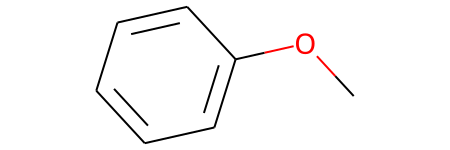

In [33]:
Chem.MolFromSmiles( 'C1=CC=CC(OC)=C1' )

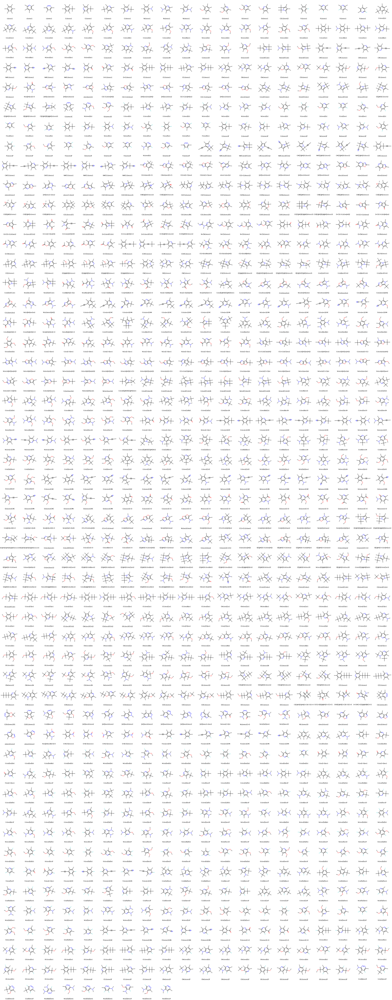

In [28]:
img = Draw.MolsToGridImage( [Chem.AddHs(Chem.MolFromSmiles(s)) for s in df_qm9_new[unique]['SMILES'] ], molsPerRow=20 , maxMols=99999, legends=[s for s in df_qm9_new[unique]['SMILES'] ]) 
display( img )

## The PNL dataset

In [16]:
## Our diene
df_pnl = pd.read_csv('padel_smiles_jan18.csv') 
df_pnl=df_pnl.rename(columns={'Name':'Self_Name'})
df_pnl['source'] = 'PNL'
df_pnl

,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP299,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source
0,-9.223634,-2.514619,C(=C(\C=C)/C#N)\C#N,AUTOGEN_20220118115946188_1,0,0.9424,0.888118,31.5678,15.427172,0,...,0,1,1,1,1,0,0,0,1,PNL
1,-6.825734,-1.951855,C(=C(\C=C)/SC)\C#N,AUTOGEN_20220118115946188_2,0,1.3494,1.820880,39.4072,19.227551,0,...,0,1,1,1,1,0,0,0,1,PNL
2,-6.809339,-1.697690,[CH](/C(=[NH]\C(=O)OCC)/C=C)C#N,AUTOGEN_20220118115946188_3,0,0.6985,0.487902,43.5063,24.551930,0,...,0,1,1,1,1,0,0,0,1,PNL
3,-7.288529,-2.100722,C(=C(\C=C)/OC(=O)C)\C#N,AUTOGEN_20220118115946188_4,0,0.5753,0.330970,37.6331,19.691551,0,...,0,1,1,1,1,0,0,0,1,PNL
4,-7.787972,-2.711582,C(=C(\C=C)/[S@@](O)[O])\C#N,AUTOGEN_20220118115946188_5,0,-0.2641,0.069749,31.0462,19.071551,0,...,0,1,1,1,1,0,0,0,1,PNL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,-7.700120,0.013080,C=C(C=C)OCc1ccccc1,AUTOGEN_20220118130005185_9,0,0.8257,0.681780,25.9534,28.163516,6,...,0,1,1,1,0,0,0,0,1,PNL
4849,-7.771313,-0.047570,C=C(C=C)O[Si](C)(C)C,AUTOGEN_20220118130005185_10,0,2.9683,8.810805,38.5797,27.837102,0,...,0,1,1,1,0,0,0,0,1,PNL
4850,-7.882205,-0.006997,C=C(C=C)CN,AUTOGEN_20220118130313070_1,0,0.4811,0.231457,28.0086,15.901137,0,...,0,1,1,1,0,0,0,0,1,PNL
4851,-8.144926,-0.298054,C=C(C=C)CO,AUTOGEN_20220118130313070_2,0,0.7707,0.593978,26.3511,14.936344,0,...,0,1,1,1,0,0,0,0,1,PNL


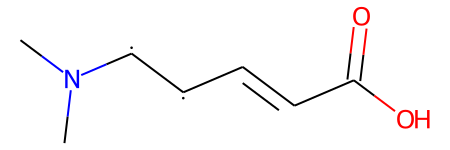

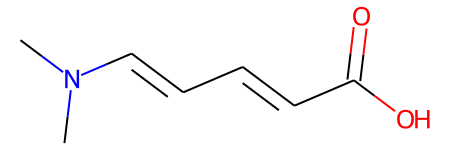

In [17]:
## A hard coded fix for radicals
def correct_single_to_double_bond(s):
    mol =Chem.MolFromSmiles( s )
    #mw = Chem.RWMol(mol)
    atom_idx = []
    for i,atom in enumerate(mol.GetAtoms()):
        if atom.GetNumRadicalElectrons()>0 :
            atom.SetNumRadicalElectrons(0)  
            atom_idx.append(i)
    if len(atom_idx)!=2:
        display(s, 'Number of radicals is wrong  ===========')
    else:
        bond = mol.GetBondBetweenAtoms(atom_idx[0], atom_idx[1]) 
        if bond is not None:
            if bond.GetBondTypeAsDouble()==1.0:
                bond.SetBondType(Chem.rdchem.BondType.DOUBLE)  # Change the bond type to double
            else:
                display(s, 'Wrong bond order is found  ===========')
        else:
            display(s,atom_idx, 'gives a None bond ===========')
    s = Chem.MolToSmiles(mol)
    return s

import re
def correct_SOOH(s):
    old_pattern = '[S@@](O)[O]'
    new_pattern = 'S(O)=O'
    s = re.sub(old_pattern, new_pattern, s)
    return s

smi = '[CH]([CH]/C=C/C(=O)O)N(C)C'
display(Chem.MolFromSmiles( smi ))
smi = correct_single_to_double_bond(smi)
display(Chem.MolFromSmiles( smi ))

In [18]:
%%capture --no-display

mask_valid = [ True if Chem.MolFromSmiles(s) is not None and '.' not in s else False for s in df_pnl['SMILES']]
df_pnl = df_pnl[mask_valid]
display('After valid: ',np.sum(mask_valid))

new_smiles = []
for s in df_pnl['SMILES']:
    mol = Chem.MolFromSmiles(s)
    s = Chem.MolToSmiles(mol, canonical=True , isomericSmiles=True)
    s = s.replace("[S]([O])O","S(=O)O")
    if has_radical(s):
        s = correct_single_to_double_bond(s)
    new_smiles.append(s)
df_pnl['SMILES_corrected'] = new_smiles

mask_without_radical = [ not has_radical(s) for s in df_pnl['SMILES_corrected'] ]
display('Radicals',np.sum(mask_without_radical))

df_pnl = df_pnl[mask_without_radical]
df_pnl

'After valid: '

4584

'CO[C@]1(C)C=C[CH][CH][C]O1'

'Number of radicals is wrong  ==========='

'O=C(O)[N]C1=CC=C[CH]O1'

[3, 8]

'gives a None bond ==========='

'C[S]1([O])(O)[CH][CH]C=CS1'

'Number of radicals is wrong  ==========='

'[C]1[CH]/C=C\\[CH]OCc2ccccc2N1'

'Number of radicals is wrong  ==========='

'[CH]OC(=C)C(=C)C(O)O'

'Number of radicals is wrong  ==========='

'C=C(O[C]O)C(=C)[Si](C)(C)OC'

'Number of radicals is wrong  ==========='

'C=C([C]C)C(=C)[Si](CC)(CC)COC'

'Number of radicals is wrong  ==========='

'[O][S](O)[CH][CH]/C=C/Sc1ccccc1'

'Number of radicals is wrong  ==========='

'Radicals'

4578

,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
0,-9.223634,-2.514619,C(=C(\C=C)/C#N)\C#N,AUTOGEN_20220118115946188_1,0,0.9424,0.888118,31.5678,15.427172,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(C#N)=C\C#N
1,-6.825734,-1.951855,C(=C(\C=C)/SC)\C#N,AUTOGEN_20220118115946188_2,0,1.3494,1.820880,39.4072,19.227551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)SC
3,-7.288529,-2.100722,C(=C(\C=C)/OC(=O)C)\C#N,AUTOGEN_20220118115946188_4,0,0.5753,0.330970,37.6331,19.691551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)OC(C)=O
4,-7.787972,-2.711582,C(=C(\C=C)/[S@@](O)[O])\C#N,AUTOGEN_20220118115946188_5,0,-0.2641,0.069749,31.0462,19.071551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)S(=O)O
5,-7.539353,-2.689519,C(=C(\C=C)/C(=O)OC)\C#N,AUTOGEN_20220118115946188_6,0,0.9189,0.844377,37.3576,19.691551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)C(=O)OC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,-7.700120,0.013080,C=C(C=C)OCc1ccccc1,AUTOGEN_20220118130005185_9,0,0.8257,0.681780,25.9534,28.163516,6,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)OCc1ccccc1
4849,-7.771313,-0.047570,C=C(C=C)O[Si](C)(C)C,AUTOGEN_20220118130005185_10,0,2.9683,8.810805,38.5797,27.837102,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)O[Si](C)(C)C
4850,-7.882205,-0.006997,C=C(C=C)CN,AUTOGEN_20220118130313070_1,0,0.4811,0.231457,28.0086,15.901137,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)CN
4851,-8.144926,-0.298054,C=C(C=C)CO,AUTOGEN_20220118130313070_2,0,0.7707,0.593978,26.3511,14.936344,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)CO


In [19]:
mask_is_diene = [ has_substructure(s) for s in df_pnl['SMILES_corrected']]
df_pnl = df_pnl[mask_is_diene]
df_pnl

,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
0,-9.223634,-2.514619,C(=C(\C=C)/C#N)\C#N,AUTOGEN_20220118115946188_1,0,0.9424,0.888118,31.5678,15.427172,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(C#N)=C\C#N
1,-6.825734,-1.951855,C(=C(\C=C)/SC)\C#N,AUTOGEN_20220118115946188_2,0,1.3494,1.820880,39.4072,19.227551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)SC
3,-7.288529,-2.100722,C(=C(\C=C)/OC(=O)C)\C#N,AUTOGEN_20220118115946188_4,0,0.5753,0.330970,37.6331,19.691551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)OC(C)=O
4,-7.787972,-2.711582,C(=C(\C=C)/[S@@](O)[O])\C#N,AUTOGEN_20220118115946188_5,0,-0.2641,0.069749,31.0462,19.071551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)S(=O)O
5,-7.539353,-2.689519,C(=C(\C=C)/C(=O)OC)\C#N,AUTOGEN_20220118115946188_6,0,0.9189,0.844377,37.3576,19.691551,0,...,1,1,1,1,0,0,0,1,PNL,C=C/C(=C\C#N)C(=O)OC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,-7.700120,0.013080,C=C(C=C)OCc1ccccc1,AUTOGEN_20220118130005185_9,0,0.8257,0.681780,25.9534,28.163516,6,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)OCc1ccccc1
4849,-7.771313,-0.047570,C=C(C=C)O[Si](C)(C)C,AUTOGEN_20220118130005185_10,0,2.9683,8.810805,38.5797,27.837102,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)O[Si](C)(C)C
4850,-7.882205,-0.006997,C=C(C=C)CN,AUTOGEN_20220118130313070_1,0,0.4811,0.231457,28.0086,15.901137,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)CN
4851,-8.144926,-0.298054,C=C(C=C)CO,AUTOGEN_20220118130313070_2,0,0.7707,0.593978,26.3511,14.936344,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=C)CO


In [44]:
## Check duplicates ##
mask_duplicated_items = df_pnl[['SMILES_corrected']].duplicated(keep=False)
counts = df_pnl[mask_duplicated_items]['SMILES_corrected'].value_counts()
for s in counts.index:
    df = df_pnl[ df_pnl['SMILES_corrected']==s ]
    display(df)

,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
10,-5.348368,-0.219771,[CH]([C](C=C)SC)N(C)C,AUTOGEN_20220118115950396_1,0,1.5794,2.494504,46.0389,26.321895,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=CN(C)C)SC
1649,-5.322476,-0.244400,[CH]([C](C=C)SC)N(C)C,AUTOGEN_20220118121908378_10,0,1.5794,2.494504,46.0389,26.321895,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=CN(C)C)SC


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
11,-5.672140,-0.556941,[CH]([C](C=C)C(=O)C)N(C)C,AUTOGEN_20220118115950396_2,0,0.5383,0.289767,43.5428,25.983895,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=CN(C)C)C(C)=O
1650,-5.574002,-0.791071,[CH]([C](C=C)C(=O)C)N(C)C,AUTOGEN_20220118121912730_1,0,0.5383,0.289767,43.5428,25.983895,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(=CN(C)C)C(C)=O


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
18,-7.214277,-0.719185,C(=C(C=C)C=C)C=C,AUTOGEN_20220118115950396_9,0,2.3947,5.734588,39.5401,20.74793,0,...,1,1,1,0,0,0,0,1,PNL,C=CC=C(C=C)C=C
1658,-7.322807,-0.721159,C(=C(C=C)C=C)C=C,AUTOGEN_20220118121912730_9,0,2.3947,5.734588,39.5401,20.74793,0,...,1,1,1,0,0,0,0,1,PNL,C=CC=C(C=C)C=C


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
37,-5.984690,-1.310465,C(=C(C=C)C=C)SC=C,AUTOGEN_20220118120000911_8,0,1.9433,3.776415,45.817,23.64793,0,...,1,1,1,0,0,0,0,1,PNL,C=CSC=C(C=C)C=C
1670,-5.973906,-1.289243,C(=C(C=C)C=C)SC=C,AUTOGEN_20220118121923349_1,0,1.9433,3.776415,45.817,23.64793,0,...,1,1,1,0,0,0,0,1,PNL,C=CSC=C(C=C)C=C


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
66,-6.416224,-1.305006,C(=C(C=C)C=C)OC=O,AUTOGEN_20220118120016811_7,0,1.0062,1.012438,36.2787,19.258344,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=COC=O
1701,-6.486835,-1.260690,C(=C(C=C)C=C)OC=O,AUTOGEN_20220118121941394_2,0,1.0062,1.012438,36.2787,19.258344,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=COC=O


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
161,-6.330813,-1.085078,C(=C(C=C)C=C)OC(=O)O,AUTOGEN_20220118120108602_2,1,1.4772,2.18212,37.2052,20.060344,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=COC(=O)O
1770,-6.424687,-1.042108,C(=C(C=C)C=C)OC(=O)O,AUTOGEN_20220118122020756_1,1,1.4772,2.18212,37.2052,20.060344,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=COC(=O)O


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
233,-6.607052,-1.031649,C(=C(C=C)C=C)[Si](C)(C)C,AUTOGEN_20220118120202980_4,0,4.04,16.3216,45.3753,31.888688,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=C[Si](C)(C)C
1833,-6.610748,-1.014235,C(=C(C=C)C=C)[Si](C)(C)C,AUTOGEN_20220118122109056_4,0,4.04,16.3216,45.3753,31.888688,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=C[Si](C)(C)C


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
252,-6.588045,-1.110561,C(=C(C=C)C=C)[Si](CC)(CC)CC,AUTOGEN_20220118120219055_3,0,3.8774,15.034231,57.9567,41.169446,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=C[Si](CC)(CC)CC
1850,-6.524591,-1.252347,C(=C(C=C)C=C)[Si](CC)(CC)CC,AUTOGEN_20220118122119785_1,0,3.8774,15.034231,57.9567,41.169446,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=C[Si](CC)(CC)CC


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
274,-6.960022,-2.242664,C(=C(C=C)C=C)C=O,AUTOGEN_20220118120233411_5,0,1.3881,1.926822,35.6117,18.456344,0,...,1,1,1,1,0,0,0,1,PNL,C=CC(C=C)=CC=O
1871,-7.045659,-2.369246,C(=C(C=C)C=C)C=O,AUTOGEN_20220118122131584_2,0,1.3881,1.926822,35.6117,18.456344,0,...,1,1,1,1,0,0,0,1,PNL,C=CC(C=C)=CC=O


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
286,-6.807970,-1.440705,C(=C(C=C)C=C)CCl,AUTOGEN_20220118120239058_7,0,2.4431,5.968738,39.7207,20.501137,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CCCl
1880,-6.774968,-1.485604,C(=C(C=C)C=C)CCl,AUTOGEN_20220118122135927_1,0,2.4431,5.968738,39.7207,20.501137,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CCCl


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
323,-5.735246,-0.667540,C(=C(C=C)C=C)OCc1ccccc1,AUTOGEN_20220118120305862_4,0,1.0237,1.047962,34.9659,33.017102,6,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=COCc1ccccc1
1913,-5.877213,-0.667265,C(=C(C=C)C=C)OCc1ccccc1,AUTOGEN_20220118122155013_4,0,1.0237,1.047962,34.9659,33.017102,6,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=COCc1ccccc1


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
344,-5.700130,-0.612623,C(=C(C=C)C=C)O[Si](C)(C)C,AUTOGEN_20220118120325838_5,0,3.1663,10.025456,47.5922,32.690688,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CO[Si](C)(C)C
1931,-5.665217,-0.608409,C(=C(C=C)C=C)O[Si](C)(C)C,AUTOGEN_20220118122213605_2,0,3.1663,10.025456,47.5922,32.690688,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CO[Si](C)(C)C


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
372,-6.586092,-1.022311,C(=C(C=C)C=C)CO,AUTOGEN_20220118120342046_3,0,1.2385,1.533882,36.6697,19.78993,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CCO
1953,-6.565618,-1.100900,C(=C(C=C)C=C)CO,AUTOGEN_20220118122224253_4,0,1.2385,1.533882,36.6697,19.78993,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CCO


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
395,-6.510779,-1.176628,C(=C(C=C)C=C)COCC,AUTOGEN_20220118120354604_6,0,1.8974,3.600127,45.7147,25.977102,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CCOCC
1976,-6.510977,-1.084105,C(=C(C=C)C=C)COCC,AUTOGEN_20220118122235855_7,0,1.8974,3.600127,45.7147,25.977102,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CCOCC


,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SubFP300,SubFP301,SubFP302,SubFP303,SubFP304,SubFP305,SubFP306,SubFP307,source,SMILES_corrected
414,-6.321232,-0.689261,C(=C(C=C)C=C)C,AUTOGEN_20220118120407316_5,0,2.1267,4.522853,35.1254,18.98793,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CC
1992,-6.303754,-0.776265,C(=C(C=C)C=C)C,AUTOGEN_20220118122247524_3,0,2.1267,4.522853,35.1254,18.98793,0,...,1,1,1,0,0,0,0,1,PNL,C=CC(C=C)=CC


In [20]:
df_pnl = df_pnl.drop_duplicates(subset=['SMILES_corrected'])

In [21]:
patterns = ['C=CC=C','N=CC=C','C=NC=C','N=NC=C','N=CN=C','N=CC=N','C=NN=C','N=NN=C','N=NC=N','N=NN=N']
for p in patterns:
    has_diene_pattern(df_pnl, pattern=p, smiles_col='SMILES_corrected')
df_pnl

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'C=CC=C'

4563

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'N=CC=C'

4

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'C=NC=C'

0

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'N=NC=C'

0

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'N=CN=C'

0

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'N=CC=N'

0

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'C=NN=C'

0

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'N=NN=C'

0

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'N=NC=N'

0

C:\Users\zhan051\AppData\Local\Temp\ipykernel_26148\1798344860.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = match_smi


'Match results: '

'N=NN=N'

0

,HOMO,LUMO,SMILES,Self_Name,nAcid,ALogP,ALogp2,AMR,apol,naAromAtom,...,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
0,-9.223634,-2.514619,C(=C(\C=C)/C#N)\C#N,AUTOGEN_20220118115946188_1,0,0.9424,0.888118,31.5678,15.427172,0,...,True,False,False,False,False,False,False,False,False,False
1,-6.825734,-1.951855,C(=C(\C=C)/SC)\C#N,AUTOGEN_20220118115946188_2,0,1.3494,1.820880,39.4072,19.227551,0,...,True,False,False,False,False,False,False,False,False,False
3,-7.288529,-2.100722,C(=C(\C=C)/OC(=O)C)\C#N,AUTOGEN_20220118115946188_4,0,0.5753,0.330970,37.6331,19.691551,0,...,True,False,False,False,False,False,False,False,False,False
4,-7.787972,-2.711582,C(=C(\C=C)/[S@@](O)[O])\C#N,AUTOGEN_20220118115946188_5,0,-0.2641,0.069749,31.0462,19.071551,0,...,True,False,False,False,False,False,False,False,False,False
5,-7.539353,-2.689519,C(=C(\C=C)/C(=O)OC)\C#N,AUTOGEN_20220118115946188_6,0,0.9189,0.844377,37.3576,19.691551,0,...,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,-7.700120,0.013080,C=C(C=C)OCc1ccccc1,AUTOGEN_20220118130005185_9,0,0.8257,0.681780,25.9534,28.163516,6,...,True,False,False,False,False,False,False,False,False,False
4849,-7.771313,-0.047570,C=C(C=C)O[Si](C)(C)C,AUTOGEN_20220118130005185_10,0,2.9683,8.810805,38.5797,27.837102,0,...,True,False,False,False,False,False,False,False,False,False
4850,-7.882205,-0.006997,C=C(C=C)CN,AUTOGEN_20220118130313070_1,0,0.4811,0.231457,28.0086,15.901137,0,...,True,False,False,False,False,False,False,False,False,False
4851,-8.144926,-0.298054,C=C(C=C)CO,AUTOGEN_20220118130313070_2,0,0.7707,0.593978,26.3511,14.936344,0,...,True,False,False,False,False,False,False,False,False,False


In [22]:
patterns_col = [ c for c in df_pnl.columns if 'SMILES_pattern_' in c ]

df_pnl = df_pnl[['HOMO','LUMO','SMILES_corrected','source']+patterns_col]
df_pnl = df_pnl.rename(columns={'SMILES_corrected':'SMILES'})
df_pnl.to_csv('df_pnl_diene_final.csv')
df_pnl

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,False,False,False,False
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,False,False,False,False
3,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,False,False,False,False
4,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,False,False,False,False
5,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,-7.700120,0.013080,C=CC(=C)OCc1ccccc1,PNL,True,False,False,False,False,False,False,False,False,False
4849,-7.771313,-0.047570,C=CC(=C)O[Si](C)(C)C,PNL,True,False,False,False,False,False,False,False,False,False
4850,-7.882205,-0.006997,C=CC(=C)CN,PNL,True,False,False,False,False,False,False,False,False,False
4851,-8.144926,-0.298054,C=CC(=C)CO,PNL,True,False,False,False,False,False,False,False,False,False


## Now combine two dataset to make the final diene

In [3]:
## Jump start with final data
df_qm9 = pd.read_csv('df_qm9_diene_final.csv', index_col=0 )
df_pnl = pd.read_csv('df_pnl_diene_final.csv', index_col=0 )
display(df_pnl, df_qm9)

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,False,False,False,False
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,False,False,False,False
3,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,False,False,False,False
4,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,False,False,False,False
5,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,-7.700120,0.013080,C=CC(=C)OCc1ccccc1,PNL,True,False,False,False,False,False,False,False,False,False
4849,-7.771313,-0.047570,C=CC(=C)O[Si](C)(C)C,PNL,True,False,False,False,False,False,False,False,False,False
4850,-7.882205,-0.006997,C=CC(=C)CN,PNL,True,False,False,False,False,False,False,False,False,False
4851,-8.144926,-0.298054,C=CC(=C)CO,PNL,True,False,False,False,False,False,False,False,False,False


,HOMO,LUMO,SMILES,name,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N,source
49,-5.521051,1.357814,[nH]1cccc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000050.xyz,True,False,False,False,False,False,False,False,False,False,QM9
50,-6.130571,0.903395,[nH]1ccnc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000051.xyz,False,False,True,False,False,False,False,False,False,False,QM9
51,-6.111523,0.541493,o1cccc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000052.xyz,True,False,False,False,False,False,False,False,False,False,QM9
52,-6.827165,0.027211,o1ccnc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000053.xyz,False,False,True,False,False,False,False,False,False,False,QM9
164,-6.633969,0.650336,[nH]1cccn1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_000165.xyz,False,True,False,False,False,False,False,False,False,False,QM9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133476,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133477.xyz,False,False,False,False,False,True,False,False,False,False,QM9
133477,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133478.xyz,False,True,False,False,False,False,False,False,False,False,QM9
133478,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133479.xyz,False,False,False,False,True,False,False,False,False,False,QM9
133479,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133480.xyz,False,False,False,False,False,True,False,False,False,False,QM9


In [4]:
patterns_col = [ c for c in df_pnl.columns if 'SMILES_pattern_' in c ]
for p in patterns_col:
    df1 = df_pnl[df_pnl[p]==True]
    df2 = df_qm9[df_qm9[p]==True]
    print( p, 'PNL', df1.shape, 'QM9', df2.shape)

SMILES_pattern_C=CC=C PNL (4563, 14) QM9 (5935, 15)
SMILES_pattern_N=CC=C PNL (4, 14) QM9 (6524, 15)
SMILES_pattern_C=NC=C PNL (0, 14) QM9 (5177, 15)
SMILES_pattern_N=NC=C PNL (0, 14) QM9 (1574, 15)
SMILES_pattern_N=CN=C PNL (0, 14) QM9 (1530, 15)
SMILES_pattern_N=CC=N PNL (0, 14) QM9 (1549, 15)
SMILES_pattern_C=NN=C PNL (0, 14) QM9 (171, 15)
SMILES_pattern_N=NN=C PNL (0, 14) QM9 (88, 15)
SMILES_pattern_N=NC=N PNL (0, 14) QM9 (389, 15)
SMILES_pattern_N=NN=N PNL (0, 14) QM9 (82, 15)


In [5]:
df_pnl[ df_pnl['SMILES_pattern_N=CC=C']==True ]

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N
900,-7.929259,-2.422617,FC1=NC(F)(F)C=CC=C1,PNL,True,True,False,False,False,False,False,False,False,False
970,-6.737292,-2.016802,C1=CC=N[SiH2]C=C1,PNL,True,True,False,False,False,False,False,False,False,False
1080,-6.918781,-1.986051,ClC1=NCC=CC=C1,PNL,True,True,False,False,False,False,False,False,False,False
3445,-5.049203,-1.069046,C=C1C=NC[Si](C)(C)OC1=C,PNL,True,True,False,False,False,False,False,False,False,False


In [6]:
#df_qm9_new['source']='QM9', df_pnl['source']='PNL'
df_diene = pd.concat( [df_pnl, df_qm9], axis=0, join='outer', ignore_index = True)
df_diene

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N,name
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,False,False,False,False,NaN
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,False,False,False,False,NaN
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,False,False,False,False,NaN
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,False,False,False,False,NaN
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,False,False,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133477.xyz
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133478.xyz
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133479.xyz
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133480.xyz


In [8]:
%%capture --no-display
# Now double check things 

#= [ has_radical(s) 
mask_valid = [False if Chem.MolFromSmiles(s) is None else True for s in df_diene['SMILES']]
display( 'valid data:', np.sum(mask_valid) )

mask_no_radical = [ not has_radical(s) for s in df_diene['SMILES'] ]
display( 'without radical:', np.sum(mask_no_radical) )

#mask_is_diene = [ has_substructure(s) for s in df_diene['SMILES'] ]
#display( 'Has diene substruct:', np.sum(mask_is_diene) )

display( 'Num of QM9 data: ', np.sum( df_diene['source']=='QM9' ) )
display( 'Num of PNL data: ', np.sum( df_diene['source']=='PNL' ) )

'valid data:'

23146

'without radical:'

23146

'Num of QM9 data: '

18583

'Num of PNL data: '

4563

In [9]:
%%capture --no-display

def get_inchi( smi_column ):
    c_inchi = []
    for smi in smi_column:
        try:
            mol = Chem.MolFromSmiles(smi)
            inchi = Chem.MolToInchi(mol)
        except:
            display(smi, 'is bad solute')
            inchi = 'NotFound'
        c_inchi.append(inchi)
    return c_inchi

df_diene['Inchi'] = get_inchi(df_diene['SMILES'])
display( df_diene)

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N,name,Inchi
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C6H4N2/c1-2-6(5-8)3-4-7/h2-3H,1H2/b6-3+"
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C6H7NS/c1-3-6(8-2)4-5-7/h3-4H,1H2,2H3..."
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C7H7NO2/c1-3-7(4-5-8)10-6(2)9/h3-4H,1..."
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C5H5NO2S/c1-2-5(3-4-6)9(7)8/h2-3H,1H2..."
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C7H7NO2/c1-3-6(4-5-8)7(9)10-2/h3-4H,1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133477.xyz,"InChI=1S/C3H2F3N3/c4-3(5,6)2-1-7-9-8-2/h1H,(H,..."
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133478.xyz,"InChI=1S/C4H2F3NO/c5-4(6,7)3-1-2-9-8-3/h1-2H"
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133479.xyz,"InChI=1S/C3HF3N2O/c4-3(5,6)2-7-1-9-8-2/h1H"
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133480.xyz,"InChI=1S/C3HF3N2O/c4-3(5,6)2-1-7-9-8-2/h1H"


In [10]:
df_diene.to_csv('df_diene_combined.csv')

# Read the combined df with inch, and data analysis

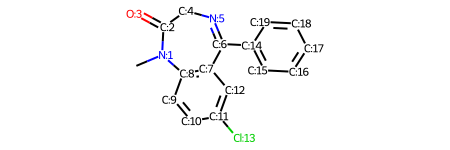

[0, 0, 0, 2, 1, 0, 0, 0, 0]


In [6]:
def mol_with_atom_index(mol):
    for atom in mol.GetAtoms():
        atom.SetAtomMapNum(atom.GetIdx())
    return mol

def find_rings(smi):
    mol = Chem.MolFromSmiles(smi)
    ri = mol.GetRingInfo()
    atominfo = ri.AtomRings()
    return atominfo

def get_rings_count(smi, ring_min=3, ring_max=12):
    rings = find_rings(smi)
    rings = [ len(r) for r in rings ]
    rings = [ rings.count(i) for i in range(ring_min,ring_max) ]
    return rings

def locate_func( smi, pattern='C=CC=C', pattern_ngb=[1,2,2,1] ):
    """
    return a dict: key=location, value=functionl groups
    """
    pattern = Chem.MolFromSmiles(pattern)
    mol = Chem.MolFromSmiles(smi)
    #display(mol)
    #display( mol_with_atom_index(mol) )
    atoms_in_diene = mol.GetSubstructMatches(pattern)[0]
    bonds = [ mol.GetAtomWithIdx(at).GetBonds() for at in atoms_in_diene ]
    output = {}
    dummy_atom = Chem.Atom(82)
    for ii,(at,bond,patt) in enumerate(zip(atoms_in_diene,bonds,pattern_ngb)):
        if len(bond)>patt: ## There is a func here
            func_bond = [b for b in bond if b.GetBeginAtom().GetIdx() not in atoms_in_diene or b.GetEndAtom().GetIdx() not in atoms_in_diene]
            func_bond = [ b.GetIdx() for b in func_bond]
            mol_fragments = Chem.FragmentOnBonds( mol, func_bond , addDummies=True , dummyLabels=[(0,0) for b in func_bond] )
            mol_fragments = Chem.RWMol(mol_fragments)            
            mol_fragments.ReplaceAtom(at, dummy_atom)
            mol_fragments = Chem.GetMolFrags(mol_fragments, asMols=True)
            mol_fragments = [ fragment for fragment in mol_fragments if not any(a.GetSymbol()=='Pb' for a in fragment.GetAtoms()) ]

            mol_fragments = [ Chem.MolToSmiles(m, canonical=True, isomericSmiles=True) for m in mol_fragments]
            output[ii] = mol_fragments
    return output

s = 'CN1C(=O)CN=C(C2=C1C=CC(=C2)Cl)C3=CC=CC=C3'
mol = Chem.MolFromSmiles( s )
display( mol_with_atom_index(mol) )
print(  get_rings_count(s) )

## Add rdkit property to df

In [6]:
## Jump start with combined dataset, un-sorted
df_diene = pd.read_csv('df_diene_combined.csv', index_col=0)
display( df_diene )

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,SMILES_pattern_N=NN=C,SMILES_pattern_N=NC=N,SMILES_pattern_N=NN=N,name,Inchi
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C6H4N2/c1-2-6(5-8)3-4-7/h2-3H,1H2/b6-3+"
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C6H7NS/c1-3-6(8-2)4-5-7/h3-4H,1H2,2H3..."
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C7H7NO2/c1-3-7(4-5-8)10-6(2)9/h3-4H,1..."
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C5H5NO2S/c1-2-5(3-4-6)9(7)8/h2-3H,1H2..."
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,False,False,False,False,NaN,"InChI=1S/C7H7NO2/c1-3-6(4-5-8)7(9)10-2/h3-4H,1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133477.xyz,"InChI=1S/C3H2F3N3/c4-3(5,6)2-1-7-9-8-2/h1H,(H,..."
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133478.xyz,"InChI=1S/C4H2F3NO/c5-4(6,7)3-1-2-9-8-3/h1-2H"
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133479.xyz,"InChI=1S/C3HF3N2O/c4-3(5,6)2-7-1-9-8-2/h1H"
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,False,False,False,False,QM9 dataset/dsgdb9nsd.xyz\dsgdb9nsd_133480.xyz,"InChI=1S/C3HF3N2O/c4-3(5,6)2-1-7-9-8-2/h1H"


In [7]:
#%%capture --no-display
## Double check ##
def check_error(smiles):
    try:
        Chem.RDKFingerprint(Chem.MolFromSmiles(smiles))
        return True
    except:
        return False

mask1 = [ check_error(s) for s in df_diene['SMILES'] ]
mask2 = df_diene['Inchi']!='NotFound'
mask_all = np.all([mask1,mask2], axis=0)
print( np.sum(mask_all) )

#df_diene.replace([np.inf, -np.inf], np.nan, inplace=True)
#df_diene = df_diene.dropna(axis='rows')

23146


In [8]:
#%%capture --no-display

## Skip if generated already
fp_names_prop = [ n[0] for n in Descriptors._descList if not n[0].startswith('fr_')]
fp_names_prop.remove('Ipc')  ## https://github.com/rdkit/rdkit/issues/1527
print( len(fp_names_prop) )

from rdkit.ML.Descriptors import MoleculeDescriptors
calc = MoleculeDescriptors.MolecularDescriptorCalculator(fp_names_prop)   

fp_data = []
for sour,smi in zip(df_diene['source'], df_diene['SMILES']):
    try:
        fp = calc.CalcDescriptors( Chem.MolFromSmiles(smi) )
        #fp_data.append( list(y)+list(fp) )
        fp_data.append( fp )
    except:
        fp_data.append( list( np.full(len(fp_names_prop),-11111) ) )
        print(smi, 'has problem')
    
X_prop = pd.DataFrame(fp_data, columns=fp_names_prop)

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
X_prop = X_prop.select_dtypes(include=numerics)

#X_features_prop.to_csv('fp_rdk_phychem_property.csv')
X_prop = X_prop.dropna(axis='columns')
X_prop


122


,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR
0,8.116481,0.298611,8.116481,0.298611,0.369706,104.112,100.080,104.037448,38,0,...,2,0,2,1,0,0,0,0,1.14596,29.5060
1,8.111389,0.909722,8.111389,0.909722,0.415726,125.196,118.140,125.029920,42,0,...,2,0,2,2,0,0,0,0,1.94288,37.4080
2,10.267630,-0.457037,10.267630,0.175926,0.248012,137.138,130.082,137.047678,52,0,...,3,0,3,2,0,0,0,0,1.14298,35.6590
3,10.140926,-2.082701,10.140926,0.025463,0.353094,143.167,138.127,143.004099,48,0,...,2,1,4,2,0,0,0,0,0.80158,34.6642
4,10.620093,-0.544861,10.620093,0.171296,0.244563,137.138,130.082,137.047678,52,0,...,3,0,3,2,0,0,0,0,0.79538,35.9090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,11.498704,-4.381944,11.498704,0.625000,0.574742,137.064,135.048,137.020082,50,0,...,2,1,6,0,0,0,0,1,0.82350,21.3847
23142,11.498704,-4.381944,11.498704,0.763889,0.543365,137.060,135.044,137.008848,50,0,...,2,0,5,0,0,0,0,1,1.69340,21.5050
23143,11.436204,-4.493056,11.436204,0.627801,0.538119,138.048,137.040,138.004097,50,0,...,3,0,6,0,0,0,0,1,1.08840,19.3000
23144,11.458704,-4.444444,11.458704,0.513889,0.538119,138.048,137.040,138.004097,50,0,...,3,0,6,0,0,0,0,1,1.08840,19.3000


In [9]:
X_prop.columns = [ 'rdk_'+c for c in X_prop.columns ]
df_diene = pd.concat( [df_diene,X_prop], axis=1, join='inner' )
df_diene.to_csv('df_diene_combined_with_rdkprop.csv')
df_diene

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,rdk_NumHAcceptors,rdk_NumHDonors,rdk_NumHeteroatoms,rdk_NumRotatableBonds,rdk_NumSaturatedCarbocycles,rdk_NumSaturatedHeterocycles,rdk_NumSaturatedRings,rdk_RingCount,rdk_MolLogP,rdk_MolMR
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,2,0,2,1,0,0,0,0,1.14596,29.5060
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,2,0,2,2,0,0,0,0,1.94288,37.4080
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,3,0,3,2,0,0,0,0,1.14298,35.6590
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,2,1,4,2,0,0,0,0,0.80158,34.6642
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,3,0,3,2,0,0,0,0,0.79538,35.9090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,...,2,1,6,0,0,0,0,1,0.82350,21.3847
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,...,2,0,5,0,0,0,0,1,1.69340,21.5050
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,...,3,0,6,0,0,0,0,1,1.08840,19.3000
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,...,3,0,6,0,0,0,0,1,1.08840,19.3000


## All data together without pattern match

In [10]:
df_diene = pd.read_csv('df_diene_combined_with_rdkprop.csv', index_col=0)
df_diene

C:\Users\zhan051\AppData\Local\Temp\ipykernel_13436\1266745574.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene = pd.read_csv('df_diene_combined_with_rdkprop.csv', index_col=0)


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,rdk_NumHAcceptors,rdk_NumHDonors,rdk_NumHeteroatoms,rdk_NumRotatableBonds,rdk_NumSaturatedCarbocycles,rdk_NumSaturatedHeterocycles,rdk_NumSaturatedRings,rdk_RingCount,rdk_MolLogP,rdk_MolMR
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,2,0,2,1,0,0,0,0,1.14596,29.5060
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,2,0,2,2,0,0,0,0,1.94288,37.4080
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,3,0,3,2,0,0,0,0,1.14298,35.6590
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,2,1,4,2,0,0,0,0,0.80158,34.6642
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,3,0,3,2,0,0,0,0,0.79538,35.9090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,...,2,1,6,0,0,0,0,1,0.82350,21.3847
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,...,2,0,5,0,0,0,0,1,1.69340,21.5050
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,...,3,0,6,0,0,0,0,1,1.08840,19.3000
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,...,3,0,6,0,0,0,0,1,1.08840,19.3000


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

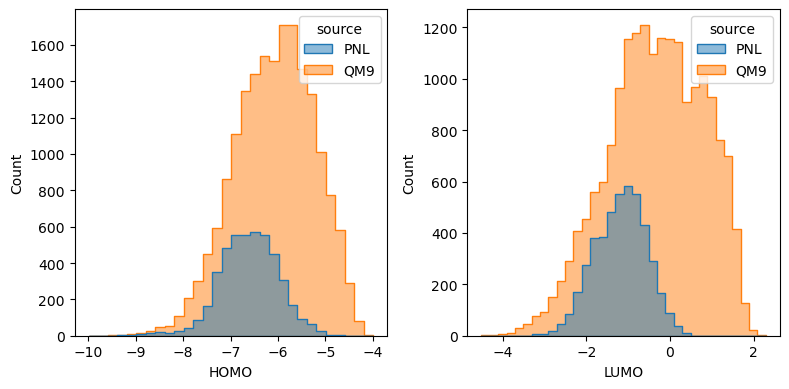

In [11]:
# Compute the ring counts
ring_considered_min, ring_considered_max = 3,12
ring_col = [ 'RingCount_'+str(i) for i in range(ring_considered_min, ring_considered_max) ]

data = [ get_rings_count(s, ring_min=ring_considered_min, ring_max=ring_considered_max) for s in df_diene['SMILES'] ]
df_ring = pd.DataFrame(data, columns=ring_col)
#df_ring['source'] = df_diene['source']
df_ring

,RingCount_3,RingCount_4,RingCount_5,RingCount_6,RingCount_7,RingCount_8,RingCount_9,RingCount_10,RingCount_11
0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
23141,0,0,1,0,0,0,0,0,0
23142,0,0,1,0,0,0,0,0,0
23143,0,0,1,0,0,0,0,0,0
23144,0,0,1,0,0,0,0,0,0


In [12]:
df_diene = pd.concat( [df_diene, df_ring], axis=1)
df_diene

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,rdk_MolMR,RingCount_3,RingCount_4,RingCount_5,RingCount_6,RingCount_7,RingCount_8,RingCount_9,RingCount_10,RingCount_11
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,29.5060,0,0,0,0,0,0,0,0,0
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,37.4080,0,0,0,0,0,0,0,0,0
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,35.6590,0,0,0,0,0,0,0,0,0
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,34.6642,0,0,0,0,0,0,0,0,0
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,35.9090,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,...,21.3847,0,0,1,0,0,0,0,0,0
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,...,21.5050,0,0,1,0,0,0,0,0,0
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,...,19.3000,0,0,1,0,0,0,0,0,0
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,...,19.3000,0,0,1,0,0,0,0,0,0


In [13]:
df_diene.to_csv('df_diene_combined_final.csv')

In [11]:
print(
    np.sum(df_diene['source'] =='PNL'),
    np.sum(df_diene['source'] =='QM9')
)

print(
    np.any( df_ring[ df_diene['source'] =='PNL' ]>0, axis=1 ).sum(),
    np.any( df_ring[ df_diene['source'] =='QM9' ]>0, axis=1 ).sum()
)

4563 18583
802 18567


In [12]:
df_pnl = np.sum( df_ring[ df_diene['source'] =='PNL' ]>0, axis=0)
df_qm9 = np.sum( df_ring[ df_diene['source'] =='QM9' ]>0, axis=0)
#display( df_pnl, df_qm9 )
df_ring_count = pd.concat( [df_pnl, df_qm9], axis=1)
df_ring_count.columns = ['PNL','QM9']
df_ring_count

,PNL,QM9
RingCount_3,6,1530
RingCount_4,10,635
RingCount_5,0,14262
RingCount_6,788,4285
RingCount_7,15,509
RingCount_8,1,57
RingCount_9,1,26
RingCount_10,0,0
RingCount_11,0,0


<AxesSubplot:>

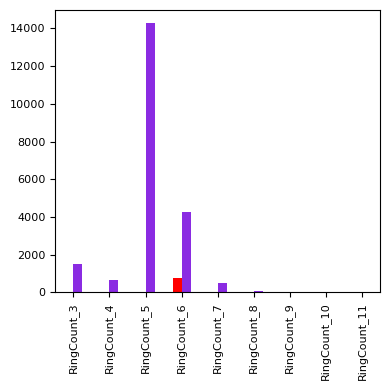

In [13]:
fig, axs = plt.subplots(1,1,figsize=(4,4),tight_layout=True,dpi=100)
#sns.histplot(df_ring, x='Ring_count_6', hue='source', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='HOMO',  
#sns.histplot(df_diene, x='LUMO', hue='source', kde=False, binwidth=0.2, ax=axs[1], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO',  
df_ring_count.plot(kind='bar', y=['PNL','QM9'], color=['red','blueviolet'], ax=axs, legend=False, fontsize=8)  ##figsize=(12,3)

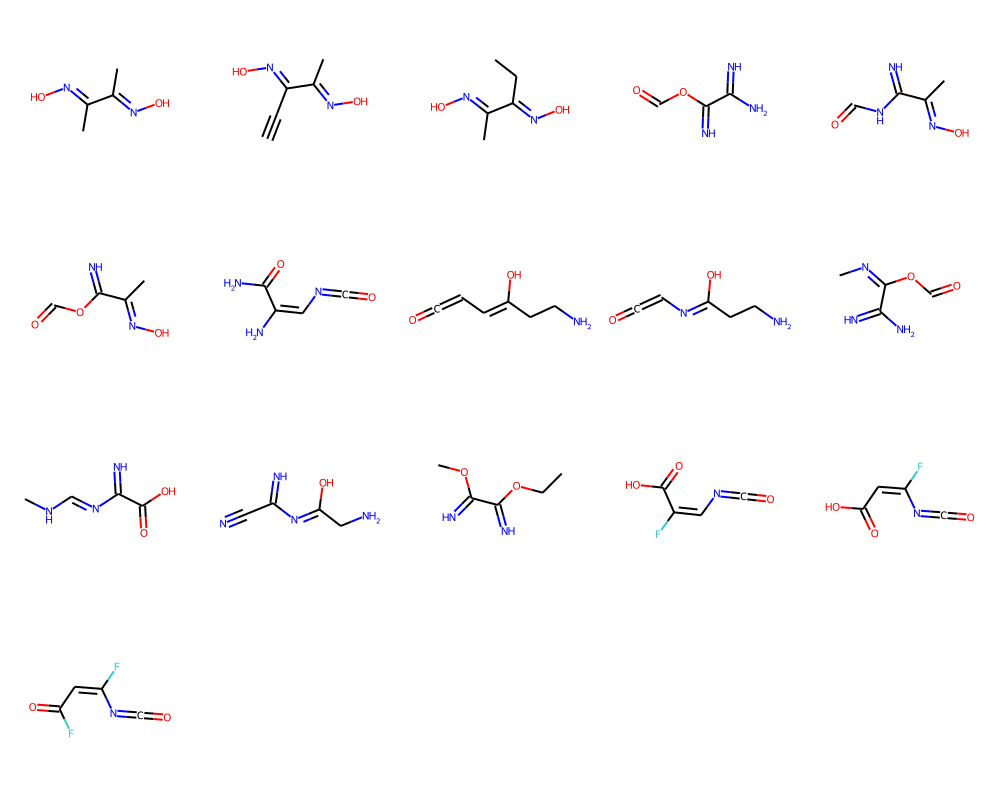

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,rdk_NumHAcceptors,rdk_NumHDonors,rdk_NumHeteroatoms,rdk_NumRotatableBonds,rdk_NumSaturatedCarbocycles,rdk_NumSaturatedHeterocycles,rdk_NumSaturatedRings,rdk_RingCount,rdk_MolLogP,rdk_MolMR
4656,-6.198597,-0.887069,C/C(=N\O)/C(=N/O)/C,QM9,False,False,False,False,False,True,...,4,2,4,1,0,0,0,0,0.68660,29.7910
5110,-6.293835,-1.417677,C/C(=N\O)/C(=N/O)/C#C,QM9,False,False,False,False,False,True,...,4,2,4,1,0,0,0,0,0.29990,32.9500
5111,-6.212203,-0.895232,CC/C(=N\O)/C(=N/O)/C,QM9,False,False,False,False,False,True,...,4,2,4,2,0,0,0,0,1.07670,34.4080
6328,-6.742811,-1.676179,NC(=N)C(=N)OC=O,QM9,False,False,False,False,False,True,...,4,3,5,1,0,0,0,0,-0.92736,26.7898
7688,-7.004034,-1.412235,C/C(=N\O)/C(=N)NC=O,QM9,False,False,False,False,False,True,...,4,3,5,2,0,0,0,0,-0.44023,31.8219
7689,-7.376821,-1.722437,C/C(=N\O)/C(=N)OC=O,QM9,False,False,False,False,False,True,...,5,2,5,2,0,0,0,0,-0.01323,29.7712
10321,-5.893838,-1.091149,NC(=O)/C(=C\N=C=O)/N,QM9,False,False,True,False,False,False,...,4,2,5,2,0,0,0,0,-1.39240,29.5863
14880,-4.527860,-0.087074,NCC/C(=C/C=C=O)/O,QM9,True,False,False,False,False,False,...,3,2,3,3,0,0,0,0,0.16490,34.6467
14881,-5.001327,-0.247617,NCC/C(=N/C=C=O)/O,QM9,False,False,True,False,False,False,...,3,2,4,3,0,0,0,0,-0.36300,33.9987
15661,-6.906076,-1.344209,C/N=C(/OC=O)\C(=N)N,QM9,False,False,False,False,False,True,...,4,2,5,1,0,0,0,0,-0.87633,32.4221


In [41]:
#df = df_diene[ np.all([df_diene['source'] =='PNL', df_ring['Ring_count_4']>0],axis=0) ]
df = df_diene[ np.all([df_diene['source'] =='QM9', np.all(df_ring==0,axis=1)],axis=0) ]
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(s) for s in df['SMILES']], molsPerRow=5 ) ##, legends=[str(p) for p in top['LUMO']] )  
display(img)
df

## Jump start at all data descriptor

In [112]:
df_diene = pd.read_csv('df_diene_combined_final.csv', index_col=0)
df_diene

C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\1548734449.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene = pd.read_csv('df_diene_combined_final.csv', index_col=0)


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,rdk_MolMR,RingCount_3,RingCount_4,RingCount_5,RingCount_6,RingCount_7,RingCount_8,RingCount_9,RingCount_10,RingCount_11
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,29.5060,0,0,0,0,0,0,0,0,0
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,37.4080,0,0,0,0,0,0,0,0,0
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,35.6590,0,0,0,0,0,0,0,0,0
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,34.6642,0,0,0,0,0,0,0,0,0
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,35.9090,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,...,21.3847,0,0,1,0,0,0,0,0,0
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,...,21.5050,0,0,1,0,0,0,0,0,0
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,...,19.3000,0,0,1,0,0,0,0,0,0
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,...,19.3000,0,0,1,0,0,0,0,0,0


In [113]:
df_padelpy = pd.read_csv('df_merged.csv', index_col=0)
df_padelpy = df_padelpy.drop(['Unnamed: 0'],axis=1)

df_padelpy.columns = [ 'padelpy_'+c for c in df_padelpy.columns ]

df_padelpy

,padelpy_nAcid,padelpy_ALogP,padelpy_ALogp2,padelpy_AMR,padelpy_apol,padelpy_naAromAtom,padelpy_nAromBond,padelpy_nAtom,padelpy_nHeavyAtom,padelpy_nH,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
0,0.0,0.9424,0.888118,31.5678,15.427172,0.0,0.0,12.0,8.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.3494,1.820880,39.4072,19.227551,0.0,0.0,15.0,8.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.5753,0.330970,37.6331,19.691551,0.0,0.0,17.0,10.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0190,0.000361,37.3600,17.737965,0.0,0.0,14.0,9.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.9189,0.844377,37.3576,19.691551,0.0,0.0,17.0,10.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,0.0,0.6777,0.459277,9.7346,11.584586,5.0,5.0,11.0,9.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23142,0.0,0.9440,0.891136,8.0537,11.946586,5.0,5.0,11.0,9.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23143,0.0,0.9440,0.891136,8.0537,10.619793,5.0,5.0,10.0,9.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23144,0.0,0.9440,0.891136,8.0537,10.619793,5.0,5.0,10.0,9.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [114]:
df_diene_all_descriptor = pd.concat( [df_diene, df_padelpy], axis=1, join='inner')

df_diene_all_descriptor = df_diene_all_descriptor[df_diene_all_descriptor['padelpy_PubchemFP880']!= -11111]

df_diene_all_descriptor.to_csv('df_diene_all_descriptor.csv')
df_diene_all_descriptor

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23142,-7.869334,-1.036728,FC(F)(F)c1nocc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23144,-9.281570,-2.005429,FC(F)(F)c1nonc1,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Add QM7x

In [116]:
## Add qm7x
df_qm7x = pd.read_csv('qm7x/df_diene_all_descriptor_qm7x.csv', index_col=0)
df_qm7x

,SMILES,HOMO,LUMO,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,SMILES_pattern_C=NN=C,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
0,c1ccco1,-6.61098,0.17147,True,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
1,C=CC=C,-6.81499,-0.93124,True,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
2,O/N=C/C=C,-6.91925,-1.29535,False,True,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
3,C1CC=CC=C1,-6.04995,-0.78512,True,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
4,C=C1CCC=C1,-6.20398,-0.59982,True,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
925,O=Cc1nccs1,-7.76610,-2.63332,False,False,True,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
926,OCc1nccs1,-6.95057,-0.79191,False,False,True,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
927,On1ccc(c1)Cl,-6.41537,-0.27581,True,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
928,O=S1(=O)C=CC=C1,-7.71338,-2.63903,True,False,False,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0


In [117]:
df_diene_all_descriptor = pd.concat( [df_diene_all_descriptor, df_qm7x], axis=0, join='outer')
df_diene_all_descriptor

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
925,-7.766100,-2.633320,O=Cc1nccs1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
926,-6.950570,-0.791910,OCc1nccs1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
927,-6.415370,-0.275810,On1ccc(c1)Cl,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
928,-7.713380,-2.639030,O=S1(=O)C=CC=C1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [123]:
mask_duplicated_items = df_diene_all_descriptor[['SMILES']].duplicated(keep=False)
for smi in df_diene_all_descriptor[mask_duplicated_items]['SMILES'].value_counts().index:
    display(df_diene_all_descriptor[df_diene_all_descriptor['SMILES']==smi])

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
2507,-6.247767,-0.438003,C/C=C/C=C/CN,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
237,-6.071340,-0.421030,C/C=C/C=C/CN,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4844,-5.404045,0.367344,CNc1cocn1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
622,-5.987410,-0.083610,CNc1cocn1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4871,-6.206761,-0.005442,C#Cc1c[nH]nc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
223,-6.847560,-0.362450,C#Cc1c[nH]nc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4870,-7.365936,-1.902028,C#Cc1cnno1,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
557,-7.922570,-2.091820,C#Cc1cnno1,QM7X,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4868,-6.878865,-1.319719,C#Cc1ccno1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
548,-7.416930,-1.564770,C#Cc1ccno1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4866,-5.940096,-0.775505,C1OCC=CC=C1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
353,-6.440710,-1.160370,C1OCC=CC=C1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4865,-5.706084,-0.53333,C1CC=CC=CC1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
90,-6.196010,-0.86584,C1CC=CC=CC1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4851,-5.433977,1.289787,CCn1cccc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
272,-5.954880,0.294900,CCn1cccc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4850,-6.481589,0.214965,OCc1cocn1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
742,-6.978900,-0.162670,OCc1cocn1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4849,-6.114244,0.45714,OCc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
458,-6.361220,0.13429,OCc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4847,-5.586357,1.151013,OCc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
729,-5.861090,0.315930,OCc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4846,-5.697921,0.674825,COc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
437,-6.122600,0.150050,COc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4845,-5.13738,1.409514,COc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
629,-5.61138,0.311420,COc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4843,-5.164591,0.848974,CNc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
618,-5.708050,0.319280,CNc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
2508,-6.492688,-0.726122,C/C=C/C=C/CO,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
410,-6.413720,-0.836330,C/C=C/C=C/CO,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4841,-4.636703,1.564615,CNc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
295,-5.193620,0.380530,CNc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4840,-6.495194,0.234012,CCc1cocn1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
564,-6.966020,-0.179350,CCc1cocn1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4839,-5.945538,0.647615,CCc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
397,-6.417400,0.278230,CCc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4837,-5.412208,1.401351,CCc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
211,-5.926810,0.338030,CCc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4836,-6.761859,-0.103401,OCc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
746,-6.880900,-0.089790,OCc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4835,-5.806763,0.971422,OCc1ncc[nH]1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
745,-6.313520,-0.095190,OCc1ncc[nH]1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4834,-6.61220,-0.040816,OCc1cnco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
736,-6.88883,-0.201670,OCc1cnco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4833,-5.850301,0.821763,OCc1cnc[nH]1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
735,-6.268190,-0.160640,OCc1cnc[nH]1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4832,-5.986354,0.38095,OCc1ccco1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
457,-6.274050,0.10088,OCc1ccco1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4831,-5.327855,1.096591,OCc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
728,-5.738320,0.006400,OCc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4830,-6.563221,0.141496,NCc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
698,-6.795970,-0.089530,NCc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4873,-6.791791,-0.862579,C#Cc1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
560,-7.397480,-1.138680,C#Cc1conc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4874,-7.085666,-1.455772,C#Cc1conn1,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
570,-7.785340,-1.659000,C#Cc1conn1,QM7X,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4875,-7.643486,-1.812233,C#Cc1ncno1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
576,-8.144730,-2.045240,C#Cc1ncno1,QM7X,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4881,-7.559132,-1.439446,C#Cc1nocn1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
579,-8.109650,-1.660440,C#Cc1nocn1,QM7X,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5093,-6.492473,0.470745,OCc1c[nH]nc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
739,-6.828610,0.138500,OCc1c[nH]nc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5090,-7.025803,-0.399997,OCc1ccno1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
731,-7.346160,-0.491890,OCc1ccno1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5089,-6.285672,0.682989,OCc1ccn[nH]1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
730,-6.744690,-0.155190,OCc1ccn[nH]1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5068,-7.341447,-1.866654,O=Cc1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
741,-8.024340,-2.157000,O=Cc1conc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5064,-7.531922,-2.359168,O=Cc1ccno1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
732,-8.230890,-2.624230,O=Cc1ccno1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5010,-7.907429,-1.548289,N#Cc1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
694,-8.480310,-1.753930,N#Cc1conc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5008,-7.284304,-0.663941,N#Cc1c[nH]nc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
329,-7.890400,-0.922570,N#Cc1c[nH]nc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4999,-6.391793,-0.258502,COc1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
636,-6.919460,-0.692480,COc1conc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4998,-5.689757,0.647615,COc1c[nH]nc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
635,-6.437760,0.216980,COc1c[nH]nc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4996,-6.253019,0.195917,COc1ccno1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
631,-6.973790,-0.158430,COc1ccno1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4984,-5.730573,-0.065306,CNc1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
621,-6.292000,-0.436350,CNc1conc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4971,-5.836695,1.09387,Cn1nccc1O,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
615,-6.407130,-0.04686,Cn1nccc1O,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4969,-6.20404,0.799995,Cn1nccc1C,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
178,-6.66791,0.206030,Cn1nccc1C,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4951,-6.438052,0.710199,CCn1cccn1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
274,-6.988370,0.203910,CCn1cccn1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4948,-7.899266,-0.617683,CCc1nocn1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
577,-8.275000,-0.869690,CCc1nocn1,QM7X,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4942,-7.768655,-0.614962,CCc1ncno1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
574,-8.113270,-0.708330,CCc1ncno1,QM7X,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4941,-7.295189,-0.96598,CCc1conn1,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
568,-7.902660,-1.19100,CCc1conn1,QM7X,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4940,-6.922402,-0.22857,CCc1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
558,-7.414910,-0.49502,CCc1conc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4938,-6.323767,0.723805,CCc1c[nH]nc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
224,-6.846170,0.326580,CCc1c[nH]nc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4937,-7.32512,-0.946932,CCc1cnno1,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
555,-7.86867,-1.072020,CCc1cnno1,QM7X,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4935,-6.851654,-0.187754,CCc1ccno1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
546,-7.300800,-0.409760,CCc1ccno1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4932,-7.896545,-0.887069,Cc1nonc1C,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
536,-8.405700,-1.107100,Cc1nonc1C,QM7X,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4913,-6.261182,0.239454,Cc1conc1N,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
508,-6.739560,-0.121430,Cc1conc1N,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4829,-6.057102,0.63673,COc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
638,-6.618170,0.25439,COc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4828,-5.46663,1.395909,COc1ncc[nH]1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
637,-6.05262,0.293260,COc1ncc[nH]1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4827,-6.019007,0.310202,COc1cnco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
633,-6.535130,0.016770,COc1cnco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4787,-5.997238,-0.424487,C#Cc1ncc[nH]1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
227,-6.566180,-0.805550,C#Cc1ncc[nH]1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4784,-5.921048,-0.563261,C#Cc1ccco1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
395,-6.472850,-0.873870,C#Cc1ccco1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4783,-5.480235,0.016326,C#Cc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
206,-6.065680,-0.347350,C#Cc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4781,-5.741458,1.012238,Cn1cncc1C,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
187,-6.201320,0.081080,Cn1cncc1C,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4779,-5.727852,0.993191,Cn1ccnc1C,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
196,-6.199230,0.124090,Cn1ccnc1C,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4778,-4.862552,1.665295,Cn1cccc1O,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
613,-5.442190,0.165100,Cn1cccc1O,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4777,-4.944184,1.482983,Cn1cccc1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
288,-5.124020,0.085720,Cn1cccc1N,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4776,-5.197244,1.390467,Cn1cccc1C,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
170,-5.682810,0.267850,Cn1cccc1C,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4775,-5.063911,1.453051,Oc1c[nH]cc1O,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
726,-5.777260,0.211590,Oc1c[nH]cc1O,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4774,-5.199965,1.091149,Nc1cocc1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
675,-5.707020,-0.003990,Nc1cocc1N,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4770,-5.7986,0.81360,Cc1cocc1C,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
376,-6.2462,0.36599,Cc1cocc1C,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4767,-5.295202,1.540126,Cc1c[nH]cc1C,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
189,-5.778360,0.408900,Cc1c[nH]cc1C,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4740,-6.76458,-1.289787,Oc1cnccn1,QM9,False,False,True,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
724,-7.37507,-1.676060,Oc1cnccn1,QM7X,False,False,True,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4598,-5.072074,1.360535,Oc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
71,-5.755230,0.276150,Oc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4596,-5.297923,0.78911,Nc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
67,-5.822280,0.24167,Nc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4594,-4.737383,1.518357,Nc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
42,-5.292880,0.389340,Nc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4587,-4.936021,1.727879,Oc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
69,-5.535980,0.159340,Oc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4584,-5.017653,1.080265,Nc1ccco1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
66,-5.537910,0.210130,Nc1ccco1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4583,-5.03398,1.512915,Nc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
41,-5.17258,0.053850,Nc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4579,-5.262549,1.349651,Cc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
21,-5.765470,0.256260,Cc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4471,-6.988766,-1.985998,C/C=C/C=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
238,-7.080430,-1.958310,C/C=C/C=C\C#N,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4081,-6.273582,-1.18573,C=C/C=C/C(=C)C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
138,-6.189600,-1.41014,C=C/C=C/C(=C)C,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
3316,-6.62508,-0.712004,C=CC(=C)C(=C)C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
140,-6.72914,-0.994250,C=CC(=C)C(=C)C,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
2510,-7.466715,0.379902,C/C=C/C=C/C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
13,-6.111740,-0.431610,C/C=C/C=C/C,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4786,-6.476147,-0.952375,C#Cc1cnco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
554,-7.002850,-1.240670,C#Cc1cnco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4788,-6.538731,-1.061217,C#Cc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
573,-7.073200,-1.368520,C#Cc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4825,-5.26527,0.993191,COc1ccco1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
436,-5.95684,0.418150,COc1ccco1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4789,-6.35642,-0.63673,N#Cc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
323,-6.90923,-0.88605,N#Cc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4824,-4.848947,1.714274,COc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
628,-5.507720,0.439520,COc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4823,-5.439419,0.868021,CNc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
623,-5.983260,0.290520,CNc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4822,-5.376834,0.579588,CNc1cnco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
620,-5.918830,0.180730,CNc1cnco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4821,-4.851668,1.102033,CNc1ccco1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
616,-5.312990,0.288550,CNc1ccco1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4820,-5.053027,1.439446,CNc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
294,-5.081050,0.122530,CNc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4819,-6.432609,0.220407,CCc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
571,-6.874850,-0.096640,CCc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4818,-5.828532,0.963259,CCc1ncc[nH]1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
228,-6.302550,-0.013490,CCc1ncc[nH]1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4817,-6.416283,0.17687,CCc1cnco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
552,-6.853680,-0.16305,CCc1cnco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4816,-5.776832,0.631288,CCc1ccco1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
393,-6.242350,0.218970,CCc1ccco1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4815,-5.273434,1.314277,CCc1ccc[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
207,-5.772600,0.157400,CCc1ccc[nH]1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4812,-7.072061,-1.586384,O=Cc1cocn1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
743,-7.822430,-1.996930,O=Cc1cocn1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4811,-6.718322,-1.395909,O=Cc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
459,-7.199740,-1.704360,O=Cc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4808,-7.314236,-2.152366,O=Cc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
747,-7.809700,-2.476300,O=Cc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4807,-6.74009,-1.610873,O=Cc1ncc[nH]1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
744,-7.25340,-2.015890,O=Cc1ncc[nH]1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4801,-6.987708,-0.892511,N#Cc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
688,-7.473070,-1.127740,N#Cc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4799,-6.427167,-0.179591,N#Cc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
325,-6.956270,-0.465150,N#Cc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4798,-6.514242,-0.571425,C#Cc1cocn1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
566,-7.077700,-0.882080,C#Cc1cocn1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4797,-6.12785,-0.214965,C#Cc1cocc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
399,-6.68067,-0.548040,C#Cc1cocc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4796,-5.934654,0.136053,C#Cc1c[nH]cn1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
217,-6.534790,-0.250900,C#Cc1c[nH]cn1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4795,-5.589078,0.454419,C#Cc1c[nH]cc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
210,-6.194280,0.054040,C#Cc1c[nH]cc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4794,-7.491106,-1.83128,N#Cc1ncco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
699,-7.984230,-2.05351,N#Cc1ncco1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4793,-6.881586,-1.134686,N#Cc1ncc[nH]1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
330,-7.416460,-1.414650,N#Cc1ncc[nH]1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4790,-6.86526,-1.268019,N#Cc1ccco1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
684,-7.37789,-1.479780,N#Cc1ccco1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
5095,-7.063898,-0.421766,OCc1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
740,-7.402210,-0.465840,OCc1conc1,QM7X,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [125]:
df_diene_all_descriptor.drop_duplicates(subset=['SMILES'], keep='first', ignore_index=True, inplace=True)
df_diene_all_descriptor.to_csv('df_diene_all_descriptor.csv')
df_diene_all_descriptor

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23962,-7.766100,-2.633320,O=Cc1nccs1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
23963,-6.950570,-0.791910,OCc1nccs1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
23964,-6.415370,-0.275810,On1ccc(c1)Cl,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23965,-7.713380,-2.639030,O=S1(=O)C=CC=C1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:
df_diene_all_descriptor['source'].value_counts()

source
QM9     18582
PNL      4563
QM7X      822
Name: count, dtype: int64

## Pattern = butadiene C=CC=C

In [7]:
df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)

C:\Users\zhan051\AppData\Local\Temp\ipykernel_14096\553613294.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)


In [8]:
#df_diene_all_descriptor = df_diene_all_descriptor[ df_diene_all_descriptor['SMILES']!='COS1(=O)(O)C=CC=CC1=O' ]
df_diene_all_descriptor

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23962,-7.766100,-2.633320,O=Cc1nccs1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
23963,-6.950570,-0.791910,OCc1nccs1,QM7X,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
23964,-6.415370,-0.275810,On1ccc(c1)Cl,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23965,-7.713380,-2.639030,O=S1(=O)C=CC=C1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
patterns_col = [ c for c in df_diene_all_descriptor.columns if 'SMILES_pattern_' in c ]
pattern_yes = ['SMILES_pattern_C=CC=C']
pattern_no = [p for p in patterns_col if p not in pattern_yes]

mask1 = np.any( df_diene_all_descriptor[pattern_yes]==True, axis=1)
mask2 = np.all( df_diene_all_descriptor[pattern_no]==False, axis=1)
mask_keep = np.all([mask1,mask2], axis=0)

df_diene_pattern = df_diene_all_descriptor[mask_keep]

df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)
df_diene_pattern = df_diene_pattern.dropna(axis='columns')
#df_diene_pattern = df_diene_pattern.reset_index(drop=True)

df_diene_pattern

C:\Users\zhan051\AppData\Local\Temp\ipykernel_14096\73332693.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
0,-9.223634,-2.514619,C=C/C(C#N)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-6.825734,-1.951855,C=C/C(=C\C#N)SC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-7.288529,-2.100722,C=C/C(=C\C#N)OC(C)=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-7.787972,-2.711582,C=C/C(=C\C#N)S(=O)O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-7.539353,-2.689519,C=C/C(=C\C#N)C(=O)OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23949,-6.541190,-0.486480,OCc1cccs1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23952,-7.402320,-1.959290,O=Cc1cscc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23953,-6.603430,-0.489530,OCc1cscc1,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23964,-6.415370,-0.275810,On1ccc(c1)Cl,QM7X,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Know this pattern

Num of QM9 data:  4559
Num of PNL data:  4583
Num of QM7X data:  387


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

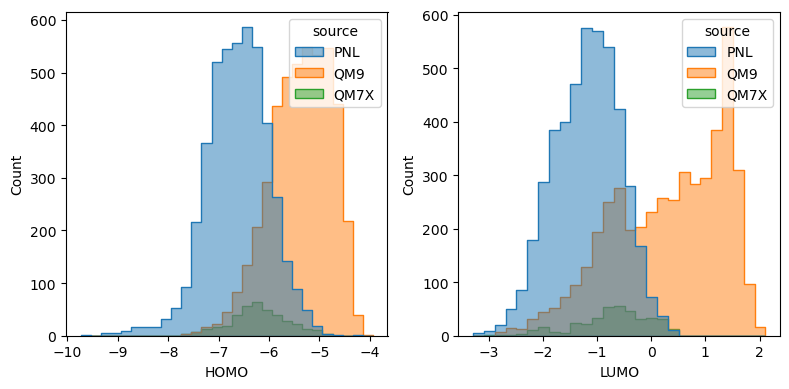

In [13]:
df_pnl = df_diene_pattern[ df_diene_pattern['source'] =='PNL' ].sort_values(by='LUMO',ascending=True)
df_qm9 = df_diene_pattern[ df_diene_pattern['source'] =='QM9' ].sort_values(by='LUMO',ascending=True)
df_qm7 = df_diene_pattern[ df_diene_pattern['source'] =='QM7X' ].sort_values(by='LUMO',ascending=True)
print( 'Num of QM9 data: ', len(df_pnl) )
print( 'Num of PNL data: ', len(df_qm9) )
print( 'Num of QM7X data: ', len(df_qm7) )

fig, axs = plt.subplots(1,2,figsize=(8,4),tight_layout=True,dpi=100)
sns.histplot(df_diene_pattern, x='HOMO', hue='source', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='HOMO',  
sns.histplot(df_diene_pattern, x='LUMO', hue='source', kde=False, binwidth=0.2, ax=axs[1], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO',  

In [19]:
ring_col = [c for c in df_diene_pattern.columns if 'RingCount_' in c]
display(len(df_pnl[ np.all(df_pnl[ring_col]==0,axis=1) ]),
        len(df_qm9[ np.all(df_qm9[ring_col]==0,axis=1) ]),
        len(df_qm7[ np.all(df_qm7[ring_col]==0,axis=1) ])
       )

3761

1

120

In [10]:
#print( [c for c in df_diene_pattern.columns if 'SMILES_pattern_' in c] )
#print( [c for c in df_diene_pattern.columns if 'rdk_' in c] )
#print( [c for c in df_diene_pattern.columns if 'padelpy_' in c] )
#print( [c for c in df_diene_pattern.columns if 'RingCount_' in c] )
print( [c for c in df_diene_pattern.columns if 'rdk_' not in c and 'padelpy_' not in c and 'SMILES_pattern_' not in c and 'RingCount_' not in c] )

['HOMO', 'LUMO', 'SMILES', 'source', 'Inchi']


,PNL,QM9,QM7X
RingCount_3,6,350,9
RingCount_4,10,194,4
RingCount_5,0,3710,234
RingCount_6,788,638,22
RingCount_7,11,277,5
RingCount_8,1,55,0
RingCount_9,1,14,0
RingCount_10,0,0,0
RingCount_11,0,0,0


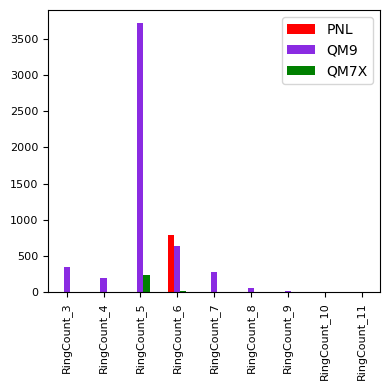

In [12]:
df_ring = df_diene_pattern[[c for c in df_diene_pattern.columns if 'RingCount_' in c]]
df_pnl = np.sum( df_ring[ df_diene_pattern['source'] =='PNL' ]>0, axis=0)
df_qm9 = np.sum( df_ring[ df_diene_pattern['source'] =='QM9' ]>0, axis=0)
df_qm7 = np.sum( df_ring[ df_diene_pattern['source'] =='QM7X' ]>0, axis=0)
df_ring_count = pd.concat( [df_pnl, df_qm9, df_qm7], axis=1)
df_ring_count.columns = ['PNL','QM9','QM7X']

fig, axs = plt.subplots(1,1,figsize=(4,4),tight_layout=True,dpi=100)
#sns.histplot(df_ring, x='Ring_count_6', hue='source', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='HOMO',  
df_ring_count.plot(kind='bar', y=['PNL','QM9','QM7X'], color=['red','blueviolet','g'], ax=axs, legend=False, fontsize=8)  ##figsize=(12,3)
axs.legend()

df_ring_count

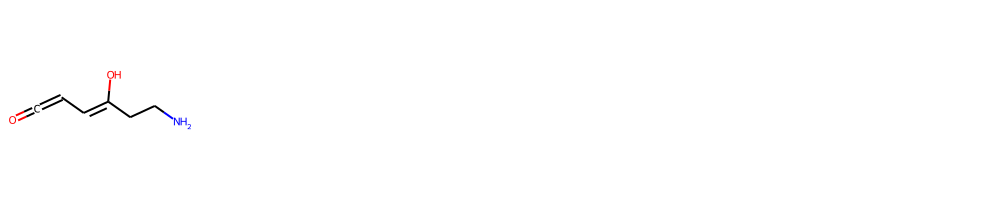

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
14880,-4.52786,-0.087074,NCC/C(=C/C=C=O)/O,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
#df = df_diene[ np.all([df_diene['source'] =='PNL', df_ring['Ring_count_4']>0],axis=0) ]
df = df_diene_pattern[ np.all([df_diene_pattern['source'] =='QM9', np.all(df_ring==0,axis=1)],axis=0) ]
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(s) for s in df['SMILES']], molsPerRow=5 ) ##, legends=[str(p) for p in top['LUMO']] )  
display(img)
df

In [ ]:
## C#N is bothering?
mask = [ not has_substructure(s,sub_struct=['C#N']) for s in df_diene_pattern['SMILES'] ]
df_diene_pattern = df_diene_pattern[mask]
df_diene_pattern

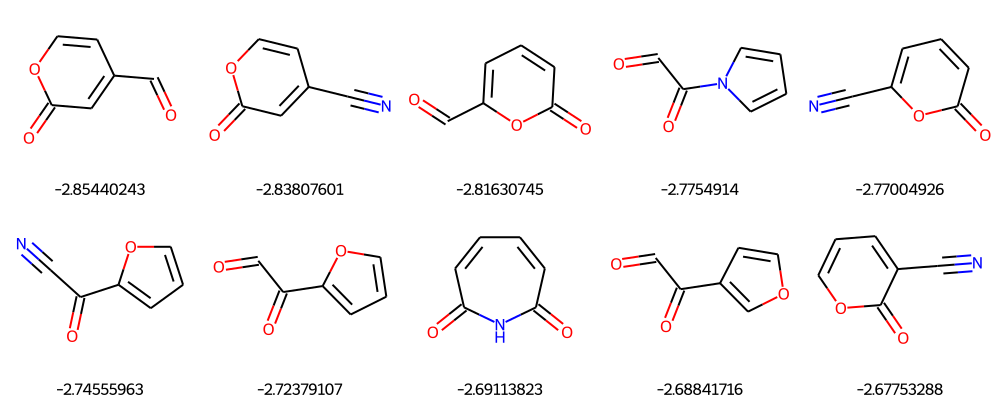

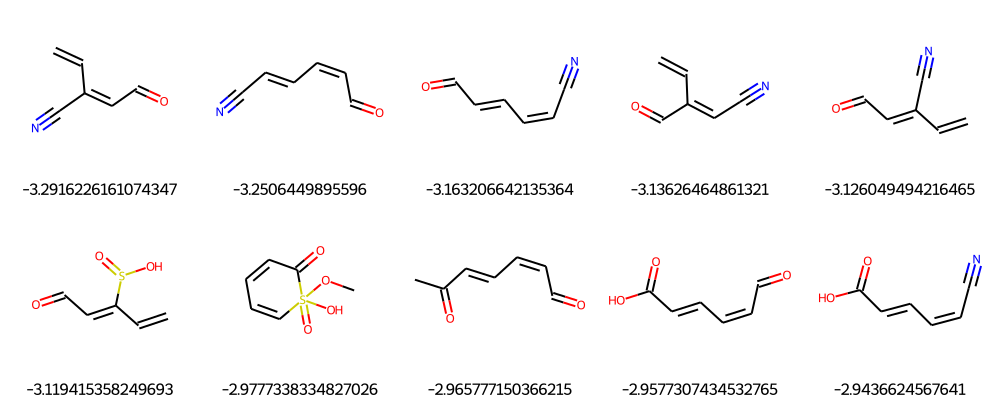

In [21]:

#df = df_diene_pattern[ df_diene_pattern['source']=='PNL' ].sort_values(by='LUMO',ascending=True)
df = df_qm9.head(10)
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in df['SMILES']], molsPerRow=5, legends=[str(p) for p in df['LUMO']] )  
display(img)
df = df_pnl.head(10)
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in df['SMILES']], molsPerRow=5, legends=[str(p) for p in df['LUMO']] )  
display(img)


### 1. PNL C=CC=C

In [10]:
df_pnl = df_diene_pattern[ df_diene_pattern['source'] =='PNL' ].sort_values(by='LUMO',ascending=True)

ring = [ c for c in df_pnl.columns if 'RingCount_' in c ]
## Rings other than 6
ring.remove('RingCount_6')
df_pnl = df_pnl[ np.all(df_pnl[ring]==0,axis=1) ]
# Rings 6
mask1 = df_pnl['RingCount_6']!=0
mask2 = [len([ a for a in Chem.MolFromSmiles(s).GetAtoms() if a.GetSymbol()!='C' and a.IsInRing() ])>0 for s in df_pnl['SMILES']]
mask_delete = np.all([mask1,mask2],axis=0)
### Specific I found
bad_smiles = ['N[C@@H]1C=CC=CC1(O)O','OC1(O)C=CC=CC1','C=C1C=CC=C[C@H]1C']
mask3 = [s in bad_smiles for s in df_pnl['SMILES']]
mask_delete = np.any([mask_delete, mask3],axis=0)

df_pnl = df_pnl[~mask_delete]
#top = top[top['RingCount_6']==1]
display(df_pnl)
#img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in top['SMILES']], molsPerRow=5, legends=[str(p) for p in top['LUMO']] )  
#img

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
257,-7.844547,-3.291623,C=C/C(C#N)=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1375,-7.729353,-3.250645,N#C/C=C/C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4352,-7.672307,-3.163207,N#C/C=C\C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2759,-7.781885,-3.136265,C=C/C(C=O)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1759,-7.776203,-3.126049,C=C/C(C#N)=C/C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2299,-6.947992,0.392159,CO/C=C/C=C/OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1309,-6.630128,0.397719,CO/C=C\C=C\OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2421,-5.003954,0.401164,CN(C)/C=C/C=C/O[Si](C)(C)C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
813,-5.451796,0.404868,C=C(/C=C\C)N(C)C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
## Can we constraint our choice to organic groups with C H O N P S only?
good_elements = ['C','H','O','N','S']
mask_element = []   ## molecules to keep, keep=True
for smi in df_pnl['SMILES']:
    mol = Chem.MolFromSmiles( smi )
    element = set([at.GetSymbol() for at in mol.GetAtoms()])  ## GetSymbol , GetAtomicNum
    mask_element.append(all(e in good_elements for e in element))
df_pnl = df_pnl[mask_element]
#df_final = df_final.reset_index(drop=True)
display( df_pnl )

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
257,-7.844547,-3.291623,C=C/C(C#N)=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1375,-7.729353,-3.250645,N#C/C=C/C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4352,-7.672307,-3.163207,N#C/C=C\C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2759,-7.781885,-3.136265,C=C/C(C=O)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1759,-7.776203,-3.126049,C=C/C(C#N)=C/C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2510,-7.466715,0.379902,C/C=C/C=C/C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2299,-6.947992,0.392159,CO/C=C/C=C/OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1309,-6.630128,0.397719,CO/C=C\C=C\OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
813,-5.451796,0.404868,C=C(/C=C\C)N(C)C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
df_pnl.to_csv('df_final_pnl_cccc.csv')

<AxesSubplot:xlabel='LUMO', ylabel='Count'>

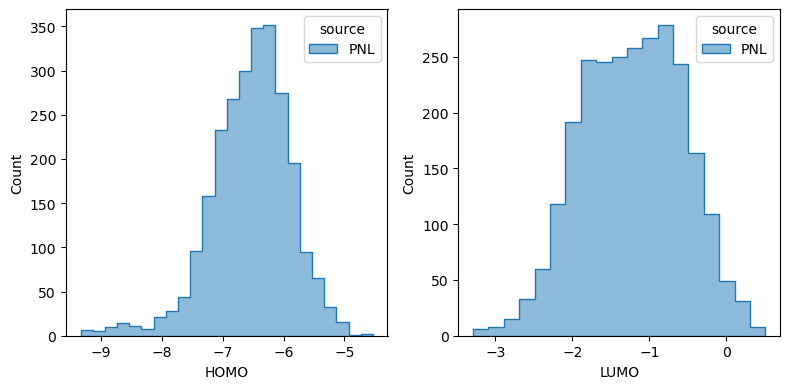

In [14]:
fig, axs = plt.subplots(1,2,figsize=(8,4),tight_layout=True,dpi=100)
sns.histplot(df_pnl, x='HOMO', hue='source', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='HOMO',  
sns.histplot(df_pnl, x='LUMO', hue='source', kde=False, binwidth=0.2, ax=axs[1], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO',  

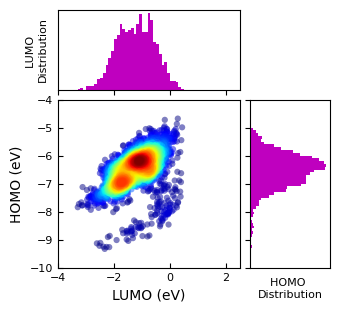

In [12]:
fig, axs = plt.subplots(1,1,figsize=(3.5,3.5),tight_layout=True,)#dpi=200)
x=np.array(df_pnl['LUMO'])
y= np.array(df_pnl['HOMO'])
xy = np.vstack([x, y])
z = stats.gaussian_kde(xy)(xy)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
#z = plt.cm.jet(z)

im = axs.scatter( x,y, c=z, marker='o', cmap='jet',alpha=0.5, edgecolors='none', s=20)
axs.set_aspect(1.)

axs.set_xlabel('LUMO (eV)',fontsize=10) ## input X name
axs.set_ylabel('HOMO (eV)',fontsize=10) ## input Y name
axs.tick_params(direction='in',labelsize=8)
axs.set_xlim([-4,2.5])
axs.set_ylim([-10,-4])

divider = make_axes_locatable(axs)
extra_length = 0.8
axHistx = divider.append_axes("top", extra_length, pad=0.1, sharex=axs)
axHisty = divider.append_axes("right", extra_length, pad=0.1, sharey=axs)
axHistx.xaxis.set_tick_params(labelbottom=False)
axHisty.yaxis.set_tick_params(labelleft=False)

## Hist info
binwidth = 0.1
xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
lim = (int(xymax/binwidth) + 1)*binwidth
bins = np.arange(-lim, lim + binwidth, binwidth)
axHistx.hist(x, bins=bins, color='m')
axHisty.hist(y, bins=bins, orientation='horizontal',color='m')

axHistx.set_ylabel('LUMO \nDistribution',fontsize=8)
axHisty.set_xlabel('HOMO \nDistribution',fontsize=8) 
#axHistx.set_ylim([0,620])
#axHisty.set_xlim([0,620])
axHistx.set_yticks([])
axHisty.set_xticks([])

plt.savefig("Figure_2_PNL_LUMOHOMO.png", dpi=800)     

plt.show()


In [13]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'RingCount_' in c ]    
X_features = df_pnl[feature_col]
X_features

,LUMO,rdk_MaxEStateIndex,rdk_MinEStateIndex,rdk_MaxAbsEStateIndex,rdk_MinAbsEStateIndex,rdk_qed,rdk_MolWt,rdk_HeavyAtomMolWt,rdk_ExactMolWt,rdk_NumValenceElectrons,...,rdk_MolMR,RingCount_3,RingCount_4,RingCount_5,RingCount_6,RingCount_7,RingCount_8,RingCount_9,RingCount_10,RingCount_11
257,-3.291623,9.657778,0.291667,9.657778,0.291667,0.226697,107.112,102.072,107.037114,40,...,29.9570,0,0,0,0,0,0,0,0,0
1375,-3.250645,9.564406,0.654478,9.564406,0.654478,0.226697,107.112,102.072,107.037114,40,...,29.9570,0,0,0,0,0,0,0,0,0
4352,-3.163207,9.564406,0.654478,9.564406,0.654478,0.226697,107.112,102.072,107.037114,40,...,29.9570,0,0,0,0,0,0,0,0,0
2759,-3.136265,9.835370,0.312500,9.835370,0.312500,0.226697,107.112,102.072,107.037114,40,...,29.9570,0,0,0,0,0,0,0,0,0
1759,-3.126049,9.657778,0.291667,9.657778,0.291667,0.226697,107.112,102.072,107.037114,40,...,29.9570,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2510,0.379902,2.000000,2.000000,2.000000,2.000000,0.424989,82.146,72.066,82.078250,34,...,29.6280,0,0,0,0,0,0,0,0,0
2299,0.392159,4.601029,1.565000,4.601029,1.565000,0.406504,114.144,104.064,114.068080,46,...,32.2980,0,0,0,0,0,0,0,0,0
1309,0.397719,4.601029,1.565000,4.601029,1.565000,0.406504,114.144,104.064,114.068080,46,...,32.2980,0,0,0,0,0,0,0,0,0
813,0.404868,3.783056,1.034722,3.783056,1.034722,0.489512,111.188,98.084,111.104799,46,...,37.6410,0,0,0,0,0,0,0,0,0


In [14]:
X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
X_features_prop_clean

Before clean (2583, 132)
After clean (2583, 110)
Num of keep:  63
Num of drop:  47
---------


,LUMO,rdk_MaxEStateIndex,rdk_MinAbsEStateIndex,rdk_qed,rdk_MaxPartialCharge,rdk_MaxAbsPartialCharge,rdk_FpDensityMorgan2,rdk_FpDensityMorgan3,rdk_BCUT2D_MWHI,rdk_BCUT2D_MWLOW,...,rdk_VSA_EState4,rdk_VSA_EState5,rdk_VSA_EState7,rdk_VSA_EState8,rdk_FractionCSP3,rdk_HeavyAtomCount,rdk_NHOHCount,rdk_NumHAcceptors,rdk_NumRotatableBonds,rdk_MolLogP
257,-3.291623,9.657778,0.291667,0.226697,0.143654,0.298515,2.375000,2.500000,16.128458,10.274125,...,0.291667,0.0,3.043287,3.300787,0.000000,8,0,2,2,0.82128
1375,-3.250645,9.564406,0.654478,0.226697,0.142336,0.298564,2.000000,2.500000,16.128431,10.447238,...,0.000000,0.0,6.250173,0.000000,0.000000,8,0,2,2,0.82128
4352,-3.163207,9.564406,0.654478,0.226697,0.142336,0.298564,2.000000,2.500000,16.128431,10.447238,...,0.000000,0.0,6.250173,0.000000,0.000000,8,0,2,2,0.82128
2759,-3.136265,9.835370,0.312500,0.226697,0.150246,0.297871,2.375000,2.500000,16.129017,10.274303,...,0.312500,0.0,3.048056,3.299815,0.000000,8,0,2,2,0.82128
1759,-3.126049,9.657778,0.291667,0.226697,0.143654,0.298515,2.375000,2.500000,16.128458,10.274125,...,0.291667,0.0,3.043287,3.300787,0.000000,8,0,2,2,0.82128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2510,0.379902,2.000000,2.000000,0.424989,-0.046678,0.087672,1.166667,1.333333,13.565192,10.460409,...,0.000000,0.0,8.000000,4.000000,0.333333,6,0,0,1,2.13860
2299,0.392159,4.601029,1.565000,0.406504,0.082522,0.504366,1.250000,1.500000,16.458733,10.596019,...,0.000000,0.0,6.609167,0.000000,0.333333,8,0,2,3,1.30660
1309,0.397719,4.601029,1.565000,0.406504,0.082522,0.504366,1.250000,1.500000,16.458733,10.596019,...,0.000000,0.0,6.609167,0.000000,0.333333,8,0,2,3,1.30660
813,0.404868,3.783056,1.034722,0.489512,0.028413,0.378149,2.000000,2.125000,15.059292,10.391831,...,1.034722,0.0,3.946759,5.763889,0.428571,8,0,1,2,1.63780


,LUMO


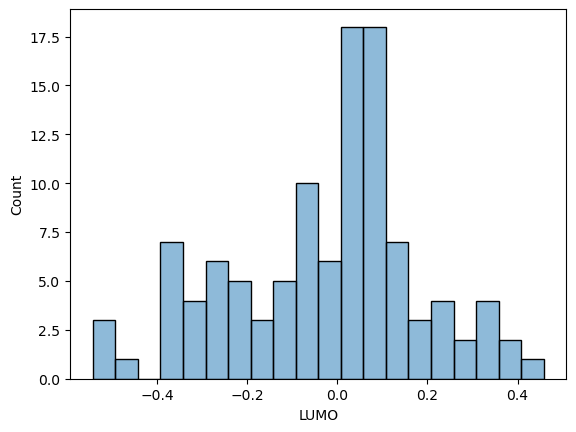

In [15]:
#highlight.plot(kind='barh', stacked=True, y='LUMO')
sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO', element="step", 
mask = highlight.drop('LUMO',axis=0).abs()>0.6
highlight.drop('LUMO')[ mask.values ]

In [16]:
Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)
display(X_prop,Y_prop)

,rdk_MaxEStateIndex,rdk_MinAbsEStateIndex,rdk_qed,rdk_MaxPartialCharge,rdk_MaxAbsPartialCharge,rdk_FpDensityMorgan2,rdk_FpDensityMorgan3,rdk_BCUT2D_MWHI,rdk_BCUT2D_MWLOW,rdk_BCUT2D_CHGHI,...,rdk_VSA_EState4,rdk_VSA_EState5,rdk_VSA_EState7,rdk_VSA_EState8,rdk_FractionCSP3,rdk_HeavyAtomCount,rdk_NHOHCount,rdk_NumHAcceptors,rdk_NumRotatableBonds,rdk_MolLogP
257,9.657778,0.291667,0.226697,0.143654,0.298515,2.375000,2.500000,16.128458,10.274125,1.799742,...,0.291667,0.0,3.043287,3.300787,0.000000,8,0,2,2,0.82128
1375,9.564406,0.654478,0.226697,0.142336,0.298564,2.000000,2.500000,16.128431,10.447238,1.589482,...,0.000000,0.0,6.250173,0.000000,0.000000,8,0,2,2,0.82128
4352,9.564406,0.654478,0.226697,0.142336,0.298564,2.000000,2.500000,16.128431,10.447238,1.589482,...,0.000000,0.0,6.250173,0.000000,0.000000,8,0,2,2,0.82128
2759,9.835370,0.312500,0.226697,0.150246,0.297871,2.375000,2.500000,16.129017,10.274303,1.804698,...,0.312500,0.0,3.048056,3.299815,0.000000,8,0,2,2,0.82128
1759,9.657778,0.291667,0.226697,0.143654,0.298515,2.375000,2.500000,16.128458,10.274125,1.799742,...,0.291667,0.0,3.043287,3.300787,0.000000,8,0,2,2,0.82128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2510,2.000000,2.000000,0.424989,-0.046678,0.087672,1.166667,1.333333,13.565192,10.460409,1.483335,...,0.000000,0.0,8.000000,4.000000,0.333333,6,0,0,1,2.13860
2299,4.601029,1.565000,0.406504,0.082522,0.504366,1.250000,1.500000,16.458733,10.596019,1.595611,...,0.000000,0.0,6.609167,0.000000,0.333333,8,0,2,3,1.30660
1309,4.601029,1.565000,0.406504,0.082522,0.504366,1.250000,1.500000,16.458733,10.596019,1.595611,...,0.000000,0.0,6.609167,0.000000,0.333333,8,0,2,3,1.30660
813,3.783056,1.034722,0.489512,0.028413,0.378149,2.000000,2.125000,15.059292,10.391831,1.840714,...,1.034722,0.0,3.946759,5.763889,0.428571,8,0,1,2,1.63780


257    -3.291623
1375   -3.250645
4352   -3.163207
2759   -3.136265
1759   -3.126049
          ...   
2510    0.379902
2299    0.392159
1309    0.397719
813     0.404868
2216    0.434078
Name: LUMO, Length: 2583, dtype: float64

Total Var  0.8121136445362452  from  12
Exp Var:  [0.20682875 0.12196931 0.08241677 0.07893231 0.06114618 0.05865078
 0.04664966 0.04579704 0.03339514 0.02798252 0.02570478 0.02264041]


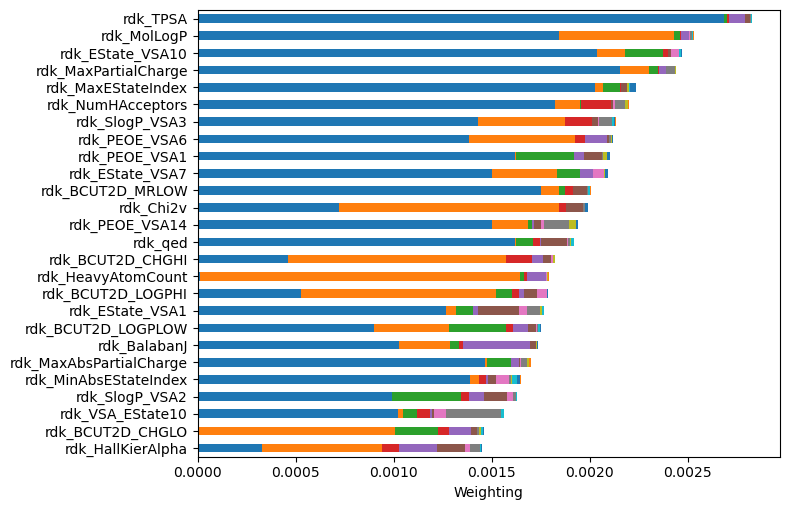

In [17]:
#X_features_prop_clean_scaled, scaler = get_std(X_features_prop_clean)
#display( X_features_prop_clean_scaled, Y_prop)
n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)
#display(df2_pca, df2_pca_coef)

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,length
rdk_TPSA,-0.250415,-0.013999,-0.043804,0.040500,-0.148784,0.088873,-0.008382,0.042743,0.013192,0.056471,-0.040022,0.057808,0.002828
rdk_MolLogP,0.207421,0.199226,-0.063471,-0.031951,-0.104915,0.016405,-0.051780,-0.051902,-0.011982,-0.093666,-0.006831,-0.114184,0.002532
rdk_EState_VSA10,-0.218173,0.098798,-0.166930,-0.065379,0.028715,-0.057797,0.139034,0.014688,0.009346,0.125858,0.027269,0.033865,0.002468
rdk_MaxPartialCharge,-0.224273,0.100347,-0.081681,-0.031088,-0.094636,0.031371,-0.013743,-0.148613,0.059942,-0.001239,0.037665,0.006061,0.002441
rdk_MaxEStateIndex,-0.217674,0.051511,-0.111603,-0.033454,-0.019592,-0.091376,-0.029932,0.007232,-0.080399,0.090917,-0.215357,0.018248,0.002235
rdk_NumHAcceptors,-0.206478,0.092470,-0.022705,-0.155642,0.024035,0.050566,-0.073727,-0.156692,0.109660,-0.019710,-0.013954,0.107368,0.002199
rdk_SlogP_VSA3,-0.182777,0.172746,0.011660,-0.147353,-0.005326,-0.098023,0.040201,0.179339,-0.027468,-0.101943,0.107309,0.035913,0.002131
rdk_PEOE_VSA6,0.179876,0.190712,-0.000467,0.089372,-0.172155,-0.061347,-0.001561,0.055799,-0.079706,0.059317,0.045708,0.072192,0.002119
rdk_PEOE_VSA1,-0.194598,0.017767,0.207268,0.006565,-0.120107,0.161455,-0.020981,-0.038726,0.148594,-0.008322,0.139084,-0.035495,0.002103
rdk_EState_VSA7,0.187215,0.149574,0.132228,-0.010886,-0.132458,-0.004175,0.155789,-0.026507,0.062958,-0.030517,-0.150932,-0.011131,0.002092


0 rdk_TPSA
1 rdk_MolLogP
2 rdk_EState_VSA10
3 rdk_MaxPartialCharge
4 rdk_MaxEStateIndex
5 rdk_NumHAcceptors
6 rdk_SlogP_VSA3
7 rdk_PEOE_VSA6
8 rdk_PEOE_VSA1
9 rdk_EState_VSA7


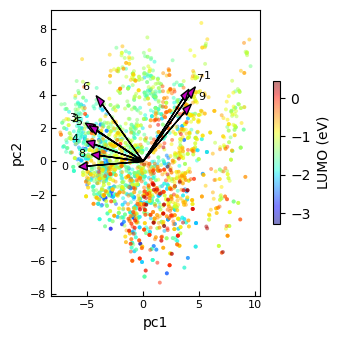

In [18]:
colors = Y_prop
#colors = [1 if s=='PNL' else 0 for s in Y_prop['source']]
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            feature_arrow=True, size=8, explained_var=exp_var, num_feature=10,
           save_to_file='Figure_PCA_PNL_rdk.png' )# yrange=[-5,10] )

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12']


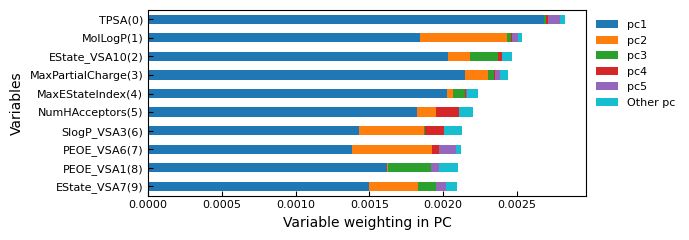

In [19]:
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='rdk_', save_to_file='Figure_PCA_PNL_rdk_TopFeatures.png')


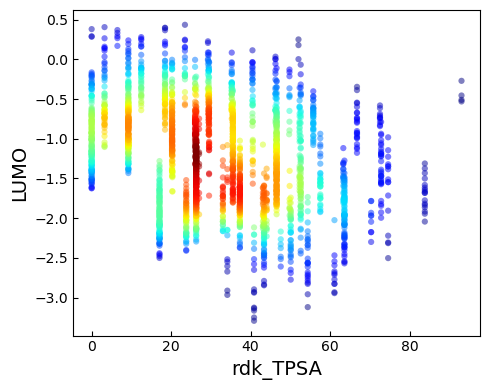

In [23]:
fig, axs = plt.subplots(1,1, figsize=(5,4),tight_layout=True)
xlabel = 'rdk_TPSA'
y=np.array(df_pnl['LUMO'])
x= np.array(df_pnl[xlabel])
xy = np.vstack([x, y])
z = stats.gaussian_kde(xy)(xy)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
#z = plt.cm.jet(z)    
im = axs.scatter( x,y, c=z, marker='o', cmap='jet',alpha=0.5, edgecolors='none', s=20)
axs.set_ylabel('LUMO',fontsize=14) ## input X name
axs.set_xlabel(xlabel,fontsize=14) ## input Y name
axs.tick_params(direction='in',labelsize='10')
im

Before clean (2583, 891)
After clean (2583, 166)
Num of keep:  86
Num of drop:  80
---------


,LUMO
padelpy_PubchemFP553,-0.618544


Total Var  0.8039346739542912  from  31
Exp Var:  [0.09095959 0.06428463 0.04963975 0.04668161 0.04019933 0.03772179
 0.03529023 0.03052037 0.02929531 0.02780227 0.0262668  0.02600461
 0.02419344 0.02260139 0.02214644 0.02017995 0.01901528 0.01780465
 0.01748302 0.01640325 0.01542648 0.01472468 0.01430534 0.01376517
 0.01284443 0.01234073 0.01205602 0.01189629 0.0116563  0.01041584
 0.01000965]


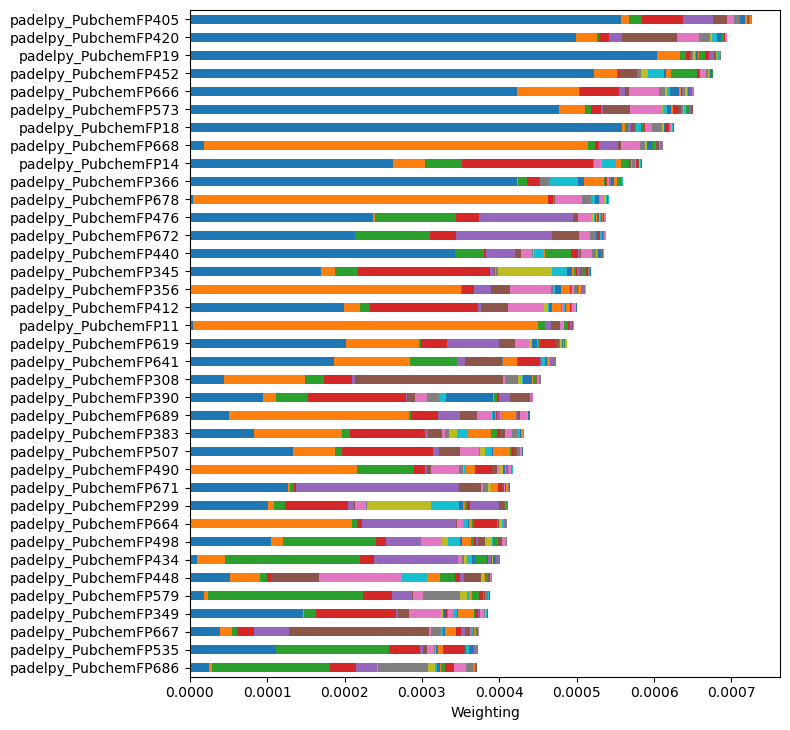

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc23,pc24,pc25,pc26,pc27,pc28,pc29,pc30,pc31,length
padelpy_PubchemFP405,-0.259563,0.049143,-0.084037,-0.154814,0.155935,-0.111765,-0.085742,-0.091722,0.028023,-0.006377,...,0.032207,-0.022954,0.010507,-0.015682,0.034276,-0.002591,0.024200,0.074292,-0.017385,0.000727
padelpy_PubchemFP420,-0.245510,-0.080986,0.032473,0.078748,-0.100366,-0.224191,0.151307,0.120791,0.059668,-0.094645,...,0.000786,-0.033821,0.000202,-0.012745,-0.040816,0.054121,0.020990,-0.002046,-0.044523,0.000694
padelpy_PubchemFP19,-0.270016,-0.085322,-0.056679,0.049670,-0.011598,-0.017737,-0.009504,0.051757,0.064881,-0.033443,...,-0.037076,0.018960,0.015370,-0.005165,-0.023179,0.041429,0.026790,0.004023,0.021831,0.000686
padelpy_PubchemFP452,-0.251401,-0.083975,-0.028136,0.018316,0.009667,-0.126926,0.014112,0.075136,0.103725,-0.160328,...,-0.044987,-0.009699,-0.054480,-0.030650,0.005981,0.021983,0.001691,-0.004619,-0.031632,0.000676
padelpy_PubchemFP666,-0.225985,0.139186,0.029640,-0.150985,0.072302,-0.060051,-0.176095,-0.092379,-0.043452,-0.073743,...,-0.071801,-0.032222,0.068206,-0.098337,0.108661,-0.034454,0.012412,0.062581,0.049578,0.000651
padelpy_PubchemFP573,-0.240284,0.089278,0.055903,-0.078606,-0.039010,0.156355,-0.182649,-0.012520,-0.025872,-0.088234,...,-0.153576,-0.063798,0.101695,-0.105179,0.068580,-0.021991,-0.001397,0.019737,0.022570,0.000651
padelpy_PubchemFP18,-0.259880,-0.030494,-0.042054,0.002467,-0.040795,0.064440,-0.014071,0.017995,0.024386,0.095068,...,0.052508,-0.158107,0.075992,-0.009020,-0.075846,0.068082,0.094477,0.084981,-0.148707,0.000626
padelpy_PubchemFP668,0.046305,0.346706,-0.059777,0.052405,0.123495,0.045192,0.141048,0.086242,0.045352,-0.038845,...,0.027083,-0.000477,-0.115897,-0.014185,-0.022214,0.077538,0.039526,0.065668,0.037942,0.000612
padelpy_PubchemFP14,0.177940,-0.100955,0.139623,-0.278956,-0.011436,-0.011721,0.088663,-0.003310,-0.037341,-0.152365,...,0.016004,-0.134770,0.001981,0.063127,-0.006153,-0.058767,0.060006,0.134444,-0.102947,0.000585
padelpy_PubchemFP366,-0.225995,0.016570,-0.068378,-0.084858,0.024227,0.022601,0.011793,-0.111141,0.014513,0.220096,...,0.151034,-0.033747,-0.002956,0.023851,-0.018127,0.064582,0.047293,0.104751,-0.058088,0.000560


0 padelpy_PubchemFP405
1 padelpy_PubchemFP420
2 padelpy_PubchemFP19
3 padelpy_PubchemFP452
4 padelpy_PubchemFP666
5 padelpy_PubchemFP573
6 padelpy_PubchemFP18
7 padelpy_PubchemFP668
8 padelpy_PubchemFP14
9 padelpy_PubchemFP366


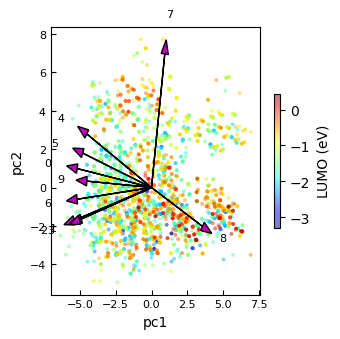

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26', 'pc27', 'pc28', 'pc29', 'pc30', 'pc31']


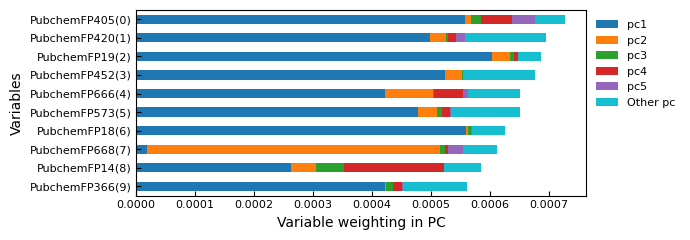

In [20]:
### Explore pubchem FP
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'padelpy_PubchemFP' in c or 'RingCount_' in c ]    
X_features = df_pnl[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=8, explained_var=exp_var, num_feature=10,
            #feature_arrow=True, xrange=[-10,8], yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_PNL_pubchem.png')

feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_PNL_pubchem_TopFeatures.png')

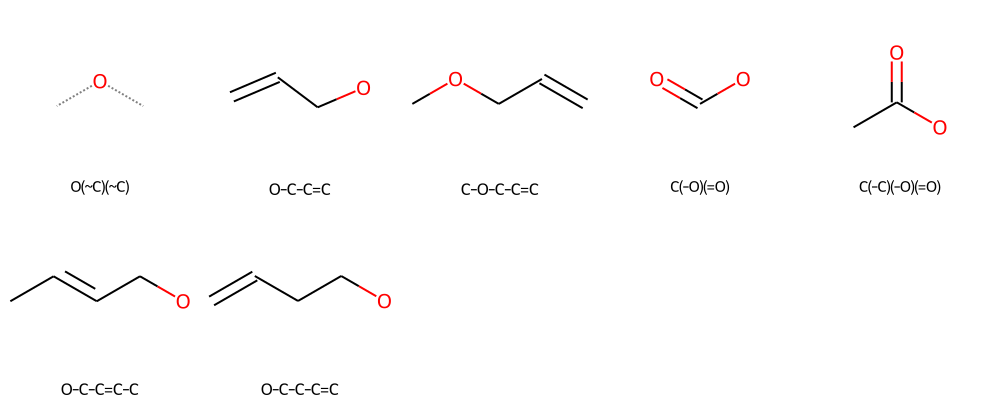

Before clean (2583, 1391)
After clean (2583, 961)
Num of keep:  264
Num of drop:  697
---------


,LUMO
padelpy_GATS1e,0.611551


Total Var  0.8021864613312457  from  26
Exp Var:  [0.13355187 0.12362745 0.06735802 0.06361815 0.04721818 0.03982715
 0.03289918 0.02919526 0.02561373 0.02426995 0.02267837 0.01977537
 0.01843747 0.01775357 0.0163927  0.01483103 0.01355    0.01241824
 0.01141534 0.01124458 0.01049116 0.01004456 0.00949425 0.00915123
 0.0090073  0.00832234]


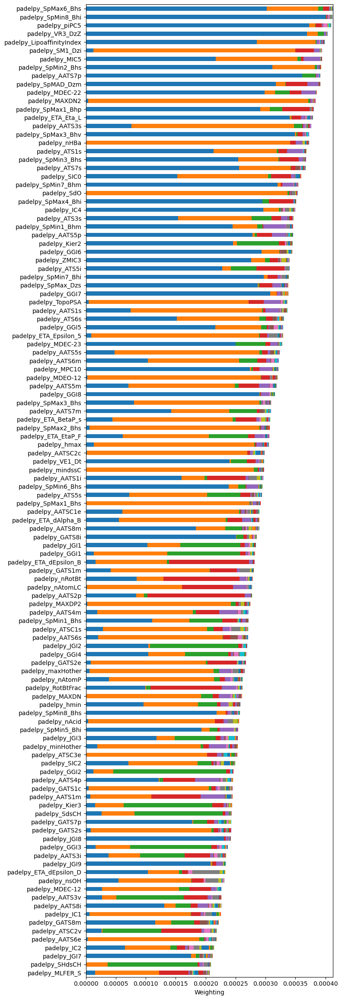

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc18,pc19,pc20,pc21,pc22,pc23,pc24,pc25,pc26,length
padelpy_SpMax6_Bhs,0.130129,0.075061,0.041502,-0.050599,-0.005888,-0.007065,-0.006330,-0.061913,0.040663,-0.003470,...,0.008642,-0.020281,0.042858,-0.008373,0.027376,0.023961,-0.037679,0.017009,-0.001808,0.000413
padelpy_SpMin8_Bhi,-0.149843,0.001765,-0.007719,0.021914,0.022323,0.016563,0.045563,0.062206,-0.030061,0.020408,...,-0.019169,-0.015865,-0.016899,0.010584,0.010021,0.014602,-0.026318,0.023988,-0.014368,0.000412
padelpy_piPC5,0.144556,0.026247,-0.008306,0.050410,-0.024916,-0.014385,0.084414,-0.031990,-0.034896,-0.069943,...,-0.027295,0.007539,0.008755,0.016731,0.013541,0.001887,-0.025880,-0.018659,0.001209,0.000410
padelpy_VR3_DzZ,0.143880,0.034122,0.047104,-0.004969,-0.041202,0.007671,-0.014621,-0.005239,0.016721,-0.019799,...,-0.039545,0.013966,0.049968,-0.012487,0.012436,0.021351,0.067039,0.070168,-0.001624,0.000404
padelpy_LipoaffinityIndex,0.126484,-0.080305,0.017740,-0.003132,-0.041460,0.006326,0.041966,-0.014561,0.010849,-0.045638,...,0.011429,-0.029112,0.020487,0.048253,0.020658,-0.012272,0.000342,-0.030207,-0.029976,0.000399
padelpy_SM1_Dzi,-0.026156,0.148555,-0.000827,-0.088092,-0.063952,-0.000220,0.013189,-0.022287,0.040955,0.020318,...,0.037033,0.025796,-0.004368,-0.019579,0.001843,-0.009671,0.001666,0.008602,0.007395,0.000394
padelpy_MIC5,0.110267,0.094372,-0.037693,0.030539,0.113031,0.006395,0.002550,-0.009544,-0.012587,0.001266,...,-0.035848,-0.012385,-0.019571,0.006121,-0.016679,-0.004665,-0.019714,0.019549,-0.022410,0.000394
padelpy_SpMin2_Bhs,0.132115,-0.068232,0.025881,-0.010538,0.037136,-0.018592,0.004326,-0.021763,0.004056,-0.006857,...,0.026703,-0.018837,0.030919,-0.013379,-0.019699,-0.020001,0.004811,-0.013340,-0.029038,0.000393
padelpy_AATS7p,0.142251,0.006333,-0.070262,-0.004931,0.044944,0.000458,0.027629,0.007108,-0.011332,0.035899,...,-0.034541,-0.023804,-0.051187,-0.000377,0.004313,-0.023154,-0.026183,-0.019444,-0.006409,0.000392
padelpy_SpMAD_Dzm,0.133312,0.032580,-0.012983,-0.094384,-0.089872,0.000146,-0.008796,-0.024534,0.005169,0.016231,...,-0.025590,0.012355,-0.032925,-0.030774,0.021433,-0.033250,0.003765,0.034683,-0.038464,0.000391


0 padelpy_SpMax6_Bhs
1 padelpy_SpMin8_Bhi
2 padelpy_piPC5
3 padelpy_VR3_DzZ
4 padelpy_LipoaffinityIndex
5 padelpy_SM1_Dzi
6 padelpy_MIC5
7 padelpy_SpMin2_Bhs
8 padelpy_AATS7p
9 padelpy_SpMAD_Dzm


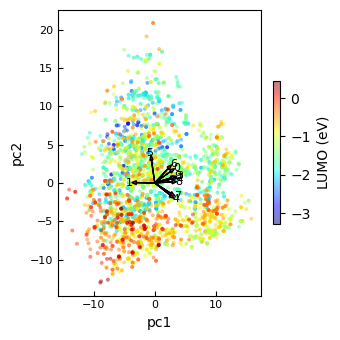

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26']


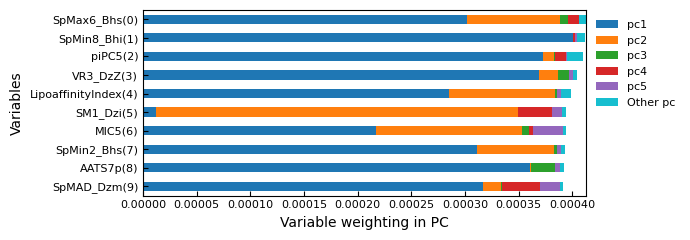

In [21]:
### Explore padelpy descriptor
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'padelpy_PubchemFP' not in c and ('padelpy_' in c or 'RingCount_' in c) ]    
X_features = df_pnl[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=8, explained_var=exp_var, num_feature=10,
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_PNL_padelpy.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_PNL_padelpy_TopFeatures.png')

Before clean (2583, 2394)
After clean (2583, 1233)
Num of keep:  373
Num of drop:  860
---------


,LUMO
padelpy_GATS1e,0.611551
padelpy_PubchemFP553,-0.618544


Total Var  0.8046855263853201  from  39
Exp Var:  [0.11567979 0.10260615 0.06029324 0.05737939 0.0451471  0.03257218
 0.03111133 0.02856954 0.02415041 0.02260389 0.0207103  0.01884415
 0.01711395 0.01573297 0.01497252 0.01450241 0.01311097 0.01245399
 0.01140774 0.01069999 0.01004564 0.00980475 0.00924879 0.00862512
 0.00831774 0.00794607 0.00745993 0.00732498 0.0070379  0.00679869
 0.00666381 0.00631906 0.00616254 0.00602598 0.00579053 0.00566216
 0.00552585 0.00519876 0.00506523]


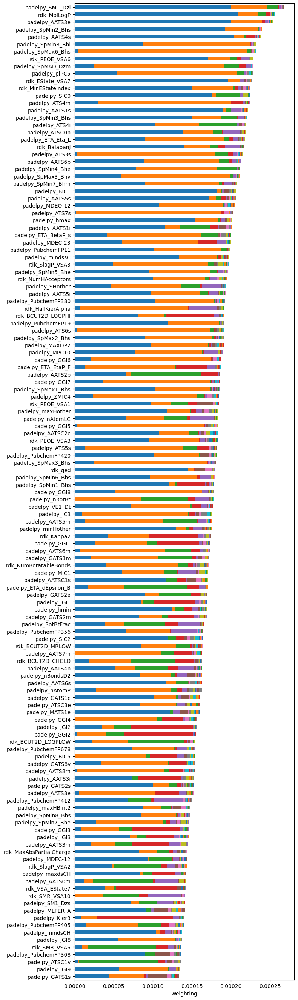

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc31,pc32,pc33,pc34,pc35,pc36,pc37,pc38,pc39,length
padelpy_SM1_Dzi,-0.122368,0.066034,0.060571,-0.025853,0.028135,0.023806,0.030431,0.033289,0.025293,0.021149,...,0.008650,-0.005911,0.003655,-0.007575,0.013091,0.030248,-0.013533,0.010353,-0.013633,0.000268
rdk_MolLogP,0.124978,0.048785,-0.055782,0.039782,-0.003090,0.003237,-0.032612,0.003218,-0.021129,0.040101,...,-0.002765,0.032216,-0.027792,0.001953,-0.011372,0.020485,0.027600,-0.008378,0.026140,0.000256
padelpy_AATS3e,-0.122262,0.061472,0.003529,0.031801,-0.043448,-0.028509,-0.014232,0.010373,0.021294,0.016755,...,0.014149,0.004514,0.015148,0.017159,-0.006429,0.017628,-0.019694,0.026495,0.005735,0.000253
padelpy_SpMin2_Bhs,0.120043,0.063001,0.016729,0.009250,-0.025795,-0.005147,0.030297,-0.007413,-0.027264,-0.008677,...,0.025357,0.026833,-0.016552,-0.002141,-0.005390,0.011560,0.016391,-0.009926,-0.019451,0.000240
padelpy_AATS4s,-0.123621,0.033351,-0.026655,0.061300,0.024624,-0.022441,-0.038799,-0.029708,0.018409,0.023422,...,-0.025225,0.010660,0.025110,-0.000910,0.023182,-0.014328,-0.010970,0.027567,0.027517,0.000239
padelpy_SpMin8_Bhi,-0.081004,-0.113708,-0.017419,0.015166,-0.016609,-0.027358,-0.041277,0.038615,0.027568,-0.030823,...,-0.015437,0.016093,0.016666,-0.010262,0.020661,-0.013823,-0.003310,-0.004538,0.019394,0.000232
padelpy_SpMax6_Bhs,0.018385,0.143170,0.037889,0.010167,-0.006950,0.034981,0.052321,0.004407,-0.035746,0.020208,...,0.012089,0.001865,0.013033,0.000741,0.025032,0.018562,0.005109,0.019553,-0.015037,0.000232
rdk_PEOE_VSA6,0.112957,0.052302,-0.045439,0.039999,0.070592,0.019454,0.015283,-0.038439,-0.067578,0.009280,...,-0.058195,0.045841,0.015545,-0.020928,0.017807,-0.014294,0.014231,-0.028142,0.008027,0.000229
padelpy_SpMAD_Dzm,0.042910,0.125592,0.072517,-0.052274,0.058551,-0.001965,0.010509,-0.012308,-0.012320,0.016171,...,0.003185,0.043405,0.019266,-0.014635,0.023244,0.042961,-0.021241,-0.016180,0.005196,0.000228
padelpy_piPC5,0.063417,0.120923,-0.048930,-0.012202,0.029146,-0.013919,0.050245,0.044370,-0.036536,-0.063348,...,-0.009834,0.012754,-0.013960,0.021269,-0.001349,-0.009139,-0.024461,0.014877,-0.006467,0.000228


0 padelpy_SM1_Dzi
1 rdk_MolLogP
2 padelpy_AATS3e
3 padelpy_SpMin2_Bhs
4 padelpy_AATS4s
5 padelpy_SpMin8_Bhi
6 padelpy_SpMax6_Bhs
7 rdk_PEOE_VSA6
8 padelpy_SpMAD_Dzm
9 padelpy_piPC5


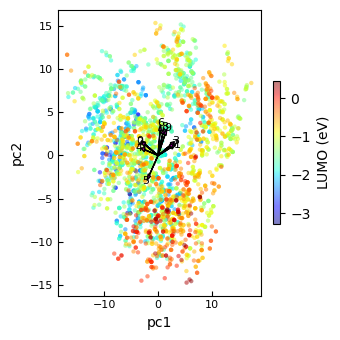

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26', 'pc27', 'pc28', 'pc29', 'pc30', 'pc31', 'pc32', 'pc33', 'pc34', 'pc35', 'pc36', 'pc37', 'pc38', 'pc39']


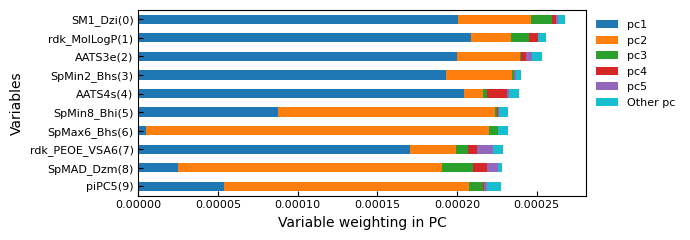

In [22]:
### Explore ALLLL
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c ]    
X_features = df_pnl[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=10, explained_var=exp_var,
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_PNL_everything.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_PNL_everything_TopFeatures.png')

### 2. QM9 C=CC=C

In [23]:
df_qm9 = df_diene_pattern[ df_diene_pattern['source'] =='QM9' ].sort_values(by='LUMO',ascending=True)

## Keep rings >=5
ring = [ c for c in df_qm9.columns if 'RingCount_' in c ]

mask1 = np.all( [df_qm9['RingCount_3']==0, df_qm9['RingCount_4']==0], axis=0 )
mask2 = np.any( [df_qm9[r]==1 for r in ring ], axis=0 )
mask_keep = np.all( [mask1,mask2],axis=0 )
df_qm9 = df_qm9[mask_keep]

## Keep common atoms
good_elements = ['C','H','O','N','S']
mask_element = []   ## molecules to keep, keep=True
for smi in df_qm9['SMILES']:
    mol = Chem.MolFromSmiles( smi )
    element = set([at.GetSymbol() for at in mol.GetAtoms()])  ## GetSymbol , GetAtomicNum
    mask_element.append(all(e in good_elements for e in element))
df_qm9 = df_qm9[mask_element]

## Add ring info
NumRingAtom = np.zeros(len(df_qm9))
for r in ring:
    ring_num = int(r.split('_')[-1])
    idx = np.argwhere(df_qm9[r]==1).flatten()
    if len(idx)>0:
        NumRingAtom[ idx ] = ring_num
df_qm9['NumRingAtom'] = NumRingAtom

display( df_qm9 )

df_qm9.to_csv('df_final_qm9_cccc.csv')

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,NumRingAtom
9077,-6.930565,-2.854402,O=Cc1cc(=O)occ1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
8920,-7.189067,-2.838076,O=c1occc(c1)C#N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
9117,-7.009476,-2.816307,O=Cc1cccc(=O)o1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
9048,-6.329209,-2.775491,O=CC(=O)n1cccc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
8804,-7.167298,-2.770049,O=c1oc(ccc1)C#N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5546,-4.443507,1.991823,COc1ccc(O)[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
14784,-4.372759,1.997265,CCOc1cc(N)c[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
13875,-4.361875,2.013592,CNc1c[nH]c(OC)c1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
14486,-4.663914,2.013592,COc1c[nH]c(O)c1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0


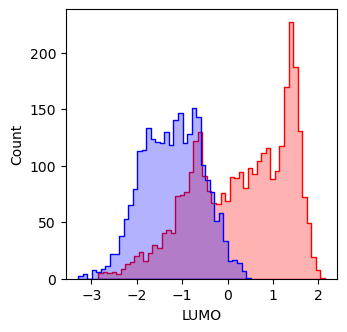

In [24]:
fig, axs = plt.subplots( 1 ,1, figsize=(3.5,3.5))#tight_layout=True,dpi=100)

df = pd.read_csv('df_final_qm9_cccc.csv', index_col=0)
sns.histplot( df, x='LUMO', kde=False, binwidth=0.1, ax=axs, element="step", alpha=0.3, fill=True, color='r', label='Style')#  )#, stat='percent', 
df = pd.read_csv('df_final_pnl_cccc.csv', index_col=0)
sns.histplot( df, x='LUMO', kde=False, binwidth=0.1, ax=axs, element="step", alpha=0.3, fill=True, color='b', label='Style')#  )#, stat='percent', 
plt.show()

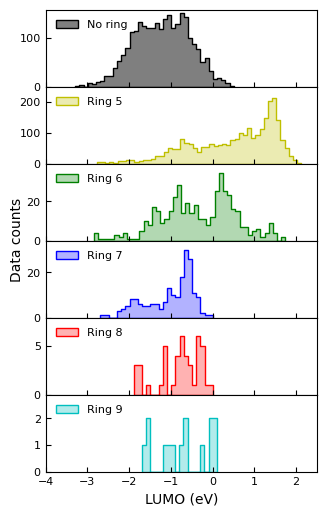

In [25]:
df_pnl = pd.read_csv('df_final_pnl_cccc.csv', index_col=0)

colors = ['k','y','g','b','r','c']
x_range = [ n for n in range(5,10)]

fig, axs = plt.subplots( len(colors) ,1, figsize=(3.5,1*len(colors)), )#tight_layout=True,dpi=100)
sns.histplot( df_pnl, x='LUMO', kde=False, binwidth=0.1, ax=axs[0], element="step", alpha=0.5, fill=True, color='k', label='No ring',)# stat='percent')
axs[0].set_xlabel('')
axs[0].set_xticklabels([])
axs[0].set_ylabel('')  
axs[0].tick_params(direction='in',labelsize=8)
axs[0].legend(fontsize=8, frameon=False, loc=2)
axs[0].set_xlim((-4,2.5))
    
ymax = [249, 39, 34, 7.9, 2.9]
for i,n in enumerate(x_range):
    df = df_qm9[ df_qm9['NumRingAtom']==n ] 
    sns.histplot( df, x='LUMO', kde=False, binwidth=0.1, ax=axs[i+1], element="step", alpha=0.3, fill=True, color=colors[i+1], label='Ring')#, stat='percent') 
    axs[i+1].set_xlabel('')
    axs[i+1].set_ylabel('')  
    axs[i+1].tick_params(direction='in',labelsize=8)
    axs[i+1].legend(fontsize=8, frameon=False, loc=2)
    axs[i+1].set_xlim((-4,2.5))
    axs[i+1].set_ylim(top=ymax[i])
    if i!=len(x_range)-1: axs[i+1].set_xticklabels([])
    handles, labels = axs[i+1].get_legend_handles_labels()
    labels = [f'Ring {int(n)}']
    axs[i+1].legend(handles[::-1], labels[::-1], fontsize=8, frameon=False, loc=2)#, ncol=1, bbox_to_anchor=(1,1.3), handlelength=1, handletextpad=0.2, columnspacing=1)
axs[-1].set_xlabel('LUMO (eV)', fontsize=10)
axs[3].set_ylabel('Data counts', fontsize=10)
axs[3].yaxis.set_label_coords(-0.08,1.01)

plt.subplots_adjust(wspace=0, hspace=0)

#plt.savefig("ML_PNL_CCCC_prediction_EWGEDG2.png", dpi=800) 
plt.show()

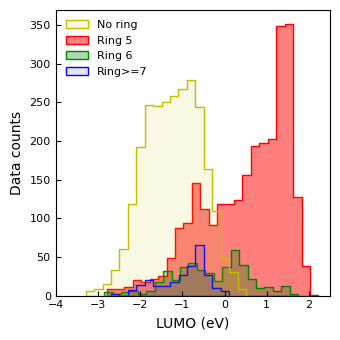

In [26]:
df = df_qm9.copy()
df['NumRingAtom'] = [ n if n<=6 else 999 for n in df['NumRingAtom'] ]

colors = ['r','g','b']
fig, axs = plt.subplots( 1 ,1, figsize=(3.5,3.5), tight_layout=True, )#dpi=100)
#sns.histplot( df, x='LUMO', hue='NumRingAtom', kde=False, binwidth=0.2, ax=axs, element="step", alpha=0.3, fill=True, palette=colors, label='Style')#  )#, stat='percent', multiple="stack", 
sns.histplot( df[df['NumRingAtom']==5], x='LUMO', kde=False, binwidth=0.2, ax=axs, element="step", alpha=0.5, fill=True, color='r', label='Ring 5')#  )#, stat='percent', multiple="stack", 
sns.histplot( df[df['NumRingAtom']==6], x='LUMO', kde=False, binwidth=0.2, ax=axs, element="step", alpha=0.3, fill=True, color='g', label='Ring 6')#  )#, stat='percent', multiple="stack", 
sns.histplot( df[df['NumRingAtom']>=7], x='LUMO', kde=False, binwidth=0.2, ax=axs, element="step", alpha=0.1, fill=True, color='b', label='Ring>=7')#  )#, stat='percent', multiple="stack", 

df = pd.read_csv('df_final_pnl_cccc.csv', index_col=0)
sns.histplot( df, x='LUMO', kde=False, binwidth=0.2, ax=axs, element="step", alpha=0.1, fill=True, color='y', label='No ring')#  )#, stat='percent', 

axs.tick_params(direction='in',labelsize=8)
axs.legend(fontsize=8, frameon=False, loc=2)
axs.set_xlim((-4,2.5))

handles, labels = axs.get_legend_handles_labels()
#labels = ['Ring>=7','Ring 6','Ring 5','No ring']
axs.legend([handles[-1]]+handles[:-1], [labels[-1]]+labels[:-1], fontsize=8, frameon=False, loc=2)#, ncol=1, bbox_to_anchor=(1,1.3), handlelength=1, handletextpad=0.2, columnspacing=1)

axs.set_xlabel('LUMO (eV)', fontsize=10)
axs.set_ylabel('Data counts', fontsize=10)

plt.savefig("QM9_Hist_Rings.png", dpi=800) 

plt.show()

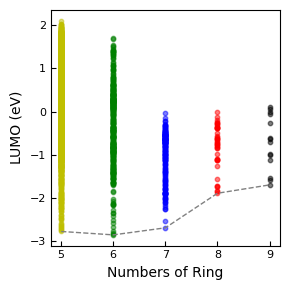

In [27]:
colors = ['y','g','b','r','k']

fig, axs = plt.subplots(1,1, figsize=(3.,3), tight_layout=True)

low_y=[]
for i,n in enumerate(x_range):
    df = df_qm9[ df_qm9['NumRingAtom']==n ]  
    x = np.full( len(df), n )
    y = df['LUMO']
    low_y.append(np.amin(y))
    #x,y,z = color_density(x, y)
    axs.scatter(x, y, marker='o', c=colors[i], cmap='jet', label='', alpha=0.5, s=10) 
axs.plot( x_range, low_y, ls='--', color='gray',lw=1)
axs.tick_params(direction='in',labelsize=8)
axs.set_ylabel('LUMO (eV)', fontsize=10)
axs.set_xlabel('Numbers of Ring', fontsize=10)
axs.set_xticks( x_range )
plt.show()

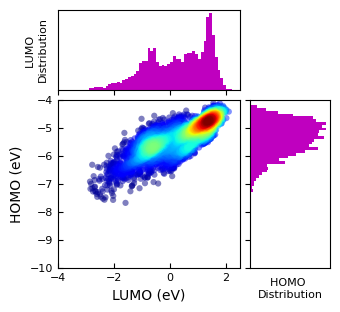

In [28]:
fig, axs = plt.subplots(1,1,figsize=(3.5,3.5),tight_layout=True,)#dpi=100)
x=np.array(df_qm9['LUMO'])
y= np.array(df_qm9['HOMO'])
xy = np.vstack([x, y])
z = stats.gaussian_kde(xy)(xy)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
#z = plt.cm.jet(z)

im = axs.scatter( x,y, c=z, marker='o', cmap='jet',alpha=0.5, edgecolors='none', s=20)
axs.set_aspect(1.)

axs.set_xlabel('LUMO (eV)',fontsize=10) ## input X name
axs.set_ylabel('HOMO (eV)',fontsize=10) ## input Y name
axs.tick_params(direction='in',labelsize=8)
axs.set_xlim([-4,2.5])
axs.set_ylim([-10,-4])

divider = make_axes_locatable(axs)
extra_length = 0.8
axHistx = divider.append_axes("top", extra_length, pad=0.1, sharex=axs)
axHisty = divider.append_axes("right", extra_length, pad=0.1, sharey=axs)
axHistx.xaxis.set_tick_params(labelbottom=False)
axHisty.yaxis.set_tick_params(labelleft=False)

## Hist info
binwidth = 0.1
xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
lim = (int(xymax/binwidth) + 1)*binwidth
bins = np.arange(-lim, lim + binwidth, binwidth)
axHistx.hist(x, bins=bins, color='m')
axHisty.hist(y, bins=bins, orientation='horizontal',color='m')

axHistx.set_ylabel('LUMO \nDistribution',fontsize=8)
axHisty.set_xlabel('HOMO \nDistribution',fontsize=8) 
#axHistx.set_ylim([0,620])
#axHisty.set_xlim([0,620])
axHistx.set_yticks([])
axHisty.set_xticks([])

plt.savefig("Figure_3_QM9_LUMOHOMO.png", dpi=800)     

plt.show()

Before clean (3382, 132)
After clean (3382, 121)
Num of keep:  87
Num of drop:  34
---------


,LUMO
rdk_EState_VSA10,-0.681961


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8074227167162938  from  19
Exp Var:  [0.17404273 0.08202971 0.07579004 0.05828451 0.05286241 0.04640872
 0.04295507 0.04111052 0.03375272 0.02924761 0.0283728  0.02454407
 0.02219932 0.02101728 0.01788657 0.01547379 0.01476874 0.01358682
 0.01308927]


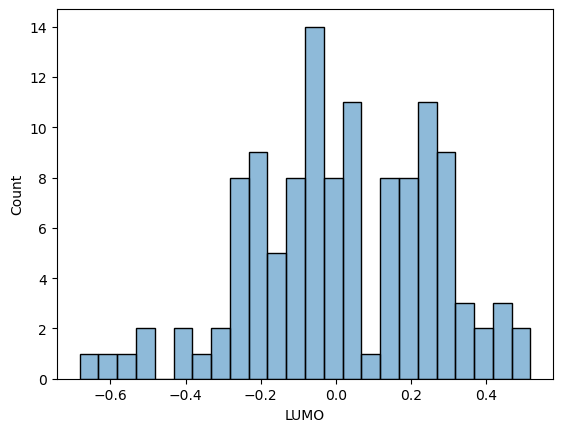

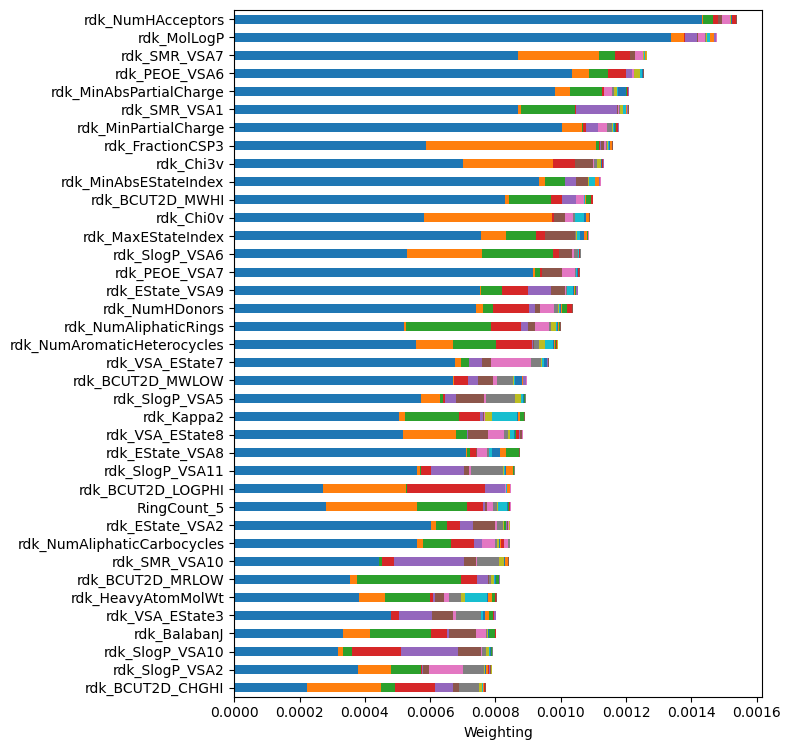

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15,pc16,pc17,pc18,pc19,length
rdk_NumHAcceptors,-0.217405,-0.023446,0.072231,0.069708,0.018645,0.074984,0.115695,-0.001026,-0.035512,-0.014430,-0.054167,-0.051994,0.012387,0.151553,0.022391,0.115369,-0.044959,-0.019875,-0.036535,0.001540
rdk_MolLogP,0.210180,-0.075368,-0.021350,-0.024106,-0.114596,0.029830,0.113283,-0.031925,-0.061046,0.090241,-0.014281,0.146380,-0.033013,0.017665,0.130830,-0.028039,0.094690,0.015293,-0.015556,0.001478
rdk_SMR_VSA7,0.169281,0.192475,0.092235,-0.116212,0.015386,-0.081703,0.116031,0.001455,0.047688,-0.058152,0.053159,-0.023056,0.010758,0.039840,-0.067451,0.038919,0.012976,-0.016424,0.053088,0.001263
rdk_PEOE_VSA6,0.184756,0.088291,0.100757,0.126675,-0.081557,0.015752,-0.059088,0.008550,-0.120053,-0.102607,-0.028788,0.056808,-0.021784,-0.006466,-0.011881,0.039854,0.025862,0.007190,-0.015169,0.001254
rdk_MinAbsPartialCharge,-0.180077,0.081953,0.130342,-0.043152,-0.001829,-0.023826,0.116183,-0.058797,0.091313,0.052757,-0.174359,0.037823,-0.085426,-0.046155,0.104395,-0.040160,-0.055886,0.050302,-0.012014,0.001210
rdk_SMR_VSA1,-0.169472,-0.034143,0.169547,-0.039233,-0.211963,-0.017319,0.047854,0.043672,-0.091362,0.094464,0.000906,0.081105,-0.042896,-0.033890,-0.059914,0.094384,0.023194,-0.000343,0.016335,0.001208
rdk_MinPartialCharge,0.182058,0.094145,0.029001,0.047507,0.117140,-0.020832,-0.119425,-0.092365,-0.064018,-0.048463,-0.072098,0.015781,0.062556,0.130897,0.033110,-0.000527,-0.025163,0.026506,0.021124,0.001177
rdk_FractionCSP3,0.139204,-0.278418,0.041252,-0.011447,-0.044090,-0.062900,0.058504,0.049078,-0.045914,0.032280,-0.064549,-0.103549,-0.040202,-0.013808,-0.015653,-0.080388,-0.030466,-0.038760,-0.014233,0.001159
rdk_Chi3v,0.152166,-0.202010,0.014669,0.140149,0.004215,-0.161291,0.032623,-0.073674,0.097981,-0.023466,0.066978,-0.005818,-0.043361,0.083488,-0.065176,0.017852,0.025315,-0.025236,0.010534,0.001132
rdk_MinAbsEStateIndex,0.175422,-0.055594,-0.101724,-0.008998,0.109077,0.130652,0.015883,-0.014132,0.059278,0.136899,-0.055393,0.135961,0.011581,0.039017,0.093385,0.069060,0.026441,0.021949,0.109313,0.001124


0 rdk_NumHAcceptors
1 rdk_MolLogP
2 rdk_SMR_VSA7
3 rdk_PEOE_VSA6
4 rdk_MinAbsPartialCharge
5 rdk_SMR_VSA1
6 rdk_MinPartialCharge
7 rdk_FractionCSP3
8 rdk_Chi3v
9 rdk_MinAbsEStateIndex


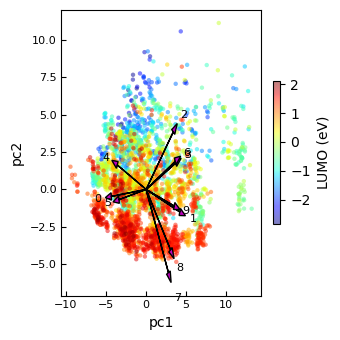

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19']


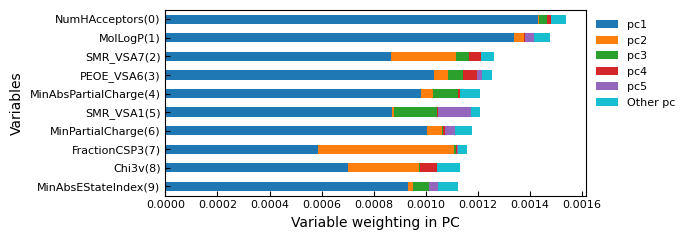

In [29]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'RingCount_' in c ]    
X_features = df_qm9[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=10, explained_var=exp_var, num_feature=10,
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_QM9_rdk.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='rdk_', save_to_file='Figure_PCA_QM9_rdk_TopFeatures.png')

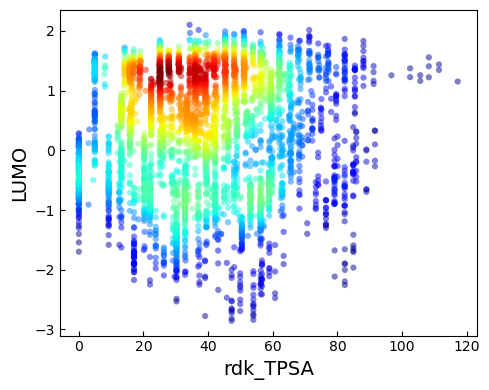

In [82]:
fig, axs = plt.subplots(1,1, figsize=(5,4),tight_layout=True)
xlabel = 'rdk_TPSA'
y=np.array(df_qm9['LUMO'])
x= np.array(df_qm9[xlabel])
xy = np.vstack([x, y])
z = stats.gaussian_kde(xy)(xy)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
#z = plt.cm.jet(z)    
im = axs.scatter( x,y, c=z, marker='o', cmap='jet',alpha=0.5, edgecolors='none', s=20)
axs.set_ylabel('LUMO',fontsize=14) ## input X name
axs.set_xlabel(xlabel,fontsize=14) ## input Y name
axs.tick_params(direction='in',labelsize='10')
im
def see_correlation(df, xlabel, ylabel='LUMO'):


Before clean (3382, 891)
After clean (3382, 367)
Num of keep:  185
Num of drop:  182
---------


,LUMO


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8006657110369286  from  62
Exp Var:  [0.08266286 0.06203806 0.03813611 0.03595946 0.02918505 0.02545539
 0.02436555 0.01979404 0.01968638 0.01882118 0.01816409 0.01601918
 0.01523792 0.01489688 0.01357287 0.01282802 0.01272562 0.01237195
 0.01211822 0.01196519 0.01148573 0.01124148 0.01090348 0.01060856
 0.01015727 0.00971369 0.00962857 0.00931417 0.00905675 0.00882875
 0.00845087 0.00831735 0.00805786 0.00791085 0.0075931  0.00739607
 0.0072449  0.00720461 0.007167   0.00706457 0.00683054 0.00672558
 0.00658919 0.00637095 0.00627988 0.00623016 0.00607892 0.00589752
 0.0057109  0.00562584 0.00558468 0.0055793  0.00553041 0.00549312
 0.00547743 0.0054613  0.00542088 0.00539746 0.00530939 0.00528441
 0.00527459 0.00516362]


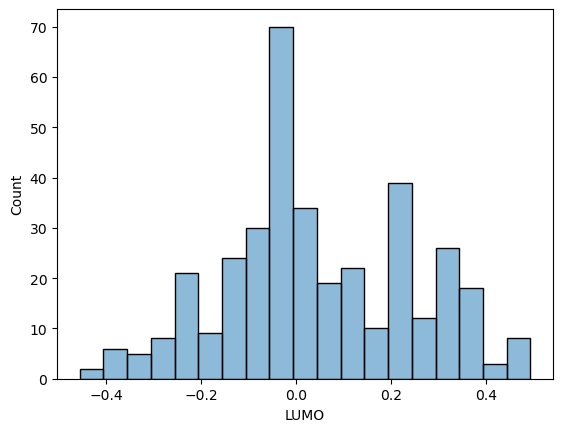

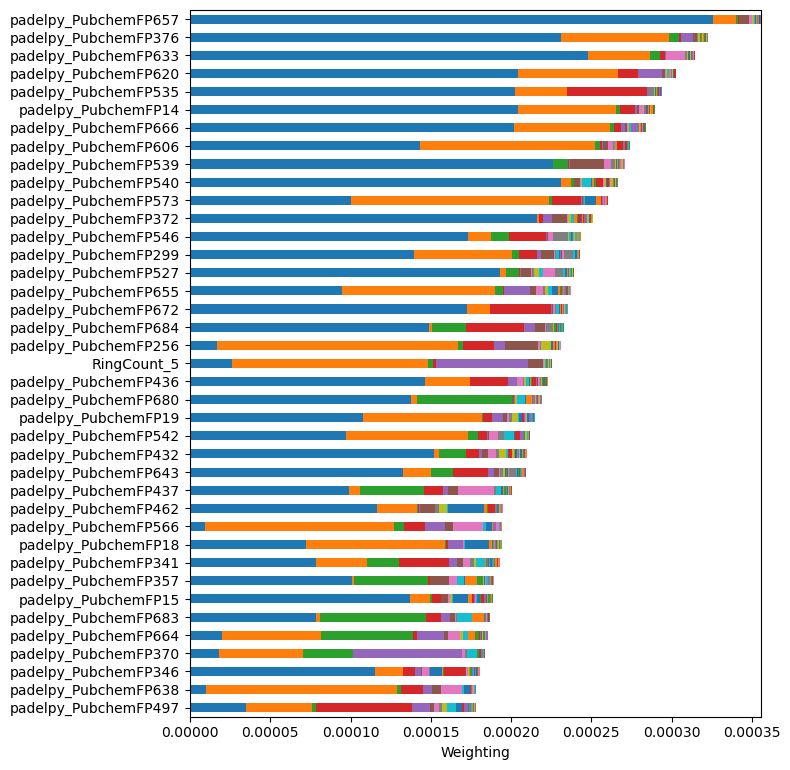

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc54,pc55,pc56,pc57,pc58,pc59,pc60,pc61,pc62,length
padelpy_PubchemFP657,-0.218295,-0.060897,0.032159,-0.015749,0.014402,-0.098920,0.058436,0.012555,0.047260,0.049286,...,-0.003571,-0.001931,0.000169,-0.032521,0.031564,0.010879,-0.017711,0.007361,0.005639,0.000355
padelpy_PubchemFP376,-0.183932,-0.132025,0.067107,-0.023746,-0.096786,0.061816,0.012335,-0.019827,-0.055858,0.004440,...,-0.004601,0.006072,-0.013320,0.004635,-0.011363,0.003258,0.010150,-0.016599,-0.001998,0.000323
padelpy_PubchemFP633,-0.190445,-0.100220,0.066645,-0.049426,0.026023,0.005256,0.141110,0.045183,-0.040564,-0.035273,...,-0.012701,0.011372,-0.012986,0.009670,-0.034003,-0.001150,0.026391,-0.020235,-0.010477,0.000315
padelpy_PubchemFP620,0.172988,-0.126763,-0.014604,-0.099109,-0.130980,0.054749,-0.028274,0.031795,-0.038580,0.056081,...,-0.003668,-0.004076,-0.000725,0.008017,0.007904,0.000723,-0.000528,-0.019186,-0.005048,0.000303
padelpy_PubchemFP535,0.172072,-0.091965,-0.004601,-0.196015,0.038321,0.009041,-0.011967,0.084913,0.045219,0.023892,...,0.015824,-0.003287,-0.000950,0.023306,-0.003177,0.008259,-0.057811,0.020997,0.007311,0.000294
padelpy_PubchemFP14,-0.172823,-0.125841,0.042054,-0.086332,0.032247,0.052154,0.062680,0.007053,-0.026577,-0.004837,...,0.006613,-0.000369,-0.001132,0.041294,-0.003486,-0.007712,0.009133,-0.041488,-0.003440,0.000290
padelpy_PubchemFP666,0.171844,-0.124384,-0.042659,-0.058078,-0.056980,0.038055,-0.036942,-0.022745,-0.013711,0.060603,...,-0.062133,0.025267,0.005466,-0.085913,0.043513,-0.022534,0.060945,-0.054399,-0.011724,0.000284
padelpy_PubchemFP606,0.144792,-0.168206,0.047484,0.029009,-0.031557,0.067988,0.074236,-0.021568,-0.001035,-0.044599,...,0.008795,-0.003757,-0.004101,-0.009525,0.022389,0.008991,-0.011000,0.006322,-0.003882,0.000274
padelpy_PubchemFP539,-0.181890,0.005563,0.078439,-0.029435,0.017356,-0.180920,0.088013,-0.082570,0.034190,0.015554,...,-0.001689,0.000445,-0.021776,0.018682,-0.002891,-0.005437,-0.000695,-0.038625,0.021998,0.000271
padelpy_PubchemFP540,-0.183811,-0.041213,-0.033142,-0.018511,-0.004614,-0.072093,0.032841,0.017482,0.029114,0.127038,...,0.005011,-0.019352,-0.000892,-0.005965,0.014076,0.020202,-0.037469,0.007951,-0.001290,0.000266


0 padelpy_PubchemFP657
1 padelpy_PubchemFP376
2 padelpy_PubchemFP633
3 padelpy_PubchemFP620
4 padelpy_PubchemFP535
5 padelpy_PubchemFP14
6 padelpy_PubchemFP666
7 padelpy_PubchemFP606
8 padelpy_PubchemFP539
9 padelpy_PubchemFP540


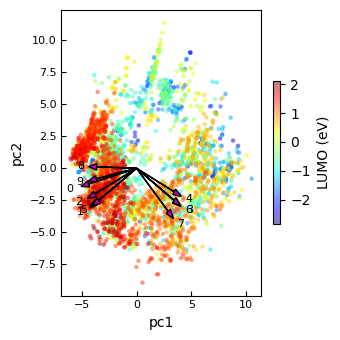

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26', 'pc27', 'pc28', 'pc29', 'pc30', 'pc31', 'pc32', 'pc33', 'pc34', 'pc35', 'pc36', 'pc37', 'pc38', 'pc39', 'pc40', 'pc41', 'pc42', 'pc43', 'pc44', 'pc45', 'pc46', 'pc47', 'pc48', 'pc49', 'pc50', 'pc51', 'pc52', 'pc53', 'pc54', 'pc55', 'pc56', 'pc57', 'pc58', 'pc59', 'pc60', 'pc61', 'pc62']


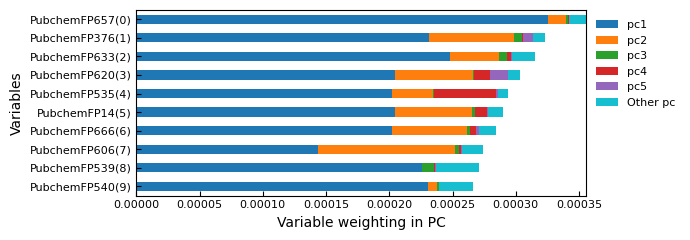

In [30]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'padelpy_PubchemFP' in c or 'RingCount_' in c ]  
X_features = df_qm9[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=10, explained_var=exp_var, num_feature=10,
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_QM9_pubchem.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_QM9_pubchem_TopFeatures.png')

Before clean (3382, 1391)
After clean (3382, 1014)
Num of keep:  308
Num of drop:  706
---------


,LUMO
padelpy_AATS0v,-0.699963
padelpy_AATS1v,-0.743181
padelpy_AATS0p,-0.630876
padelpy_AATS1p,-0.611282
padelpy_GATS1m,0.644498
padelpy_GATS1e,0.684172
padelpy_GATS1s,0.697916
padelpy_nBondsS,0.633815
padelpy_nBondsD,-0.671951
padelpy_nBondsD2,-0.671951


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8029990335396738  from  30
Exp Var:  [0.13674439 0.09433334 0.0702152  0.06058309 0.04332171 0.03652796
 0.03412614 0.03363989 0.02704501 0.02373025 0.02198399 0.02131191
 0.01942679 0.01786797 0.01541891 0.01417046 0.01366946 0.01175016
 0.01160475 0.011094   0.01074871 0.00970703 0.00922986 0.00910519
 0.00872984 0.00834137 0.00762607 0.00744581 0.00694199 0.00655779]


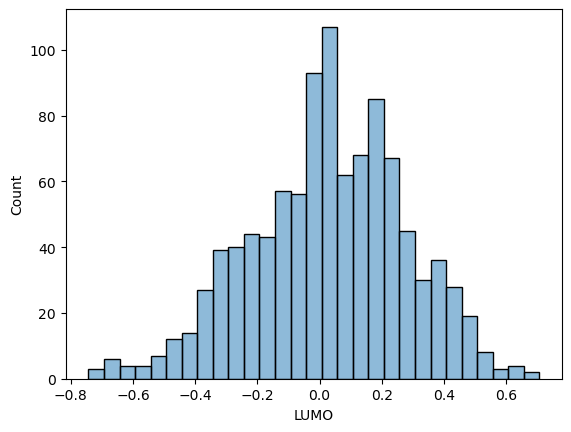

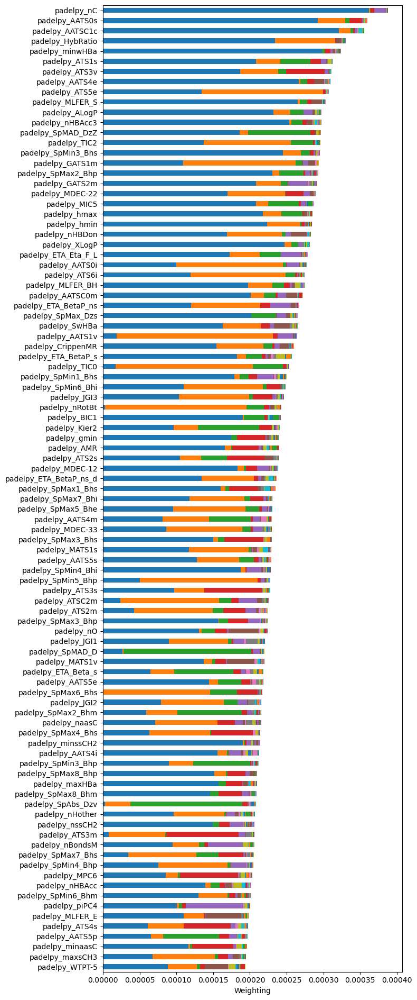

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc22,pc23,pc24,pc25,pc26,pc27,pc28,pc29,pc30,length
padelpy_nC,0.139065,0.013313,0.011851,-0.037586,-0.092092,-0.021475,-0.000853,-0.004789,-0.032811,-0.002056,...,0.006914,0.000656,0.000257,-0.005530,-0.008467,0.006279,0.003087,-0.011861,-0.020163,0.000388
padelpy_AATS0s,-0.124969,0.064893,-0.033844,-0.069558,-0.021130,0.017603,0.002508,0.017586,-0.048844,-0.035775,...,0.005833,0.034013,-0.008897,-0.009690,-0.004661,0.014587,0.004263,-0.004679,-0.023215,0.000360
padelpy_AATSC1c,0.131013,0.041791,0.028380,0.023539,-0.044483,0.012741,-0.017825,-0.015278,0.030676,-0.095809,...,0.020149,-0.061269,0.003856,-0.005219,-0.009473,-0.039013,0.011117,0.037532,0.012950,0.000356
padelpy_HybRatio,0.111905,-0.095827,-0.002612,0.014268,0.020007,0.073780,-0.017973,-0.006980,0.010817,-0.040831,...,0.049152,0.000212,-0.015635,-0.028311,0.051131,0.042454,-0.022543,0.035466,0.023656,0.000330
padelpy_minwHBa,0.126302,0.000961,0.025731,0.047332,0.037574,-0.050615,-0.026853,-0.051541,0.018988,-0.030786,...,-0.015549,0.026679,0.019884,0.058557,-0.014488,0.029633,0.047728,0.006669,0.055880,0.000324
padelpy_ATS1s,-0.105576,-0.060546,-0.091110,-0.062764,-0.063797,-0.023319,-0.012874,-0.027976,-0.084844,0.030377,...,-0.035206,0.030668,-0.011272,0.005447,0.006630,0.014820,0.020496,0.003206,0.019457,0.000313
padelpy_ATS3v,0.099871,-0.076467,0.045891,-0.119852,-0.051099,-0.036886,0.000620,-0.012745,-0.014096,-0.047312,...,-0.037089,0.009080,0.009925,0.001087,0.023020,0.007356,-0.024827,0.000967,0.003168,0.000311
padelpy_AATS4e,-0.119373,0.015913,-0.043809,-0.049546,-0.006236,0.100972,-0.030037,-0.057294,-0.030166,0.030522,...,0.040091,0.002058,-0.009124,-0.019756,0.021511,-0.006704,0.004690,-0.018280,-0.039551,0.000310
padelpy_ATS5e,0.084759,-0.136068,-0.006699,-0.028380,-0.014468,0.018014,-0.021775,-0.018321,-0.020914,-0.034977,...,-0.031858,0.046010,0.035957,0.030414,-0.003197,0.022613,0.001378,0.021320,-0.006778,0.000308
padelpy_MLFER_S,-0.119014,-0.018173,-0.044789,-0.040632,0.011078,-0.102015,-0.001481,-0.019640,0.020067,-0.038940,...,0.013569,0.028560,-0.008807,-0.020014,0.002795,0.018210,-0.009865,-0.042662,-0.069568,0.000303


0 padelpy_nC
1 padelpy_AATS0s
2 padelpy_AATSC1c
3 padelpy_HybRatio
4 padelpy_minwHBa
5 padelpy_ATS1s
6 padelpy_ATS3v
7 padelpy_AATS4e
8 padelpy_ATS5e
9 padelpy_MLFER_S


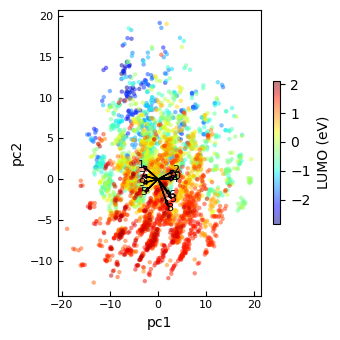

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26', 'pc27', 'pc28', 'pc29', 'pc30']


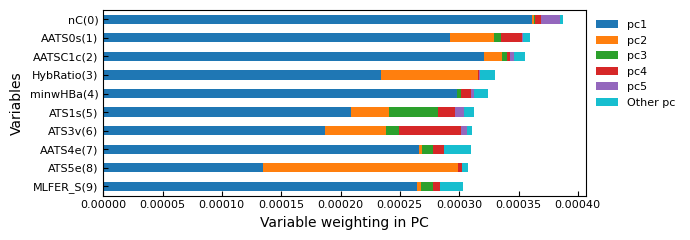

In [31]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'padelpy_PubchemFP' not in c and ('padelpy_' in c or 'RingCount_' in c) ]    
X_features = df_qm9[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=10, explained_var=exp_var, num_feature=10,
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_QM9_padelpy.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_QM9_padelpy_TopFeatures.png')

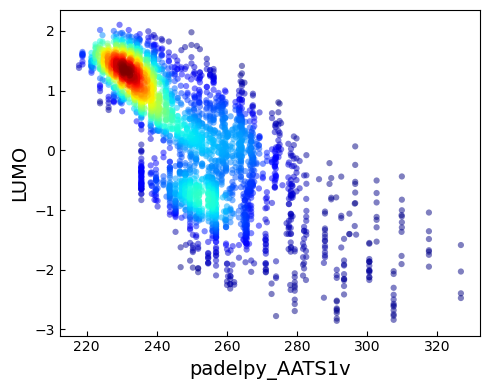

In [188]:
see_correlation(df_qm9, 'padelpy_AATS1v', ylabel='LUMO')


Before clean (3382, 2394)
After clean (3382, 1490)
Num of keep:  524
Num of drop:  966
---------


,LUMO
rdk_EState_VSA10,-0.681961
padelpy_AATS0v,-0.699963
padelpy_AATS1v,-0.743181
padelpy_AATS0p,-0.630876
padelpy_AATS1p,-0.611282
padelpy_GATS1m,0.644498
padelpy_GATS1e,0.684172
padelpy_GATS1s,0.697916
padelpy_nBondsS,0.633815
padelpy_nBondsD,-0.671951


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8006804737771327  from  61
Exp Var:  [0.11009226 0.06827487 0.0508672  0.04639283 0.03927372 0.03457946
 0.02891076 0.02574581 0.0223856  0.0213973  0.02024836 0.01848091
 0.0165648  0.01537962 0.01377964 0.01318075 0.01250902 0.01139243
 0.01021472 0.00985498 0.00936002 0.00909687 0.00853722 0.00820571
 0.00808834 0.0078199  0.00716984 0.00692564 0.006743   0.00637201
 0.00604201 0.00598614 0.00587175 0.00578719 0.00560007 0.00534564
 0.00518905 0.00507861 0.0050152  0.00479122 0.004724   0.00452877
 0.00438534 0.00437056 0.00428503 0.00414989 0.00407268 0.00394188
 0.00381304 0.00366238 0.00364271 0.00358355 0.00352893 0.00347125
 0.00338708 0.00327278 0.00317919 0.00311694 0.00306653 0.00302658
 0.00292086]


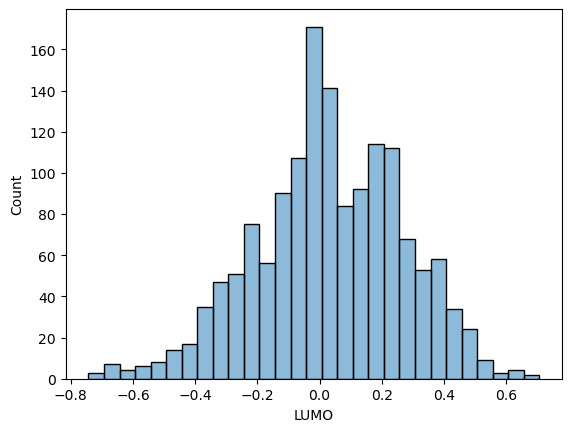

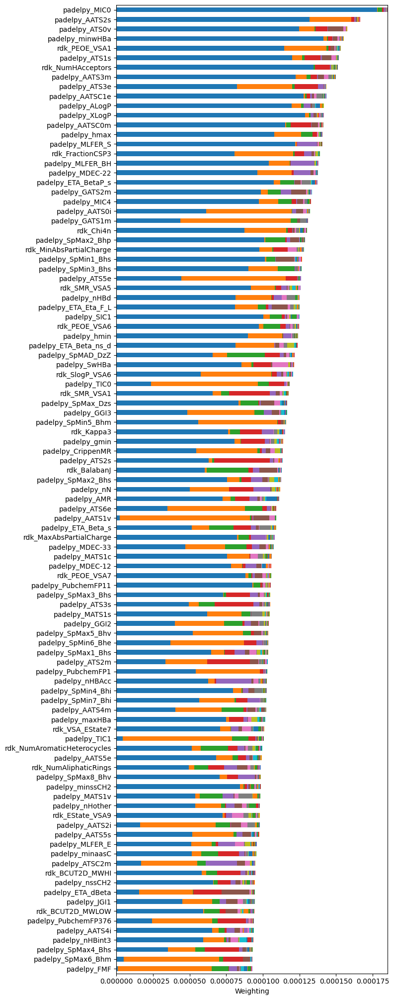

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc53,pc54,pc55,pc56,pc57,pc58,pc59,pc60,pc61,length
padelpy_MIC0,-0.121215,0.005646,-0.035842,-0.019390,0.028434,0.012978,0.018781,-0.015440,-0.009582,-0.002735,...,-0.012787,-0.007621,-0.021525,0.012406,-0.002509,-0.004196,0.013123,-0.005574,0.005641,0.000185
padelpy_AATS2s,-0.104366,0.078128,-0.003021,-0.029026,0.028540,-0.021106,0.013730,0.018469,0.021116,-0.010270,...,0.009801,0.005599,0.019594,0.025432,-0.018138,-0.007704,0.020529,0.000512,0.010134,0.000167
padelpy_ATS0v,0.101429,-0.047916,-0.014474,-0.061420,0.015191,-0.094564,-0.041776,-0.023621,0.026681,-0.006285,...,-0.002405,-0.003096,-0.003837,-0.016144,0.000536,0.010712,-0.012234,0.002301,-0.003990,0.000158
padelpy_minwHBa,0.107971,-0.023668,-0.012044,0.038816,-0.009909,0.050920,-0.043927,-0.026362,0.010282,0.007529,...,-0.031689,-0.014219,-0.002149,-0.002831,0.006373,-0.013381,0.023945,-0.039835,0.002890,0.000155
rdk_PEOE_VSA1,-0.097183,-0.078654,-0.024699,-0.024767,0.000504,0.047156,-0.026178,0.040401,0.023391,0.041408,...,0.033230,-0.033270,0.026870,0.010067,0.017890,-0.007369,-0.015793,-0.024226,0.007020,0.000153
padelpy_ATS1s,-0.099546,-0.038134,-0.025707,-0.070921,0.025311,-0.073440,-0.059144,0.022094,0.037911,-0.013984,...,-0.016528,-0.007774,0.010855,0.006487,0.001638,-0.007815,0.001597,-0.008464,0.010089,0.000152
rdk_NumHAcceptors,-0.105361,-0.000098,-0.021025,-0.068400,-0.019044,0.014970,0.006376,-0.023465,0.043189,0.026047,...,0.009737,0.012045,-0.006220,-0.011983,-0.003878,-0.000580,-0.018185,-0.025175,-0.023354,0.000151
padelpy_AATS3m,-0.100512,0.039442,0.032390,-0.046545,-0.021921,-0.057585,-0.058673,-0.062604,0.029100,0.018411,...,-0.009356,0.019257,-0.005047,-0.003301,0.000691,-0.000678,0.015077,0.024688,-0.009581,0.000150
padelpy_ATS3e,0.082362,-0.090045,0.026386,-0.085648,0.050158,0.015605,0.012217,0.023959,-0.019488,-0.013661,...,-0.002105,-0.015247,0.000155,-0.010350,0.001827,0.009449,0.005745,-0.007126,-0.002159,0.000143
padelpy_AATSC1e,0.102714,0.013532,-0.019464,0.035191,-0.027694,-0.033638,0.043355,-0.079064,-0.009637,-0.005775,...,0.010174,0.004581,-0.020255,-0.000728,0.016231,-0.031910,-0.044025,-0.029062,0.027916,0.000143


0 padelpy_MIC0
1 padelpy_AATS2s
2 padelpy_ATS0v
3 padelpy_minwHBa
4 rdk_PEOE_VSA1
5 padelpy_ATS1s
6 rdk_NumHAcceptors
7 padelpy_AATS3m
8 padelpy_ATS3e
9 padelpy_AATSC1e


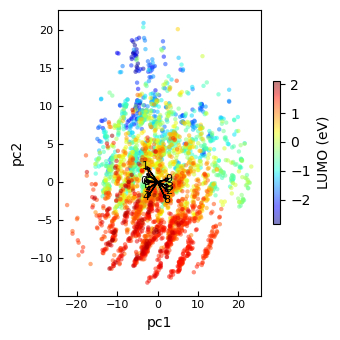

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26', 'pc27', 'pc28', 'pc29', 'pc30', 'pc31', 'pc32', 'pc33', 'pc34', 'pc35', 'pc36', 'pc37', 'pc38', 'pc39', 'pc40', 'pc41', 'pc42', 'pc43', 'pc44', 'pc45', 'pc46', 'pc47', 'pc48', 'pc49', 'pc50', 'pc51', 'pc52', 'pc53', 'pc54', 'pc55', 'pc56', 'pc57', 'pc58', 'pc59', 'pc60', 'pc61']


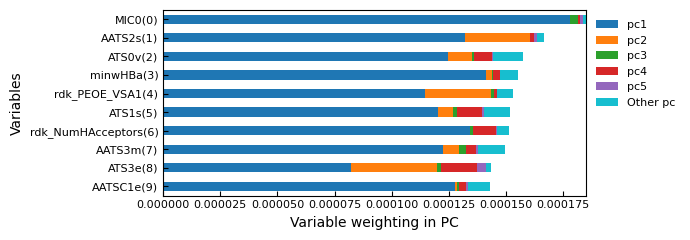

In [32]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c ]    
X_features = df_qm9[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=10, explained_var=exp_var, num_feature=10,
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_QM9_everything.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_QM9_everything_TopFeatures.png')

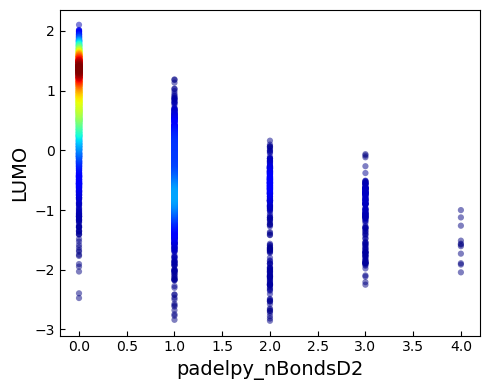

In [38]:
see_correlation(df_qm9, 'padelpy_nBondsD2', ylabel='LUMO')

### 3. Both PNL and QM9

In [33]:
#df_pnl = df_diene_pattern[ df_diene_pattern['source'] =='PNL' ].sort_values(by='LUMO',ascending=True)
#df_qm9 = df_diene_pattern[ df_diene_pattern['source'] =='QM9' ].sort_values(by='LUMO',ascending=True)

df_both = pd.concat([df_pnl,df_qm9], axis=0)
df_both

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,NumRingAtom
257,-7.844547,-3.291623,C=C/C(C#N)=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1375,-7.729353,-3.250645,N#C/C=C/C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4352,-7.672307,-3.163207,N#C/C=C\C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2759,-7.781885,-3.136265,C=C/C(C=O)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1759,-7.776203,-3.126049,C=C/C(C#N)=C/C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5546,-4.443507,1.991823,COc1ccc(O)[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
14784,-4.372759,1.997265,CCOc1cc(N)c[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
13875,-4.361875,2.013592,CNc1c[nH]c(OC)c1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
14486,-4.663914,2.013592,COc1c[nH]c(O)c1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0


Before clean (5965, 123)
After clean (5965, 118)
Num of keep:  83
Num of drop:  35
---------


,LUMO
rdk_EState_VSA10,-0.639360
rdk_NumAromaticHeterocycles,0.651685


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8068958039132906  from  18
Exp Var:  [0.1565391  0.1350058  0.08577513 0.06074726 0.05042988 0.03728259
 0.03538815 0.03270104 0.03128974 0.02973831 0.02675213 0.02343082
 0.02086284 0.01878107 0.01768154 0.0159538  0.01427755 0.01425905]


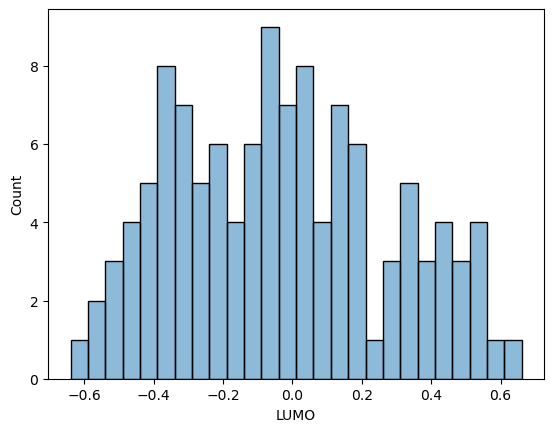

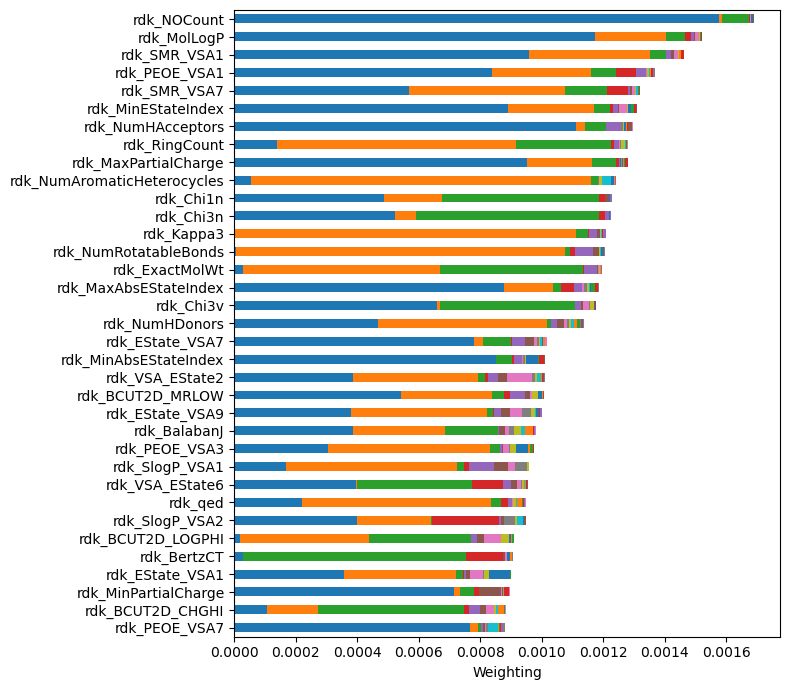

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15,pc16,pc17,pc18,length
rdk_NOCount,-0.253704,-0.022928,0.108690,0.026619,-0.017769,0.013704,-0.044754,0.011312,-0.032190,-0.001008,0.072315,-0.018831,-0.024415,-0.073976,0.035175,0.082211,-0.005498,-0.031287,0.001690
rdk_MolLogP,0.218644,0.113060,0.091441,-0.068971,-0.066977,-0.037121,0.109131,0.020051,0.038328,-0.018225,-0.039451,0.007744,0.040493,-0.094902,-0.036602,0.037371,-0.019050,-0.014526,0.001520
rdk_SMR_VSA1,-0.197714,0.147226,0.083064,-0.001368,0.082373,-0.071701,0.103558,0.033557,0.040009,0.042328,-0.020632,0.088688,0.072173,-0.145280,0.033642,-0.039901,0.024957,-0.009668,0.001461
rdk_PEOE_VSA1,-0.184751,-0.133361,0.104226,0.131894,-0.113378,-0.005030,0.063820,0.025618,-0.058218,0.069830,-0.015966,0.068198,-0.024142,-0.128498,0.102964,-0.055653,-0.011639,-0.129005,0.001367
rdk_SMR_VSA7,0.152226,0.166830,0.136169,-0.136808,-0.047838,-0.074956,-0.075882,-0.017988,-0.068236,0.077202,-0.033615,0.045279,-0.037077,0.078642,-0.045515,-0.049664,-0.017067,-0.078024,0.001319
rdk_MinEStateIndex,0.190561,-0.123860,-0.084345,0.046881,-0.080034,-0.051493,-0.147403,-0.005758,0.043344,-0.028403,-0.118681,-0.026231,0.134906,-0.159848,-0.026425,0.066062,0.007805,0.022156,0.001309
rdk_NumHAcceptors,-0.212941,0.039806,0.096027,0.006133,-0.138775,0.004397,-0.013227,0.072980,0.066445,-0.006492,-0.098033,-0.065283,0.047339,-0.073034,0.050713,0.234200,0.083152,0.018797,0.001296
rdk_RingCount,0.075144,-0.206347,0.205664,-0.048582,0.076508,0.006342,-0.062784,0.060017,0.102965,0.062220,0.072548,0.075130,-0.000402,-0.041482,-0.031235,0.047444,-0.037458,0.036151,0.001281
rdk_MaxPartialCharge,-0.197066,0.107713,0.101877,-0.053177,0.044858,0.019157,-0.039529,0.025036,0.021753,-0.032742,0.073204,-0.093434,-0.042091,-0.170888,0.016311,-0.019075,0.051131,0.033995,0.001280
rdk_NumAromaticHeterocycles,-0.046721,-0.246403,0.053060,0.001949,0.025301,-0.013581,-0.024035,-0.031266,0.105095,-0.179280,0.126738,0.055957,0.000266,-0.079564,0.017973,0.056905,-0.099873,0.035158,0.001242


0 rdk_NOCount
1 rdk_MolLogP
2 rdk_SMR_VSA1
3 rdk_PEOE_VSA1
4 rdk_SMR_VSA7
5 rdk_MinEStateIndex
6 rdk_NumHAcceptors
7 rdk_RingCount
8 rdk_MaxPartialCharge
9 rdk_NumAromaticHeterocycles


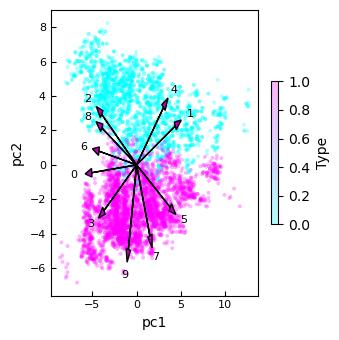

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18']


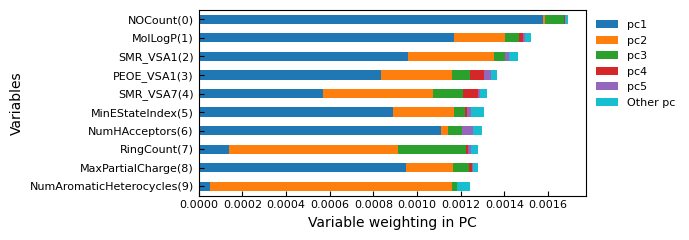

In [34]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_both.columns if 'rdk_' in c ]#or 'RingCount_' in c ]    
X_features = df_both[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

colors = [ 0 if d=='PNL' else 1 for d in df_both['source'] ]
#colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=8, explained_var=exp_var, num_feature=10, data_alpha=0.3, color_map='cool', cbar_label='Type',
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_both_rdk.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='rdk_', save_to_file='Figure_PCA_both_rdk_TopFeatures.png')

Before clean (5965, 891)
After clean (5965, 391)
Num of keep:  208
Num of drop:  183
---------


,LUMO
RingCount_5,0.691621
padelpy_PubchemFP143,0.691621
padelpy_PubchemFP146,0.692907
padelpy_PubchemFP256,0.651332
padelpy_PubchemFP376,0.679054
padelpy_PubchemFP449,0.627852
padelpy_PubchemFP464,0.605929
padelpy_PubchemFP545,0.651245
padelpy_PubchemFP549,0.653662
padelpy_PubchemFP592,0.634406


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8012195658862205  from  71
Exp Var:  [0.0836208  0.06749343 0.04211326 0.03199585 0.02219274 0.02042251
 0.01943044 0.01802227 0.01656919 0.01610979 0.01546282 0.01453319
 0.01372575 0.01314232 0.01274202 0.01250598 0.0121549  0.01158196
 0.01119115 0.01106484 0.01053508 0.01025512 0.01003755 0.00977528
 0.00958449 0.00923235 0.00909996 0.00889981 0.00867967 0.00849318
 0.00828374 0.0081873  0.00806374 0.00776685 0.00749582 0.00739372
 0.00733888 0.00713232 0.00682648 0.0066802  0.00651572 0.00648572
 0.0063841  0.0062894  0.00624234 0.00615082 0.00589223 0.00582743
 0.00576223 0.0056872  0.00559596 0.00543432 0.00534698 0.00529519
 0.00512655 0.00509822 0.00504284 0.00500767 0.0049349  0.00491087
 0.00487877 0.00486655 0.00485001 0.0048355  0.00482376 0.00480423
 0.0047476  0.00471329 0.00467708 0.00460968 0.00454564]


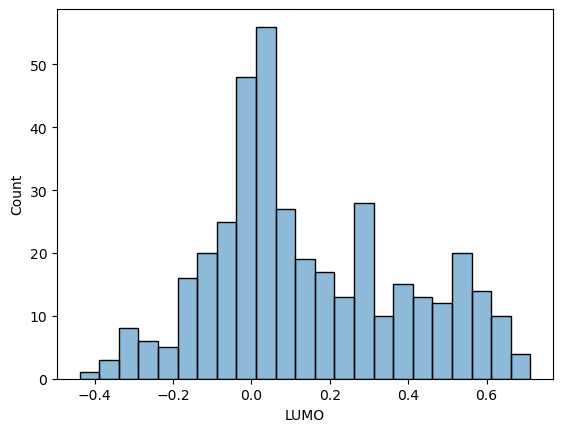

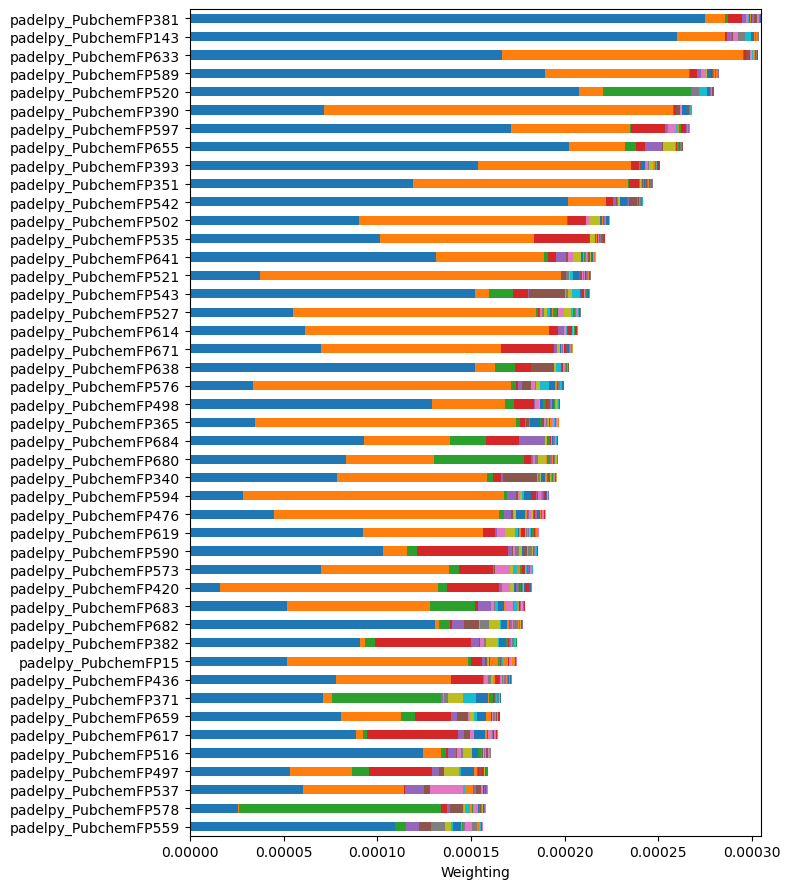

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc63,pc64,pc65,pc66,pc67,pc68,pc69,pc70,pc71,length
padelpy_PubchemFP381,0.198361,0.047496,-0.029663,0.086990,-0.062941,0.015091,-0.052967,0.014781,-0.028296,-0.020094,...,0.019467,-0.006973,-0.001223,-0.011460,0.012783,0.017331,0.009225,0.012094,-0.005632,0.000305
padelpy_PubchemFP143,0.192840,-0.074859,0.012645,-0.026448,-0.077123,-0.029963,-0.087188,-0.103146,-0.027252,0.113237,...,-0.004984,-0.005956,0.021421,0.000298,-0.010667,-0.007421,0.028180,0.010019,-0.004936,0.000304
padelpy_PubchemFP633,0.154369,-0.168135,0.012287,-0.035438,-0.009371,-0.068809,0.027740,0.035118,-0.035432,0.032984,...,-0.006113,-0.000832,0.018462,0.004933,-0.029882,-0.003318,0.053719,-0.019315,0.021279,0.000303
padelpy_PubchemFP589,0.164606,0.130093,-0.011297,-0.060475,-0.063870,0.021097,-0.088117,0.006107,-0.042071,0.010750,...,0.017268,-0.031401,0.012985,-0.018540,0.013608,0.030027,0.009239,0.024207,-0.044711,0.000282
padelpy_PubchemFP520,0.172301,-0.053331,0.162507,0.008203,-0.055365,-0.005951,-0.016008,0.093279,0.005884,0.128628,...,-0.016236,-0.037544,0.049792,-0.013000,-0.019777,0.018051,0.023237,-0.008833,-0.021627,0.000280
padelpy_PubchemFP390,0.101068,-0.202360,-0.013628,-0.034439,0.014481,-0.064417,0.047750,-0.021220,-0.016863,0.021734,...,0.029162,0.017850,-0.024732,0.018767,-0.032881,-0.016203,-0.023446,0.021248,-0.035618,0.000268
padelpy_PubchemFP597,0.156620,0.117834,0.020546,-0.132752,-0.052300,0.027166,-0.102986,-0.027870,0.025064,0.036582,...,-0.000473,0.032133,-0.027796,0.008653,0.017021,0.011352,0.005228,0.007781,-0.013450,0.000267
padelpy_PubchemFP655,0.170042,0.081181,0.056511,0.071670,-0.133510,-0.036373,0.017549,0.005572,-0.152532,-0.003194,...,-0.008023,0.001972,0.000479,-0.003729,-0.001476,-0.026585,-0.015256,-0.012565,0.026823,0.000263
padelpy_PubchemFP393,0.148235,-0.134016,-0.002784,-0.065553,-0.034089,0.014782,0.016182,0.032036,-0.000923,-0.013266,...,-0.005667,0.014823,-0.013421,0.003035,0.016261,-0.030634,-0.008256,-0.020704,0.025172,0.000251
padelpy_PubchemFP351,0.130450,-0.158906,-0.012424,-0.074271,-0.024054,-0.025058,-0.001163,0.001467,-0.038538,-0.008073,...,0.004048,0.033708,-0.045651,0.004405,0.021730,-0.037146,-0.025177,-0.043646,0.027230,0.000247


0 padelpy_PubchemFP381
1 padelpy_PubchemFP143
2 padelpy_PubchemFP633
3 padelpy_PubchemFP589
4 padelpy_PubchemFP520
5 padelpy_PubchemFP390
6 padelpy_PubchemFP597
7 padelpy_PubchemFP655
8 padelpy_PubchemFP393
9 padelpy_PubchemFP351


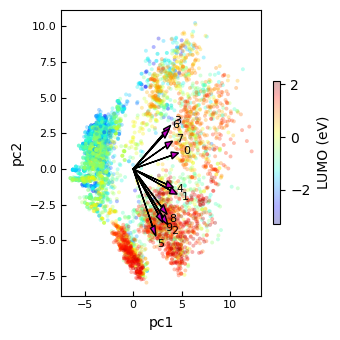

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26', 'pc27', 'pc28', 'pc29', 'pc30', 'pc31', 'pc32', 'pc33', 'pc34', 'pc35', 'pc36', 'pc37', 'pc38', 'pc39', 'pc40', 'pc41', 'pc42', 'pc43', 'pc44', 'pc45', 'pc46', 'pc47', 'pc48', 'pc49', 'pc50', 'pc51', 'pc52', 'pc53', 'pc54', 'pc55', 'pc56', 'pc57', 'pc58', 'pc59', 'pc60', 'pc61', 'pc62', 'pc63', 'pc64', 'pc65', 'pc66', 'pc67', 'pc68', 'pc69', 'pc70', 'pc71']


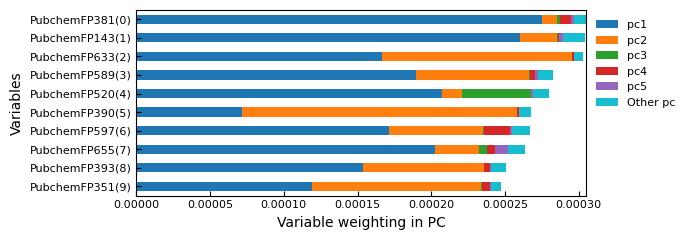

In [35]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_both.columns if 'padelpy_PubchemFP' in c or 'RingCount_' in c ]    
X_features = df_both[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

#colors = [ 0 if d=='PNL' else 1 for d in df_both['source'] ]
colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=8, explained_var=exp_var, num_feature=10, data_alpha=0.3, #color_map='cool', cbar_label='Type',
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_both_PubchemFP.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_both_PubchemFP_TopFeatures.png')

Before clean (5965, 1391)
After clean (5965, 1062)
Num of keep:  337
Num of drop:  725
---------


,LUMO
RingCount_5,0.691621
padelpy_GATS1e,0.712920
padelpy_nBondsD,-0.794308
padelpy_nBondsD2,-0.794308
padelpy_nHdsCH,-0.615558
padelpy_ndsCH,-0.615558
padelpy_naasC,0.656849
padelpy_ndO,-0.646631
padelpy_SHdsCH,-0.639740
padelpy_SdO,-0.647503


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8044767115662524  from  38
Exp Var:  [0.13920412 0.09109306 0.07014745 0.05295399 0.03664498 0.03153932
 0.02966899 0.02896265 0.02372995 0.02279877 0.02212415 0.01817841
 0.01777338 0.01476154 0.01382475 0.0131663  0.01191059 0.01151753
 0.01139023 0.01082692 0.01030697 0.00948448 0.00934288 0.00913565
 0.00878125 0.00826479 0.00784108 0.00759243 0.0074506  0.007181
 0.00661504 0.00634019 0.00619283 0.00584643 0.00562958 0.00556801
 0.00540152 0.00528492]


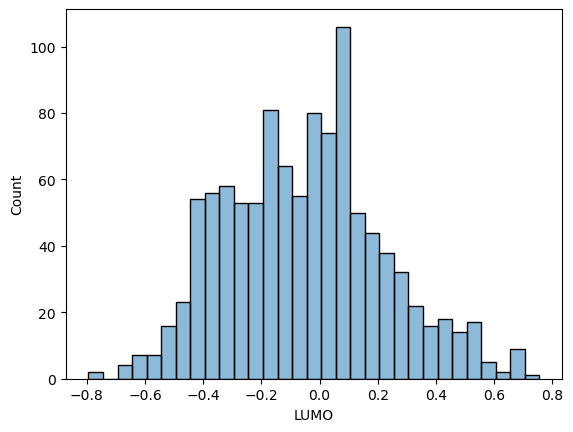

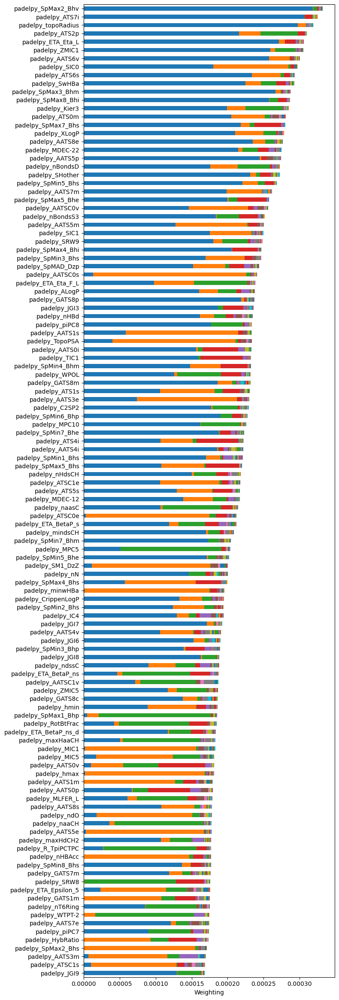

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc30,pc31,pc32,pc33,pc34,pc35,pc36,pc37,pc38,length
padelpy_SpMax2_Bhv,0.128223,-0.005824,0.032874,0.024506,-0.025037,-0.028494,-0.025287,-0.014809,0.032677,0.007954,...,-0.029367,-0.014558,0.006876,0.037665,0.017018,0.013494,-0.043448,-0.001193,-0.047464,0.000332
padelpy_ATS7i,0.125792,0.003954,-0.003194,-0.061488,-0.004794,-0.018415,-0.016780,-0.028400,-0.076706,0.026403,...,-0.048561,0.022979,0.014118,-0.010933,0.020998,-0.012894,-0.023753,-0.017441,0.006945,0.000325
padelpy_topoRadius,0.123951,0.036529,0.016497,-0.008336,-0.044118,0.016030,-0.013346,0.050159,-0.032585,0.033843,...,0.028802,-0.037583,-0.018483,0.042577,0.024235,0.007987,-0.016303,0.040362,0.027820,0.000319
padelpy_ATS2p,0.105615,-0.059478,0.102557,-0.059080,0.002751,-0.029621,0.015976,0.025597,0.029260,-0.015026,...,0.012814,0.009846,-0.008966,0.027747,-0.004135,0.013740,-0.002983,-0.012441,0.025268,0.000310
padelpy_ETA_Eta_L,0.118295,-0.032085,0.001504,-0.073060,-0.047666,-0.030803,0.024440,0.031453,0.050350,-0.034325,...,0.002296,0.034243,-0.015419,0.045684,0.009947,-0.018751,0.004833,-0.018630,0.044889,0.000306
padelpy_ZMIC1,0.115757,0.026884,0.076709,-0.000124,0.042612,0.037315,0.030153,0.056522,-0.011302,0.020548,...,0.001321,0.011274,0.022887,0.026389,0.009028,0.023399,0.037150,0.017212,0.006645,0.000305
padelpy_AATS6v,0.115302,0.058526,-0.011209,0.032824,-0.012425,-0.051411,-0.025570,-0.040079,-0.064103,0.020379,...,0.017771,-0.021001,0.030473,0.016343,0.036798,0.028436,-0.001864,-0.003618,0.012243,0.000300
padelpy_SIC0,-0.096365,0.112172,0.024016,0.043524,-0.003232,-0.022672,0.000185,-0.016126,-0.013102,0.014458,...,0.004426,0.003050,0.002702,-0.026210,0.000762,-0.032457,-0.013728,-0.009954,-0.000684,0.000297
padelpy_ATS6s,0.109894,0.069120,-0.031753,-0.054406,-0.001783,-0.005412,0.000679,-0.057328,-0.036629,-0.019658,...,-0.000778,0.019121,-0.023548,-0.028914,0.059896,0.033312,0.014921,-0.017202,0.024909,0.000294
padelpy_SwHBa,0.107665,-0.050901,0.066054,0.068230,0.057607,-0.041001,0.021038,-0.007051,-0.059144,0.009582,...,0.017229,-0.009646,-0.002127,-0.013526,0.018175,-0.008379,-0.016245,0.009791,-0.012874,0.000293


0 padelpy_SpMax2_Bhv
1 padelpy_ATS7i
2 padelpy_topoRadius
3 padelpy_ATS2p
4 padelpy_ETA_Eta_L
5 padelpy_ZMIC1
6 padelpy_AATS6v
7 padelpy_SIC0
8 padelpy_ATS6s
9 padelpy_SwHBa


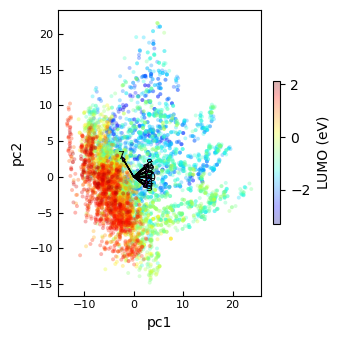

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20', 'pc21', 'pc22', 'pc23', 'pc24', 'pc25', 'pc26', 'pc27', 'pc28', 'pc29', 'pc30', 'pc31', 'pc32', 'pc33', 'pc34', 'pc35', 'pc36', 'pc37', 'pc38']


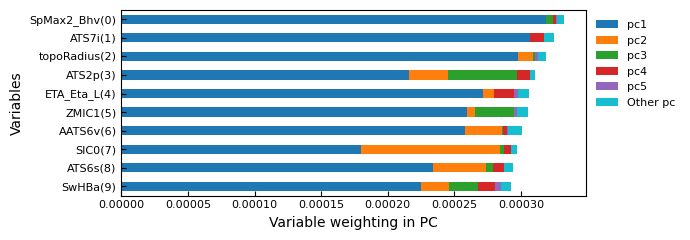

In [36]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_both.columns if 'padelpy_PubchemFP' not in c and ('padelpy_' in c or 'RingCount_' in c) ]  
X_features = df_both[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

#colors = [ 0 if d=='PNL' else 1 for d in df_both['source'] ]
colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=8, explained_var=exp_var, num_feature=10, data_alpha=0.3, #color_map='cool', cbar_label='Type',
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_both_padelpy.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='padelpy_', save_to_file='Figure_PCA_both_padelpy_TopFeatures.png')

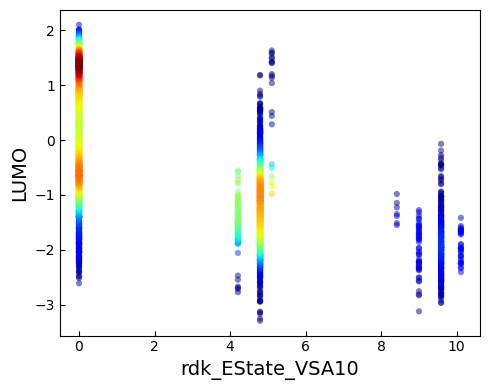

In [37]:
see_correlation(df_both, 'rdk_EState_VSA10', ylabel='LUMO')

## Pattern = With N in diene

In [68]:
df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)

patterns_col = [ c for c in df_diene_all_descriptor.columns if 'SMILES_pattern_' in c ]
pattern_yes = [c for c in patterns_col if c.count('N')>=0 ]
pattern_no = [p for p in patterns_col if p not in pattern_yes]
print( patterns_col,'\n',pattern_yes,'\n',pattern_no )

mask1 = np.any( df_diene_all_descriptor[pattern_yes]==True, axis=1)
mask2 = np.all( df_diene_all_descriptor[pattern_no]==False, axis=1)
mask_keep = np.all([mask1,mask2], axis=0)

df_diene_pattern = df_diene_all_descriptor[mask_keep]

df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)
df_diene_pattern = df_diene_pattern.dropna(axis='columns')
#df_diene_pattern = df_diene_pattern.reset_index(drop=True)

df_diene_pattern = df_diene_pattern[ df_diene_pattern['source'] =='QM9' ].sort_values(by='LUMO',ascending=True)

df_diene_pattern

C:\Users\zhan051\AppData\Local\Temp\ipykernel_14096\2373757323.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)


['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N'] 
 ['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N'] 
 []


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
21370,-8.018993,-4.508813,O=Cc1nc(=O)onn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21284,-8.353685,-4.195890,O=c1oncc(n1)C#N,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21290,-8.155047,-4.168679,O=c1oncnc1C#N,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21191,-9.463881,-4.149632,O=C(C#N)n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21293,-8.353685,-4.021741,O=c1onnc(c1)C#N,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5546,-4.443507,1.991823,COc1ccc(O)[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14784,-4.372759,1.997265,CCOc1cc(N)c[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14486,-4.663914,2.013592,COc1c[nH]c(O)c1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13875,-4.361875,2.013592,CNc1c[nH]c(OC)c1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [69]:
## Keep rings >=5
ring = [ c for c in df_diene_pattern.columns if 'RingCount_' in c ]
mask1 = np.all( [df_diene_pattern['RingCount_3']==0, df_diene_pattern['RingCount_4']==0], axis=0 )
mask2 = np.any( [df_diene_pattern[r]==1 for r in ring ], axis=0 )
mask_keep = np.all( [mask1,mask2],axis=0 )
df_diene_pattern = df_diene_pattern[mask_keep]

## Keep common atoms
good_elements = ['C','H','O','N','S']
mask_element = []   ## molecules to keep, keep=True
for smi in df_diene_pattern['SMILES']:
    mol = Chem.MolFromSmiles( smi )
    element = set([at.GetSymbol() for at in mol.GetAtoms()])  ## GetSymbol , GetAtomicNum
    mask_element.append(all(e in good_elements for e in element))
df_diene_pattern = df_diene_pattern[mask_element]

## Add ring info
#NumRingAtom = np.zeros(len(df_diene_pattern))
NumRingAtom = [ [] for n in range(len(df_diene_pattern)) ]
for r in ring:
    ring_num = int(r.split('_')[-1])
    idx = np.argwhere(df_diene_pattern[r]==1).flatten()
    if len(idx)>0:
        #NumRingAtom[ idx ] = ring_num
        for i in idx:
            NumRingAtom[i].append(ring_num)      
#df_diene_pattern['NumRingAtom'] = NumRingAtom
df_diene_pattern['NumRingAtom'] = [ ''.join([str(j) for j in i]) for i in NumRingAtom]

display( df_diene_pattern )

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,NumRingAtom
21370,-8.018993,-4.508813,O=Cc1nc(=O)onn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
21284,-8.353685,-4.195890,O=c1oncc(n1)C#N,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
21290,-8.155047,-4.168679,O=c1oncnc1C#N,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
21191,-9.463881,-4.149632,O=C(C#N)n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
21293,-8.353685,-4.021741,O=c1onnc(c1)C#N,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5546,-4.443507,1.991823,COc1ccc(O)[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
14784,-4.372759,1.997265,CCOc1cc(N)c[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
14486,-4.663914,2.013592,COc1c[nH]c(O)c1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
13875,-4.361875,2.013592,CNc1c[nH]c(OC)c1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


In [82]:
df_diene_pattern = df_diene_pattern[ [len(d)==1 for d in df_diene_pattern['NumRingAtom']] ]
df_diene_pattern

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,NumRingAtom
21370,-8.018993,-4.508813,O=Cc1nc(=O)onn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
21284,-8.353685,-4.195890,O=c1oncc(n1)C#N,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
21290,-8.155047,-4.168679,O=c1oncnc1C#N,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
21191,-9.463881,-4.149632,O=C(C#N)n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
21293,-8.353685,-4.021741,O=c1onnc(c1)C#N,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5546,-4.443507,1.991823,COc1ccc(O)[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
14784,-4.372759,1.997265,CCOc1cc(N)c[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
14486,-4.663914,2.013592,COc1c[nH]c(O)c1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
13875,-4.361875,2.013592,CNc1c[nH]c(OC)c1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


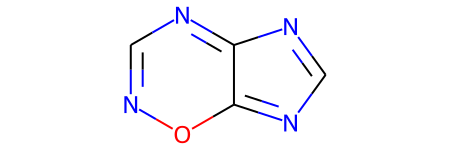

In [81]:
Chem.MolFromSmiles( 'o1ncnc2-c1ncn2' )

In [87]:
df_diene_pattern['NumRingAtom'].value_counts()

NumRingAtom
5    9832
6    2569
7     418
8      47
9      26
Name: count, dtype: int64

In [83]:
df_diene_pattern['diene_types'] = -1

patterns_col = [ c for c in df_diene_pattern.columns if 'SMILES_pattern_' in c ]
groups = [ [c for c in patterns_col if c.count('N')==n] for n in [0,1,2,3,4] ]

for i, pattern_yes in enumerate(groups):
    pattern_no = [p for p in patterns_col if p not in pattern_yes] 
    mask = np.any( df_diene_pattern[pattern_yes]==True, axis=1)
    #mask2 = np.all( df_diene_pattern[pattern_no]==False, axis=1)
    #mask = np.all([mask1,mask2], axis=0)
    ##mask = np.any([ list(df_diene_pattern[p]==True) for p in g], axis=0)
    df_diene_pattern.loc[ mask, ['diene_types'] ]= i

df_diene_pattern['diene_types'].value_counts()


diene_types
1    6120
0    3268
2    3080
3     357
4      67
Name: count, dtype: int64

In [ ]:
df = df_diene_pattern[df_diene_pattern['diene_types']==-1]
Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in df['SMILES']], molsPerRow=5, legends=[str(p) for p in df['LUMO']] )  


In [85]:
df_diene_pattern.to_csv('df_final_qm9_n_diene.csv')

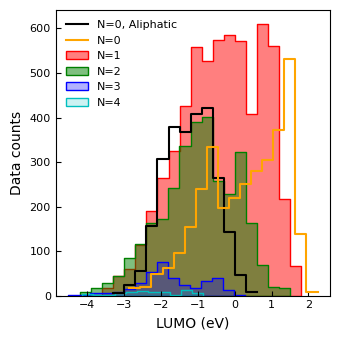

In [103]:
df_pnl = pd.read_csv('df_final_pnl_cccc.csv', index_col=0)
df_n_diene = pd.read_csv('df_final_qm9_n_diene.csv', index_col=0)

colors = ['orange','r','g','b','c']
alphas = [1, 0.5, 0.5, 0.3, 0.2]
fig, axs = plt.subplots( 1,1, figsize=(3.5,3.5), tight_layout=True, )#dpi=100)
sns.histplot( df_pnl, x='LUMO', kde=False, binwidth=0.3, ax=axs, element="step", alpha=1, fill=False, color='k', label=f'N=0, Aliphatic')#, stat='percent')#, multiple="stack", 
for i,n in enumerate([0,1,2,3,4]):
    df = df_n_diene[df_n_diene['diene_types']==n]
    if n==0:
        sns.histplot( df, x='LUMO', kde=False, binwidth=0.3, ax=axs, element="step", alpha=alphas[i], fill=False, color=colors[i], label=f'N={n}')#, stat='percent')#, multiple="stack", 
    else:
        sns.histplot( df, x='LUMO', kde=False, binwidth=0.3, ax=axs, element="step", alpha=alphas[i], fill=True, color=colors[i], label=f'N={n}')#, stat='percent')#, multiple="stack", 

axs.tick_params(direction='in',labelsize=8)
axs.legend(fontsize=8, frameon=False, loc=2)
#axs.set_xlim((-4,2.5))
#handles, labels = axs.get_legend_handles_labels()
#labels = ['Ring>=7','Ring 6','Ring 5','No ring']
#axs.legend([handles[-1]]+handles[:-1], [labels[-1]]+labels[:-1], fontsize=8, frameon=False, loc=2)#, ncol=1, bbox_to_anchor=(1,1.3), handlelength=1, handletextpad=0.2, columnspacing=1)
axs.set_xlabel('LUMO (eV)', fontsize=10)
axs.set_ylabel('Data counts', fontsize=10)

plt.savefig("QM9_Ndiene_Hist.png", dpi=800) 

plt.show()

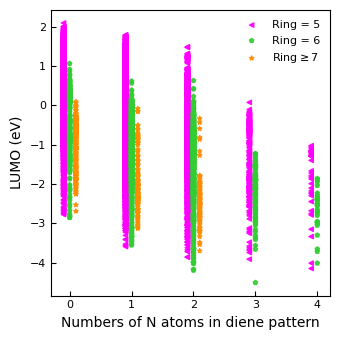

In [105]:
x,y,z = df_n_diene['diene_types'], df_n_diene['LUMO'], df_n_diene['NumRingAtom']
z = np.array([ i if i<=6 else 7 if i<12 else -1 for i in z ])  ## ring=5,6 or >=7, -1 means overlap
x = np.array([ i+(j-6)*0.1 for i,j in zip(x,z) ])  ## differentiate 5,6,7 by x location
y = np.array(y)

colors = ['magenta','limegreen','darkorange'] #,'c','m']  ## correspond to 5,6,7
colors = np.array( [ colors[int(i-5)] if i>0 else 'k' for i in z] )
mk = ['<','p','*']

fig, axs = plt.subplots(1,1, figsize=(3.5,3.5), tight_layout=True)
for i in [5,6,7]:
    if i in [5,6]:
        idx = np.argwhere( z==i ).flatten()
        idx = [ i for i in idx if x[i]>-0.5 ]
        axs.scatter(x[idx], y[idx], marker=mk[i-5], c=colors[idx], cmap='jet', alpha=0.9, s=10, label=f'Ring = {i}') 
    else:
        idx = np.argwhere( z>=i ).flatten()
        idx = [ i for i in idx if x[i]>-0.5 ]
        axs.scatter(x[idx], y[idx], marker=mk[i-5], c=colors[idx], cmap='jet', alpha=0.9, s=10, label=r'Ring$\geq$7') 

axs.tick_params(direction='in',labelsize=8)
axs.set_ylabel('LUMO (eV)', fontsize=10)
axs.set_xlabel('Numbers of N atoms in diene pattern', fontsize=10)
#axs.set_xticks( [0,1] )
axs.legend(fontsize=8, frameon=False, loc=1) #handles[::-1], labels[::-1], fontsize=8, frameon=False, ncol=3, bbox_to_anchor=(1,1.3), handlelength=1, handletextpad=0.2, columnspacing=1)

plt.savefig("QM9_Ndiene_diagram.png", dpi=800) 

plt.show()

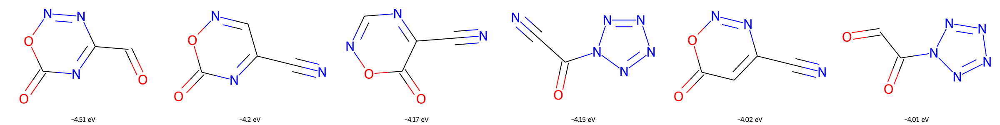

In [129]:
top = df_n_diene.sort_values(by='LUMO',ascending=True).head(6)
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in top['SMILES']], molsPerRow=6, subImgSize=(400, 300), returnPNG=False, legends=[str(round(p,2))+' eV' for p in top['LUMO']], )  
img.save('Ncontaining_lowest_LUMO.png')
display(img)

0

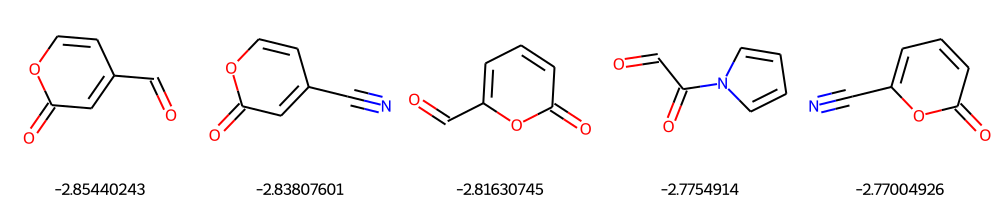

1

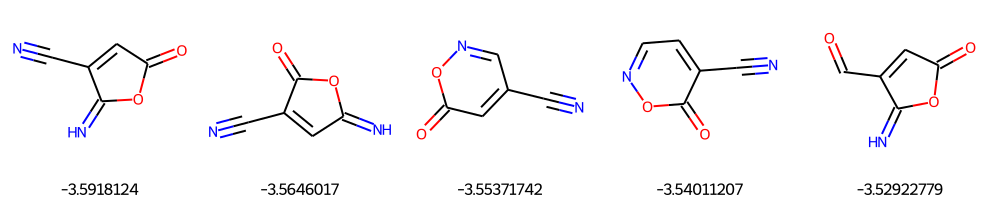

2

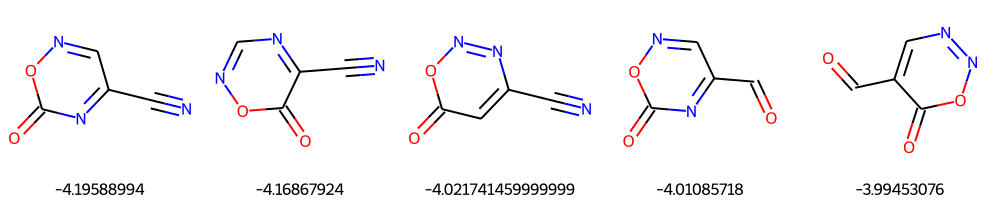

3

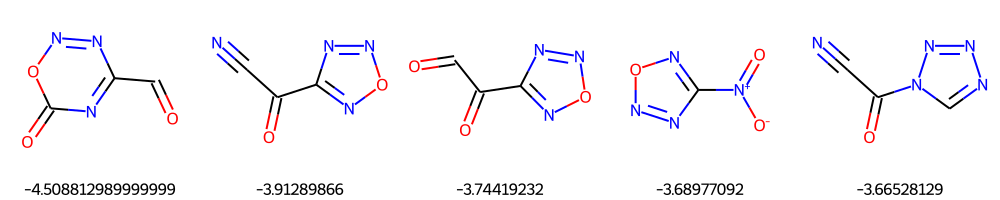

4

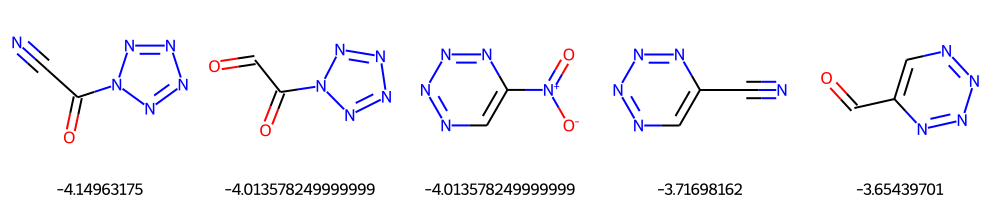

In [357]:
## Draw based on Num N
for n in [0,1,2,3,4]:
    df = df_n_diene[ df_n_diene['diene_types']==n ].sort_values(by='LUMO',ascending=True).head(5)
    img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in df['SMILES']], molsPerRow=5, legends=[str(p) for p in df['LUMO']] )  
    display(n, img)

In [323]:
zines = [
    'C1=CN=NN=C1', # 1,2,3-triazine
    'C1=CN=NC=N1', # 1,2,4-Triazine
    'C1=NC=NC=N1', # 1,3,5-Triazine
    'C1=CN=NN=N1', #1,2,3,4-Tetrazine
    'C1=NN=CN=N1', #1,2,4,5-Tetrazine
]

df_n_diene[ [has_substructure(smi, sub_struct=zines) for smi in df_n_diene['SMILES']] ]


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,NumRingAtom,diene_types


Before clean (9624, 123)
After clean (9624, 114)
Num of keep:  84
Num of drop:  30
---------


,LUMO


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

Total Var  0.8024269973460318  from  20
Exp Var:  [0.15467095 0.09247425 0.06698798 0.05973066 0.05419636 0.04765553
 0.04466705 0.03738315 0.03413556 0.03044031 0.02506189 0.02466045
 0.02112181 0.01837744 0.0165458  0.01646606 0.01513867 0.01493799
 0.01410533 0.01366978]


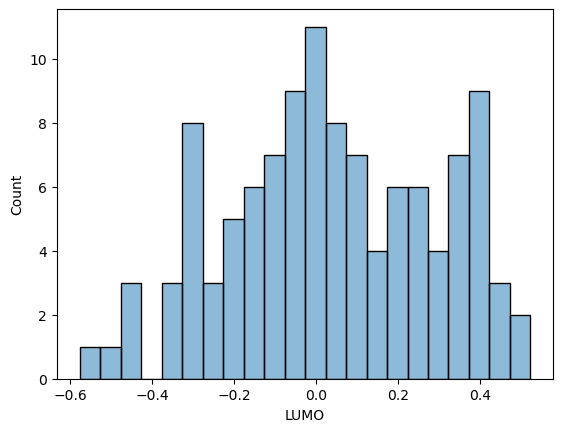

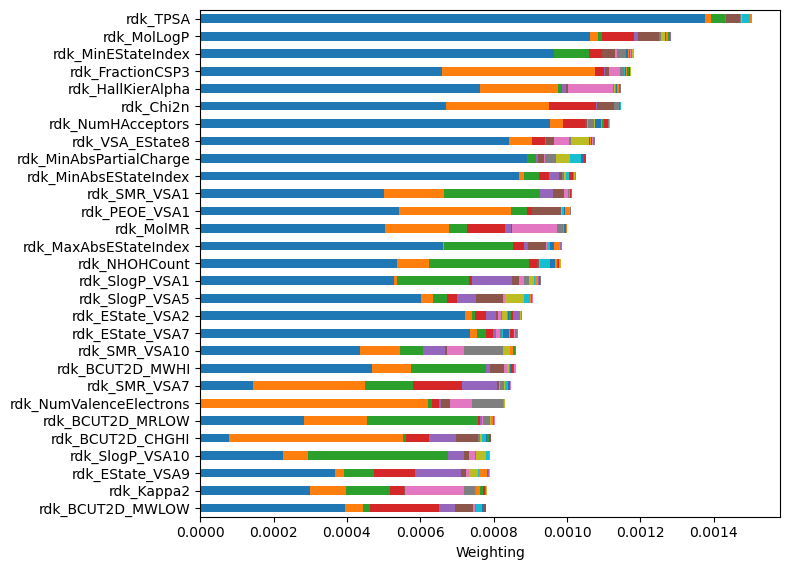

'In plot'

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc12,pc13,pc14,pc15,pc16,pc17,pc18,pc19,pc20,length
rdk_TPSA,-0.239931,-0.040674,0.092164,0.025152,0.009474,0.131558,-0.008863,-0.051860,-0.016301,-0.153279,...,0.087376,0.030735,0.007230,0.012052,0.026403,0.033869,0.020922,0.016770,0.014012,0.001505
rdk_MolLogP,0.210859,-0.047456,-0.053548,-0.155841,0.057800,-0.161950,0.004811,0.052884,-0.099215,-0.001708,...,-0.087890,0.101614,-0.071345,0.064923,-0.028239,-0.067216,0.001088,-0.037777,-0.011404,0.001284
rdk_MinEStateIndex,0.200753,0.004595,0.145927,0.099795,-0.012347,-0.124489,-0.049695,0.132782,0.014673,-0.001659,...,-0.086889,0.049908,0.049032,-0.059005,0.011471,-0.113624,0.070324,0.153999,-0.000594,0.001181
rdk_FractionCSP3,0.165899,-0.220963,-0.013834,0.083702,0.021520,0.066973,0.126543,-0.087869,0.006895,0.026549,...,0.066393,-0.122587,0.066450,-0.002854,-0.012895,-0.010092,-0.086982,-0.031564,-0.019488,0.001173
rdk_HallKierAlpha,0.178385,-0.158229,-0.049310,0.017199,-0.058246,-0.043724,0.248740,0.048044,0.038198,-0.057167,...,0.093665,-0.051828,0.029541,-0.042791,-0.005896,0.027089,-0.087769,-0.067322,0.006725,0.001147
rdk_Chi2n,0.167498,-0.181014,0.007064,-0.188756,-0.033337,0.140517,-0.009099,-0.097737,-0.001040,0.015905,...,-0.028677,-0.052022,0.012305,-0.015418,0.025344,-0.052305,-0.051277,-0.048026,-0.038264,0.001146
rdk_NumHAcceptors,-0.199625,-0.064797,0.003420,0.128029,-0.017833,0.049601,0.044986,-0.107455,-0.040490,0.026872,...,0.077637,-0.088997,0.181041,0.043539,0.043052,-0.054605,0.087563,0.122853,-0.037432,0.001117
rdk_VSA_EState8,0.187480,-0.086318,0.009072,-0.099151,0.028686,0.099086,0.141684,-0.068798,-0.203962,-0.003932,...,-0.058039,0.021277,0.008522,-0.039181,-0.110715,-0.032491,-0.157510,-0.002835,-0.018075,0.001075
rdk_MinAbsPartialCharge,-0.192980,0.008811,-0.074306,-0.007317,-0.032433,-0.087060,0.037775,-0.145372,-0.183611,0.179421,...,-0.040513,-0.025864,-0.074328,-0.051958,-0.067698,0.051787,-0.050288,0.009186,-0.038423,0.001052
rdk_MinAbsEStateIndex,0.190610,0.041373,0.095037,0.084772,-0.098131,-0.054551,0.010744,0.061176,-0.075398,0.087318,...,0.039861,0.021736,-0.141551,0.060389,0.022376,-0.039670,0.100619,0.090796,0.119809,0.001024


0 rdk_TPSA
1 rdk_MolLogP
2 rdk_MinEStateIndex
3 rdk_FractionCSP3
4 rdk_HallKierAlpha
5 rdk_Chi2n
6 rdk_NumHAcceptors
7 rdk_VSA_EState8
8 rdk_MinAbsPartialCharge
9 rdk_MinAbsEStateIndex


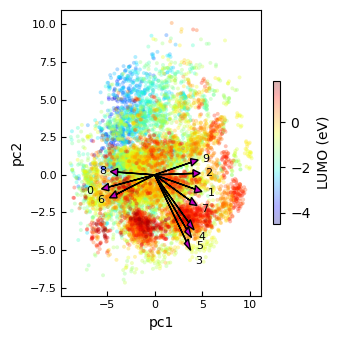

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20']


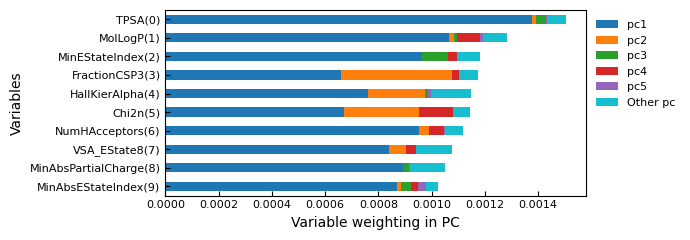

In [124]:
df = df_n_diene[df_n_diene['diene_types']>=1]

## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df.columns if 'rdk_' in c ]#or 'diene_types' in c or 'NumRingAtom' in c ]    
X_features = df[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
mask = highlight.drop('LUMO',axis=0).abs()>0.6
display( highlight.drop('LUMO')[ mask.values ] )
display( sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) ) #color='r', stat='percent',label='LUMO', element="step", 

Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =0.8
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=0.5)

#colors = [ 0 if d=='PNL' else 1 for d in df['source'] ]
colors = X_features_prop_clean['LUMO']
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', 
            size=8, explained_var=exp_var, num_feature=10, data_alpha=0.3, color_map='jet', cbar_label='LUMO (eV)',
            #feature_arrow=True, yrange=[-5,10], save_to_file='Figure_PCA_PNL_pubchem_zoom.png')  #data_alpha=1
            feature_arrow=True, save_to_file='Figure_PCA_AllN_rdk.png')
feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='rdk_', save_to_file='Figure_PCA_AllN_rdk_TopFeatures.png')

['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9', 'pc10', 'pc11', 'pc12', 'pc13', 'pc14', 'pc15', 'pc16', 'pc17', 'pc18', 'pc19', 'pc20']


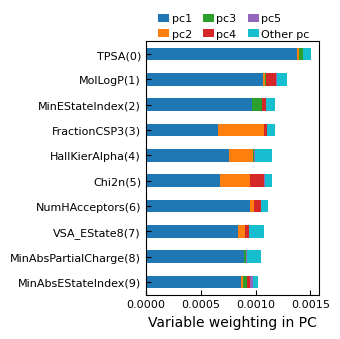

In [125]:
def copy_feature_weight( pca_coef, explained_var, num_variable=10, if_var_considered=False, header=None, save_to_file=None, fig_size=None):
    pc_names = list(pca_coef.drop('length',axis=1).columns)
    print(pc_names)
    
    if if_var_considered:
        weight = (pca_coef[pc_names]*explained_var)**2
        weight['length'] = weight.sum(axis=1)
    weight = weight.sort_values('length',ascending=False)
    weight = weight.head(num_variable)
    if header is not None:
        weight.index = [i.replace(header,'')+f'({n})' for n,i in enumerate(weight.index)]
    #display(weight)
    n_pc_show = 5
    colors = ['tab:cyan' for p in pc_names]
    colors = list(mcolors.TABLEAU_COLORS.keys())[:n_pc_show] + colors[n_pc_show:]
    
    if fig_size is None: fig_size = (7,0.25*num_variable)
    fig, axs = plt.subplots(1,1, figsize=fig_size,tight_layout=True)
    weight.plot(kind='barh', y=pc_names, ax=axs, stacked=True, color=colors)#, colormap='tab10')
    axs.set_xlabel('Variable weighting in PC',fontsize=10) ## input X name
    #axs.set_ylabel('Variables',fontsize=10) ## input Y name
    axs.tick_params(direction='in',labelsize='8')
    axs.invert_yaxis()
    
    handles, labels = axs.get_legend_handles_labels()
    handles,labels = handles[:n_pc_show+1],labels[:n_pc_show+1]
    labels[-1] = 'Other pc'
    axs.legend( handles,labels, fontsize=8, frameon=False, ncol=3, bbox_to_anchor=(1, 1.15), handlelength=1, handletextpad=0.2, columnspacing=1 )
    #axs.get_legend().remove()
    #plt.yticks(rotation=45)

    if save_to_file is not None:
        plt.savefig(save_to_file, dpi=800)    
    plt.show()
copy_feature_weight( df2_pca_coef, exp_var, num_variable=10, if_var_considered=True, header='rdk_', save_to_file='Figure_PCA_AllN_rdk_TopFeatures.png', fig_size=(3.5, 3.5))

## Pattern = 1 N in diene

In [56]:
df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)

patterns_col = [ c for c in df_diene_all_descriptor.columns if 'SMILES_pattern_' in c ]
pattern_yes = [c for c in patterns_col if c.count('N')==1 ]
pattern_no = [p for p in patterns_col if p not in pattern_yes]
print( patterns_col,'\n',pattern_yes,'\n',pattern_no )

mask1 = np.any( df_diene_all_descriptor[pattern_yes]==True, axis=1)
mask2 = np.all( df_diene_all_descriptor[pattern_no]==False, axis=1)
mask_keep = np.all([mask1,mask2], axis=0)

df_diene_pattern = df_diene_all_descriptor[mask_keep]

df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)
df_diene_pattern = df_diene_pattern.dropna(axis='columns')
#df_diene_pattern = df_diene_pattern.reset_index(drop=True)

df_diene_pattern

C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\4252653105.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)


['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N'] 
 ['SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C'] 
 ['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N']


C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\4252653105.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
4564,-6.130571,0.903395,[nH]1ccnc1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4566,-6.827165,0.027211,o1ccnc1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4567,-6.633969,0.650336,[nH]1cccn1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4571,-7.284304,-0.375508,o1cccn1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4581,-6.432609,0.179591,Cc1cnco1,QM9,False,False,True,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23132,-7.918314,-1.202713,FC(F)(F)c1ccno1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23134,-7.344168,0.008163,FC(F)(F)c1c[nH]nc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23136,-7.959130,-0.995912,FC(F)(F)c1conc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23139,-7.251652,-0.106122,FC(F)(F)c1n[nH]cc1,QM9,False,True,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
df_diene_pattern['diene_types'] = -1

for i,p in enumerate(pattern_yes):
    mask = list(df_diene_pattern[p]==True)
    #df_diene_pattern[mask,['diene_types']] = i
    df_diene_pattern.loc[ mask, ['diene_types'] ]=i
    
df_diene_pattern['diene_types']

4564     1
4566     1
4567     0
4571     0
4581     1
        ..
23132    0
23134    0
23136    0
23139    0
23142    0
Name: diene_types, Length: 7712, dtype: int64

<AxesSubplot:xlabel='LUMO', ylabel='Count'>

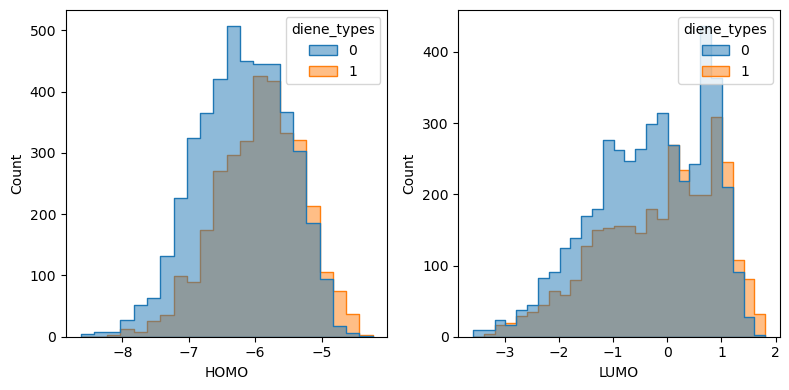

In [67]:
fig, axs = plt.subplots(1,2,figsize=(8,4),tight_layout=True,dpi=100)

sns.histplot(df_diene_pattern, x='HOMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='HOMO',  
sns.histplot(df_diene_pattern, x='LUMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[1], element="step", alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO',  
#axs[0].legend(loc=2)
#axs[1].legend(loc=2)

Before clean (7712, 132)
After clean (7712, 122)
Num of keep:  93
Num of drop:  29
---------


,LUMO
rdk_EState_VSA10,-0.653992


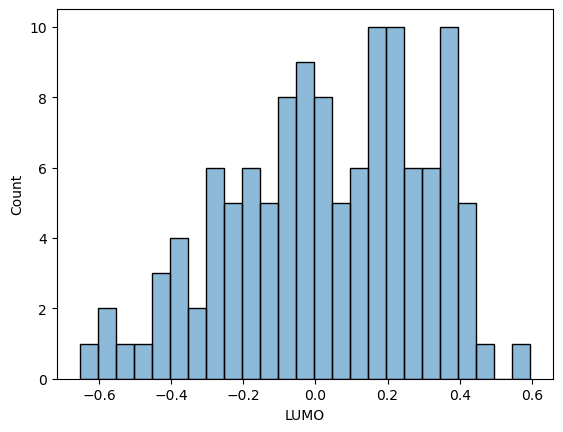

In [70]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'RingCount_' in c]    
X_features = df_diene_pattern[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
X_features_prop_clean

sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO', element="step",

mask = highlight.drop('LUMO',axis=0).abs()>0.6
highlight.drop('LUMO')[ mask.values ]

Total Var  0.2359836413293756  from  2
Exp Var:  [0.1556846  0.08029904]
                               pc1           pc2         Total
RingCount_8           6.426271e-09  3.631531e-07  3.695793e-07
RingCount_9           1.144489e-07  2.002489e-06  2.116938e-06
rdk_SlogP_VSA8        2.146522e-07  2.162278e-06  2.376930e-06
rdk_SMR_VSA4          4.871217e-06  2.568226e-06  7.439443e-06
rdk_PEOE_VSA10        7.948589e-06  6.651546e-06  1.460013e-05
...                            ...           ...           ...
rdk_MaxPartialCharge  9.307680e-04  1.827112e-06  9.325951e-04
rdk_NumHAcceptors     8.018786e-04  1.354452e-04  9.373238e-04
rdk_Chi3n             9.805210e-04  9.148267e-05  1.072004e-03
rdk_FractionCSP3      9.832239e-04  1.001205e-04  1.083344e-03
rdk_NumHeteroatoms    1.179993e-03  1.009143e-04  1.280908e-03

[92 rows x 3 columns]


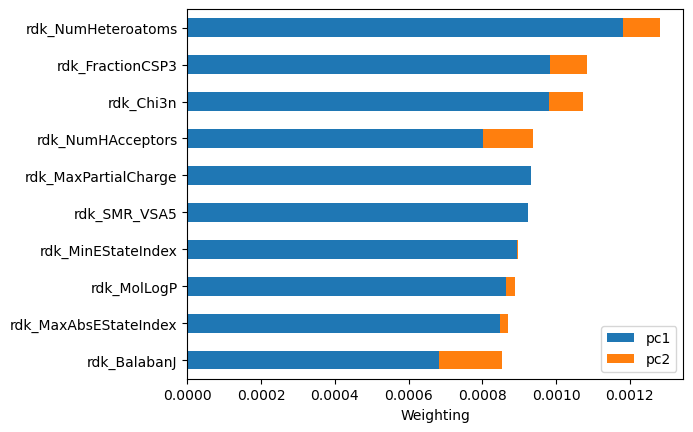

'In plot'

,pc1,pc2,length
rdk_NumHeteroatoms,-0.220645,-0.125103,0.001281
rdk_FractionCSP3,0.201410,-0.124609,0.001083
rdk_Chi3n,0.201133,-0.119113,0.001072
rdk_NumHAcceptors,-0.181890,-0.144934,0.000937
rdk_MaxPartialCharge,-0.195963,0.016833,0.000933
rdk_SMR_VSA5,0.195313,-0.004886,0.000925
rdk_MinEStateIndex,0.192051,-0.021156,0.000897
rdk_MolLogP,0.188766,0.062852,0.000889
rdk_MaxAbsEStateIndex,-0.186955,0.057354,0.000868
rdk_BalabanJ,-0.167839,0.163038,0.000854


0 rdk_NumHeteroatoms
1 rdk_FractionCSP3
2 rdk_Chi3n
3 rdk_NumHAcceptors
4 rdk_MaxPartialCharge
5 rdk_SMR_VSA5
6 rdk_MinEStateIndex
7 rdk_MolLogP
8 rdk_MaxAbsEStateIndex
9 rdk_BalabanJ


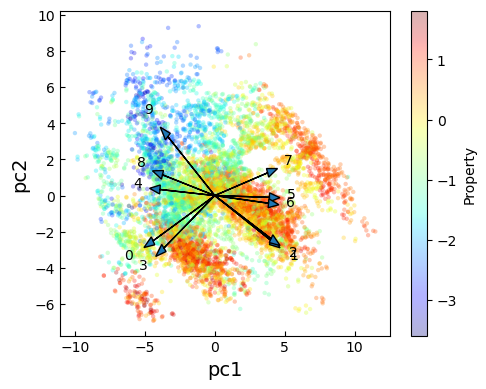

In [71]:
Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =2
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=10)

#colors = X_prop['RingCount_5'] 
colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', feature_arrow=True, num_feature=10, size=10, explained_var=exp_var )# yrange=[-5,10] )


## Pattern = 2 N in diene

In [72]:
df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)

patterns_col = [ c for c in df_diene_all_descriptor.columns if 'SMILES_pattern_' in c ]
pattern_yes = [c for c in patterns_col if c.count('N')==2 ]
pattern_no = [p for p in patterns_col if p not in pattern_yes]
print( patterns_col,'\n',pattern_yes,'\n',pattern_no )

mask1 = np.any( df_diene_all_descriptor[pattern_yes]==True, axis=1)
mask2 = np.all( df_diene_all_descriptor[pattern_no]==False, axis=1)
mask_keep = np.all([mask1,mask2], axis=0)

df_diene_pattern = df_diene_all_descriptor[mask_keep]

df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)
df_diene_pattern = df_diene_pattern.dropna(axis='columns')
#df_diene_pattern = df_diene_pattern.reset_index(drop=True)

df_diene_pattern['diene_types'] = -1
for i,p in enumerate(pattern_yes):
    mask = list(df_diene_pattern[p]==True)
    df_diene_pattern.loc[ mask, ['diene_types'] ]=i

df_diene_pattern

C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\2562239946.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)


['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N'] 
 ['SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C'] 
 ['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N']


C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\2562239946.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4568,-7.186346,-0.062585,[nH]1ccnn1,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4569,-6.941450,0.446255,[nH]1cnnc1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4570,-7.461174,-0.149659,[nH]1nccn1,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4572,-7.787702,-1.197271,o1ccnn1,QM9,False,False,False,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4573,-8.310148,-0.911558,o1cncn1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23138,-8.821709,-1.676179,FC(F)(F)c1ncno1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
23140,-7.989062,-0.465303,FC(F)(F)c1n[nH]cn1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
23141,-8.114231,-0.859858,FC(F)(F)c1n[nH]nc1,QM9,False,False,False,False,False,True,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
23143,-8.889736,-1.504752,FC(F)(F)c1nocn1,QM9,False,False,False,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

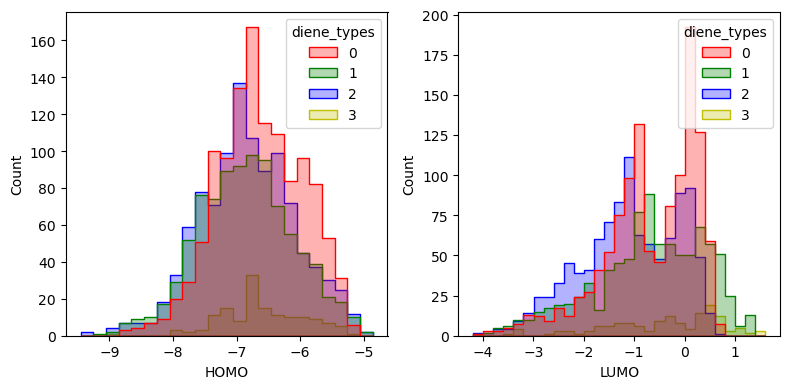

In [79]:
fig, axs = plt.subplots(1,2,figsize=(8,4),tight_layout=True,dpi=100)
sns.histplot(df_diene_pattern, x='HOMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.3, fill=True, palette=['r','g','b','y']) #color='r', stat='percent',label='HOMO',  
sns.histplot(df_diene_pattern, x='LUMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[1], element="step", alpha=0.3, fill=True, palette=['r','g','b','y']) #color='r', stat='percent',label='LUMO',  

Before clean (3291, 132)
After clean (3291, 120)
Num of keep:  87
Num of drop:  33
---------


,LUMO
rdk_EState_VSA10,-0.626937


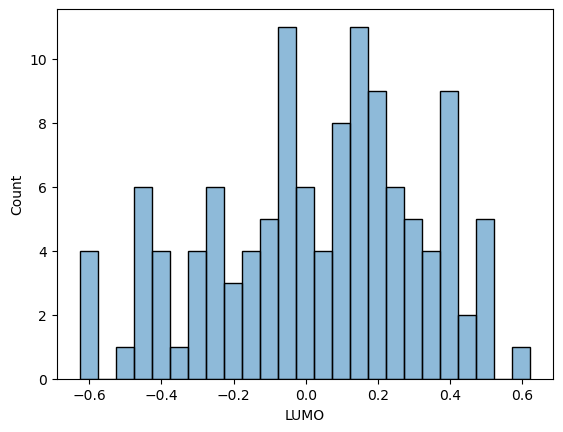

In [74]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'RingCount_' in c]    
X_features = df_diene_pattern[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
X_features_prop_clean

sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO', element="step",

mask = highlight.drop('LUMO',axis=0).abs()>0.6
highlight.drop('LUMO')[ mask.values ]

Total Var  0.24514481312545705  from  2
Exp Var:  [0.16373914 0.08140567]
                                  pc1           pc2     Total
rdk_SlogP_VSA8           7.667587e-07  7.711624e-06  0.000008
rdk_PEOE_VSA10           1.617680e-05  1.976527e-07  0.000016
rdk_SMR_VSA4             8.412824e-06  8.327026e-06  0.000017
rdk_PEOE_VSA5            1.658135e-05  6.509772e-06  0.000023
rdk_VSA_EState9          7.420761e-07  2.447410e-05  0.000025
...                               ...           ...       ...
rdk_MinAbsPartialCharge  1.073704e-03  9.938186e-09  0.001074
rdk_SMR_VSA5             1.078372e-03  3.005009e-09  0.001078
rdk_Chi2n                1.112495e-03  8.637312e-05  0.001199
rdk_FractionCSP3         1.106630e-03  1.252246e-04  0.001232
rdk_TPSA                 1.229867e-03  9.817205e-05  0.001328

[86 rows x 3 columns]


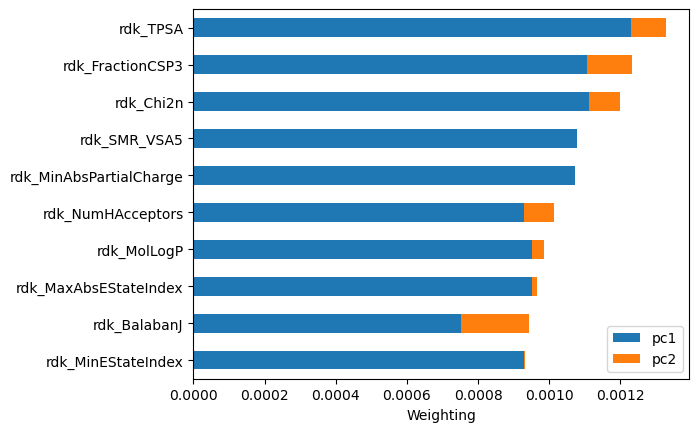

'In plot'

,pc1,pc2,length
rdk_TPSA,0.214179,-0.121714,0.001328
rdk_FractionCSP3,-0.203165,-0.137464,0.001232
rdk_Chi2n,-0.203703,-0.114165,0.001199
rdk_SMR_VSA5,-0.200554,0.000673,0.001078
rdk_MinAbsPartialCharge,0.200120,-0.001225,0.001074
rdk_NumHAcceptors,0.186104,-0.112588,0.001013
rdk_MolLogP,-0.188293,0.071413,0.000984
rdk_MaxAbsEStateIndex,0.188294,0.045742,0.000964
rdk_BalabanJ,0.167454,0.170421,0.000944
rdk_MinEStateIndex,-0.186050,-0.026575,0.000933


0 rdk_TPSA
1 rdk_FractionCSP3
2 rdk_Chi2n
3 rdk_SMR_VSA5
4 rdk_MinAbsPartialCharge
5 rdk_NumHAcceptors
6 rdk_MolLogP
7 rdk_MaxAbsEStateIndex
8 rdk_BalabanJ
9 rdk_MinEStateIndex


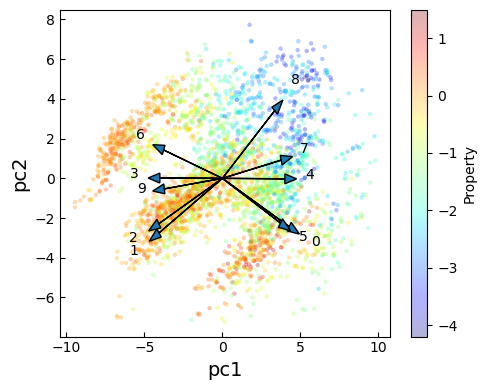

In [75]:
Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =2
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=10)

#colors = X_prop['RingCount_5'] 
colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', feature_arrow=True, num_feature=10, size=10, explained_var=exp_var )# yrange=[-5,10] )


## pattern = 3 N in diene

In [81]:
df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)

patterns_col = [ c for c in df_diene_all_descriptor.columns if 'SMILES_pattern_' in c ]
pattern_yes = [c for c in patterns_col if c.count('N')==3 ]
pattern_no = [p for p in patterns_col if p not in pattern_yes]
print( patterns_col,'\n',pattern_yes,'\n',pattern_no )

mask1 = np.any( df_diene_all_descriptor[pattern_yes]==True, axis=1)
mask2 = np.all( df_diene_all_descriptor[pattern_no]==False, axis=1)
mask_keep = np.all([mask1,mask2], axis=0)

df_diene_pattern = df_diene_all_descriptor[mask_keep]

df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)
df_diene_pattern = df_diene_pattern.dropna(axis='columns')
#df_diene_pattern = df_diene_pattern.reset_index(drop=True)

df_diene_pattern['diene_types'] = -1
for i,p in enumerate(pattern_yes):
    mask = list(df_diene_pattern[p]==True)
    df_diene_pattern.loc[ mask, ['diene_types'] ]=i

df_diene_pattern

C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\1659063016.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)


['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N'] 
 ['SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N'] 
 ['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=N']


C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\1659063016.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4575,-9.006742,-1.749648,o1cnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4577,-9.194496,-2.217672,o1ncnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4621,-7.842124,-0.658499,Cc1n[nH]nn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4625,-8.701982,-1.899307,Cc1nonn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4629,-7.692465,-0.405439,Cn1cnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22080,-7.692465,-0.435371,OCCCn1cnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
22082,-7.624438,-0.606799,OCCCn1ncnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
22102,-5.967307,-0.361902,OCCNc1n[nH]nn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
22106,-6.666621,-1.447609,OCCNc1nonn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

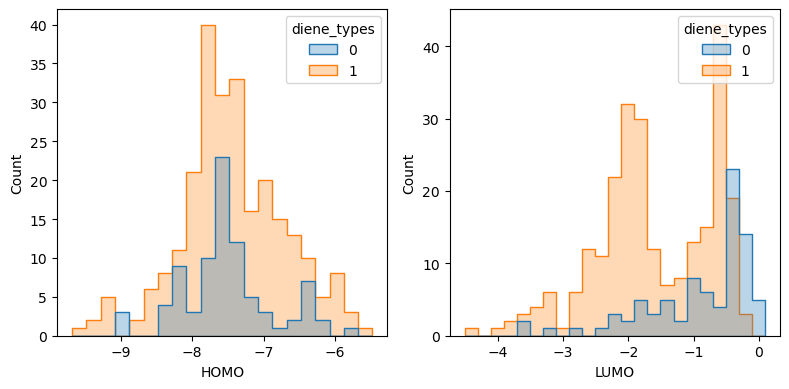

In [82]:
fig, axs = plt.subplots(1,2,figsize=(8,4),tight_layout=True,dpi=100)
sns.histplot(df_diene_pattern, x='HOMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.3, fill=True, ) #color='r', stat='percent',label='HOMO',  
sns.histplot(df_diene_pattern, x='LUMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[1], element="step", alpha=0.3, fill=True, ) #color='r', stat='percent',label='LUMO',  

Before clean (336, 132)
After clean (336, 119)
Num of keep:  82
Num of drop:  37
---------


,LUMO
rdk_BCUT2D_MWHI,-0.647495
rdk_SMR_VSA1,-0.659130
rdk_EState_VSA10,-0.606261


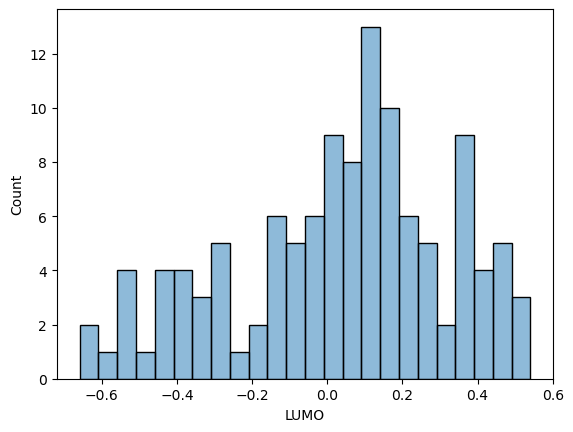

In [83]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'RingCount_' in c]    
X_features = df_diene_pattern[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
X_features_prop_clean

sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO', element="step",

mask = highlight.drop('LUMO',axis=0).abs()>0.6
highlight.drop('LUMO')[ mask.values ]

Total Var  0.2571821220211243  from  2
Exp Var:  [0.16787463 0.0893075 ]
                               pc1           pc2         Total
rdk_VSA_EState9       8.552883e-08  8.516580e-07  9.371868e-07
rdk_PEOE_VSA10        2.334372e-06  2.311240e-06  4.645612e-06
rdk_SMR_VSA7          3.333333e-07  6.321039e-06  6.654372e-06
rdk_SMR_VSA4          1.558401e-05  2.019978e-06  1.760398e-05
rdk_VSA_EState6       1.947853e-05  9.770553e-06  2.924909e-05
...                            ...           ...           ...
rdk_MaxPartialCharge  1.095089e-03  1.510107e-05  1.110190e-03
rdk_MaxEStateIndex    1.057387e-03  9.375672e-05  1.151144e-03
rdk_MolLogP           1.227716e-03  1.544005e-06  1.229260e-03
rdk_FractionCSP3      1.184916e-03  3.230060e-04  1.507922e-03
rdk_NumHeteroatoms    1.511363e-03  1.737608e-05  1.528739e-03

[81 rows x 3 columns]


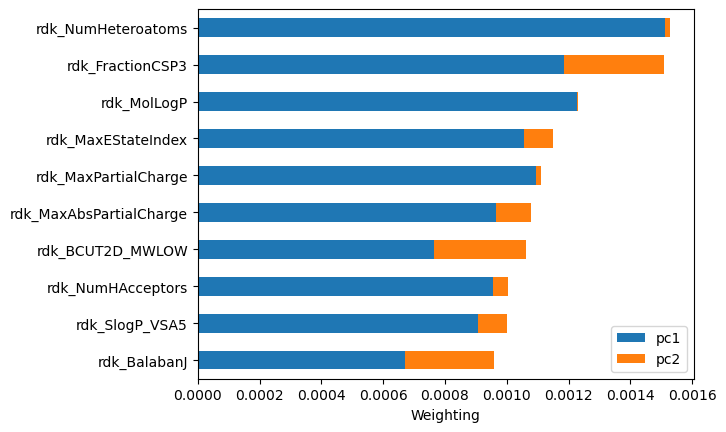

'In plot'

,pc1,pc2,length
rdk_NumHeteroatoms,-0.231579,-0.046675,0.001529
rdk_FractionCSP3,0.205050,-0.201241,0.001508
rdk_MolLogP,0.208720,-0.013914,0.001229
rdk_MaxEStateIndex,-0.193701,-0.108421,0.001151
rdk_MaxPartialCharge,-0.197124,0.043513,0.001110
rdk_MaxAbsPartialCharge,-0.184930,-0.119542,0.001078
rdk_BCUT2D_MWLOW,-0.164894,0.192218,0.001061
rdk_NumHAcceptors,-0.184095,-0.077534,0.001003
rdk_SlogP_VSA5,0.179329,-0.109424,0.001002
rdk_BalabanJ,-0.154342,0.190106,0.000960


0 rdk_NumHeteroatoms
1 rdk_FractionCSP3
2 rdk_MolLogP
3 rdk_MaxEStateIndex
4 rdk_MaxPartialCharge
5 rdk_MaxAbsPartialCharge
6 rdk_BCUT2D_MWLOW
7 rdk_NumHAcceptors
8 rdk_SlogP_VSA5
9 rdk_BalabanJ


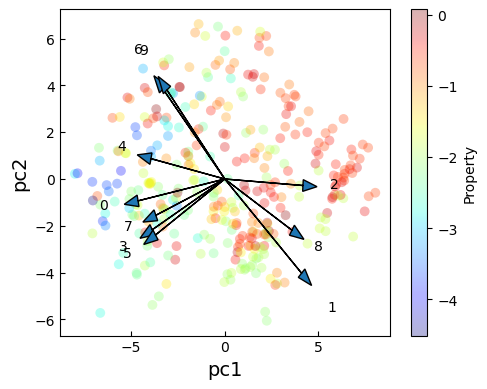

In [85]:
Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =2
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=10)

#colors = X_prop['RingCount_5'] 
colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', feature_arrow=True, num_feature=10, size=50, explained_var=exp_var )# yrange=[-5,10] )


## pattern 4 N in diene

In [86]:
df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)

patterns_col = [ c for c in df_diene_all_descriptor.columns if 'SMILES_pattern_' in c ]
pattern_yes = [c for c in patterns_col if c.count('N')==4 ]
pattern_no = [p for p in patterns_col if p not in pattern_yes]
print( patterns_col,'\n',pattern_yes,'\n',pattern_no )

mask1 = np.any( df_diene_all_descriptor[pattern_yes]==True, axis=1)
mask2 = np.all( df_diene_all_descriptor[pattern_no]==False, axis=1)
mask_keep = np.all([mask1,mask2], axis=0)

df_diene_pattern = df_diene_all_descriptor[mask_keep]

df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)
df_diene_pattern = df_diene_pattern.dropna(axis='columns')
#df_diene_pattern = df_diene_pattern.reset_index(drop=True)

df_diene_pattern['diene_types'] = -1
for i,p in enumerate(pattern_yes):
    mask = list(df_diene_pattern[p]==True)
    df_diene_pattern.loc[ mask, ['diene_types'] ]=i

df_diene_pattern

C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\3418258038.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_diene_all_descriptor = pd.read_csv('df_diene_all_descriptor.csv', index_col=0)


['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N', 'SMILES_pattern_N=NN=N'] 
 ['SMILES_pattern_N=NN=N'] 
 ['SMILES_pattern_C=CC=C', 'SMILES_pattern_N=CC=C', 'SMILES_pattern_C=NC=C', 'SMILES_pattern_N=NC=C', 'SMILES_pattern_N=CN=C', 'SMILES_pattern_N=CC=N', 'SMILES_pattern_C=NN=C', 'SMILES_pattern_N=NN=C', 'SMILES_pattern_N=NC=N']


C:\Users\zhan051\AppData\Local\Temp\ipykernel_15692\3418258038.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diene_pattern.replace([np.inf, -np.inf], np.nan, inplace=True)


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,diene_types
4632,-8.701982,-1.289787,Cn1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4957,-8.623071,-1.194550,CCn1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
5083,-8.859804,-3.150999,O=Cn1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6476,-8.269332,-1.219039,C1CC1n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6622,-8.541439,-2.753723,CC(=O)n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6646,-8.533276,-1.088428,CC(C)n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6914,-8.593139,-1.161897,CCCn1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7221,-9.235312,-1.989102,N#CCn1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7300,-7.545527,-2.225835,NC(=N)n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7320,-8.565928,-2.296583,NC(=O)n1nnnn1,QM9,False,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


<AxesSubplot:xlabel='LUMO', ylabel='Count'>

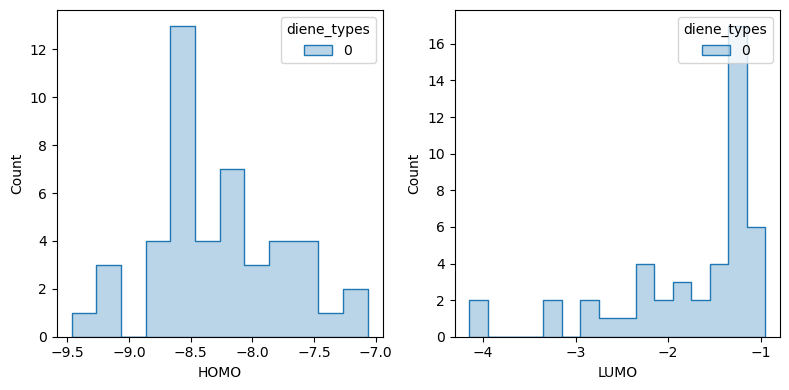

In [87]:
fig, axs = plt.subplots(1,2,figsize=(8,4),tight_layout=True,dpi=100)
sns.histplot(df_diene_pattern, x='HOMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[0], element="step", alpha=0.3, fill=True, ) #color='r', stat='percent',label='HOMO',  
sns.histplot(df_diene_pattern, x='LUMO', hue='diene_types', kde=False, binwidth=0.2, ax=axs[1], element="step", alpha=0.3, fill=True, ) #color='r', stat='percent',label='LUMO',  

Before clean (46, 132)
After clean (46, 111)
Num of keep:  67
Num of drop:  44
---------


,LUMO
rdk_MaxEStateIndex,-0.657021
rdk_MinEStateIndex,0.632355
rdk_MaxAbsEStateIndex,-0.657021
rdk_qed,0.692462
rdk_MaxPartialCharge,-0.826396
rdk_MinAbsPartialCharge,-0.755703
rdk_BCUT2D_MRHI,-0.768223
rdk_Chi1n,0.620694
rdk_Chi1v,0.620694
rdk_HallKierAlpha,0.757700


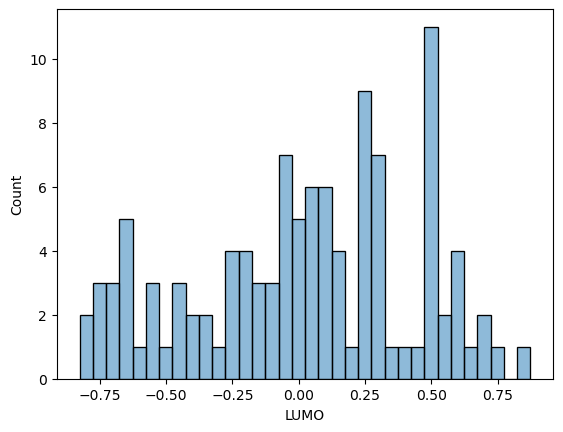

In [88]:
## x = 'SMILES_pattern_' , 'rdk_' , 'padelpy_' (padelpy_PubchemFP or not) , 'RingCount_' : if 'rdk_' in c or 'padelpy_' in c or 'RingCount_' in c
feature_col = ['LUMO'] + [c for c in df_diene_pattern.columns if 'rdk_' in c or 'RingCount_' in c]    
X_features = df_diene_pattern[feature_col]

X_features = clean_std(X_features)
X_features_prop_clean, highlight= remove_high_corr_gradually(X_features, cutoff=0.8, highlight=['LUMO'])
X_features_prop_clean

sns.histplot(highlight.drop('LUMO'), x='LUMO', kde=False, binwidth=0.05, alpha=0.5, fill=True) #color='r', stat='percent',label='LUMO', element="step",

mask = highlight.drop('LUMO',axis=0).abs()>0.6
highlight.drop('LUMO')[ mask.values ]

Total Var  0.3211542214064937  from  2
Exp Var:  [0.21514695 0.10600727]
                              pc1       pc2     Total
rdk_EState_VSA6          0.000046  0.000001  0.000048
rdk_PEOE_VSA4            0.000062  0.000051  0.000113
rdk_SlogP_VSA4           0.000005  0.000119  0.000124
rdk_PEOE_VSA6            0.000008  0.000124  0.000132
rdk_PEOE_VSA11           0.000096  0.000043  0.000139
...                           ...       ...       ...
rdk_HallKierAlpha        0.002049  0.000075  0.002123
rdk_MaxAbsEStateIndex    0.002150  0.000010  0.002160
rdk_MolLogP              0.002377  0.000043  0.002419
rdk_MinAbsPartialCharge  0.002440  0.000009  0.002449
rdk_NumHAcceptors        0.002376  0.000161  0.002537

[66 rows x 3 columns]


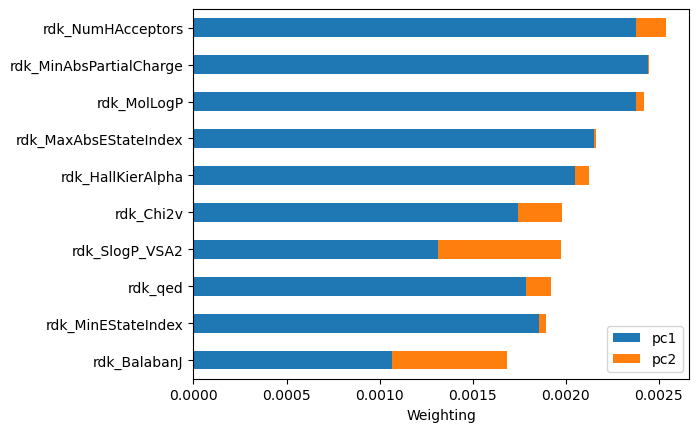

'In plot'

,pc1,pc2,length
rdk_NumHAcceptors,0.226549,-0.119851,0.002537
rdk_MinAbsPartialCharge,0.229614,0.027901,0.002449
rdk_MolLogP,-0.226598,0.061619,0.002419
rdk_MaxAbsEStateIndex,0.215523,-0.029088,0.002160
rdk_HallKierAlpha,-0.210379,-0.081553,0.002123
rdk_Chi2v,-0.194102,-0.143985,0.001977
rdk_SlogP_VSA2,0.168585,-0.242128,0.001974
rdk_qed,-0.196563,-0.108620,0.001921
rdk_MinEStateIndex,-0.200290,0.055322,0.001891
rdk_BalabanJ,0.151959,0.234268,0.001686


0 rdk_NumHAcceptors
1 rdk_MinAbsPartialCharge
2 rdk_MolLogP
3 rdk_MaxAbsEStateIndex
4 rdk_HallKierAlpha
5 rdk_Chi2v
6 rdk_SlogP_VSA2
7 rdk_qed
8 rdk_MinEStateIndex
9 rdk_BalabanJ


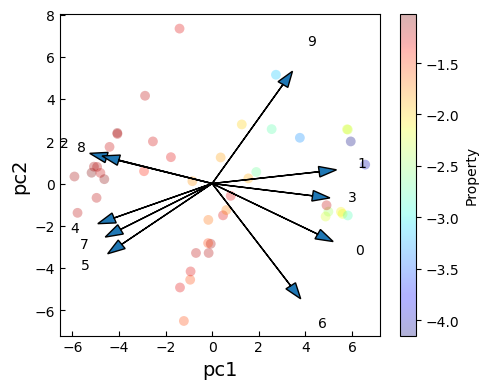

In [89]:
Y_prop = X_features_prop_clean['LUMO']
X_prop = X_features_prop_clean.drop('LUMO',axis=1)

n_pca =2
df2_pca, df2_pca_coef, exp_var = perform_pca_n(X_prop, n_pca, if_plot=True, top_features=10)

#colors = X_prop['RingCount_5'] 
colors = Y_prop
plot_pca_2d(df2_pca, df2_pca_coef, colors, xname='pc1', yname='pc2', feature_arrow=True, num_feature=10, size=50, explained_var=exp_var )# yrange=[-5,10] )


# All dienes

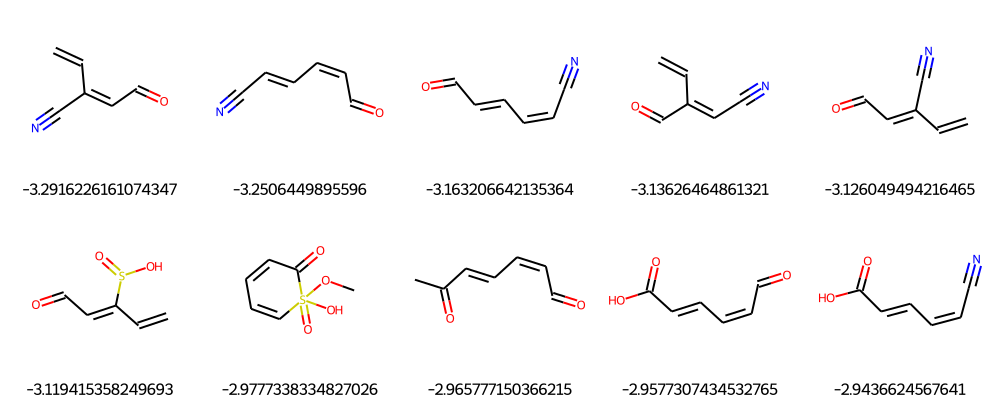

In [101]:
df = df_pnl.sort_values(by='LUMO',ascending=True).head(10)
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in df['SMILES']], molsPerRow=5, legends=[str(p) for p in df['LUMO']] ) 
img

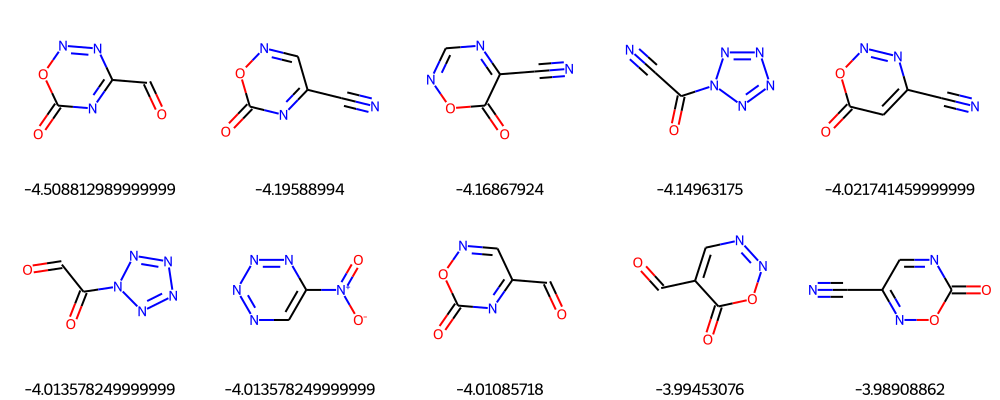

In [102]:
df = df_qm9.sort_values(by='LUMO',ascending=True).head(10)
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in df['SMILES']], molsPerRow=5, legends=[str(p) for p in df['LUMO']] ) 
img

# Additiona analysis

In [21]:
def locate_func( smi, pattern='C=CC=C', pattern_ngb=[1,2,2,1] ):
    """
    return a dict: key=location, value=functionl groups
    """
    pattern = Chem.MolFromSmiles(pattern)
    mol = Chem.MolFromSmiles(smi)
    #display(mol)
    #display( mol_with_atom_index(mol) )
    atoms_in_diene = mol.GetSubstructMatches(pattern)[0]
    bonds = [ mol.GetAtomWithIdx(at).GetBonds() for at in atoms_in_diene ]
    output = {}
    dummy_atom = Chem.Atom(82)
    for ii,(at,bond,patt) in enumerate(zip(atoms_in_diene,bonds,pattern_ngb)):
        if len(bond)>patt: ## There is a func here
            func_bond = [b for b in bond if b.GetBeginAtom().GetIdx() not in atoms_in_diene or b.GetEndAtom().GetIdx() not in atoms_in_diene]
            func_bond = [ b.GetIdx() for b in func_bond]
            mol_fragments = Chem.FragmentOnBonds( mol, func_bond , addDummies=True , dummyLabels=[(0,0) for b in func_bond] )
            mol_fragments = Chem.RWMol(mol_fragments)            
            mol_fragments.ReplaceAtom(at, dummy_atom)
            mol_fragments = Chem.GetMolFrags(mol_fragments, asMols=True)
            mol_fragments = [ fragment for fragment in mol_fragments if not any(a.GetSymbol()=='Pb' for a in fragment.GetAtoms()) ]

            mol_fragments = [ Chem.MolToSmiles(m, canonical=True, isomericSmiles=True) for m in mol_fragments]
            output[ii] = mol_fragments
    return output

In [118]:
## Padel also provides pubchem
from padelpy import from_smiles

descriptors = from_smiles( 'FC(F)(F)c1cocc1', fingerprints=True)
col_names = list(descriptors.keys())


In [14]:
display(df_pnl,df_qm9)

,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP871,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880
257,-7.844547,-3.291623,C=C/C(C#N)=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1375,-7.729353,-3.250645,N#C/C=C/C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4352,-7.672307,-3.163207,N#C/C=C\C=C\C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2759,-7.781885,-3.136265,C=C/C(C=O)=C\C#N,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1759,-7.776203,-3.126049,C=C/C(C#N)=C/C=O,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2510,-7.466715,0.379902,C/C=C/C=C/C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2299,-6.947992,0.392159,CO/C=C/C=C/OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1309,-6.630128,0.397719,CO/C=C\C=C\OC,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
813,-5.451796,0.404868,C=C(/C=C\C)N(C)C,PNL,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,HOMO,LUMO,SMILES,source,SMILES_pattern_C=CC=C,SMILES_pattern_N=CC=C,SMILES_pattern_C=NC=C,SMILES_pattern_N=NC=C,SMILES_pattern_N=CN=C,SMILES_pattern_N=CC=N,...,padelpy_PubchemFP872,padelpy_PubchemFP873,padelpy_PubchemFP874,padelpy_PubchemFP875,padelpy_PubchemFP876,padelpy_PubchemFP877,padelpy_PubchemFP878,padelpy_PubchemFP879,padelpy_PubchemFP880,NumRingAtom
9077,-6.930565,-2.854402,O=Cc1cc(=O)occ1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
8920,-7.189067,-2.838076,O=c1occc(c1)C#N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
9117,-7.009476,-2.816307,O=Cc1cccc(=O)o1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
9048,-6.329209,-2.775491,O=CC(=O)n1cccc1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
8804,-7.167298,-2.770049,O=c1oc(ccc1)C#N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5546,-4.443507,1.991823,COc1ccc(O)[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
14784,-4.372759,1.997265,CCOc1cc(N)c[nH]1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
13875,-4.361875,2.013592,CNc1c[nH]c(OC)c1,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
14486,-4.663914,2.013592,COc1c[nH]c(O)c1N,QM9,True,False,False,False,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0


In [22]:
for s in df_pnl.head(9)['SMILES']:
    print( locate_func(s) )

{2: ['*C#N'], 3: ['*C=O']}
{0: ['*C#N'], 3: ['*C=O']}
{0: ['*C#N'], 3: ['*C=O']}
{2: ['*C=O'], 3: ['*C#N']}
{2: ['*C#N'], 3: ['*C=O']}
{2: ['*S(=O)O'], 3: ['*C=O']}
{0: ['*C(C)=O'], 3: ['*C=O']}
{0: ['*C=O'], 3: ['*C(=O)O']}
{0: ['*C#N'], 3: ['*C(=O)O']}


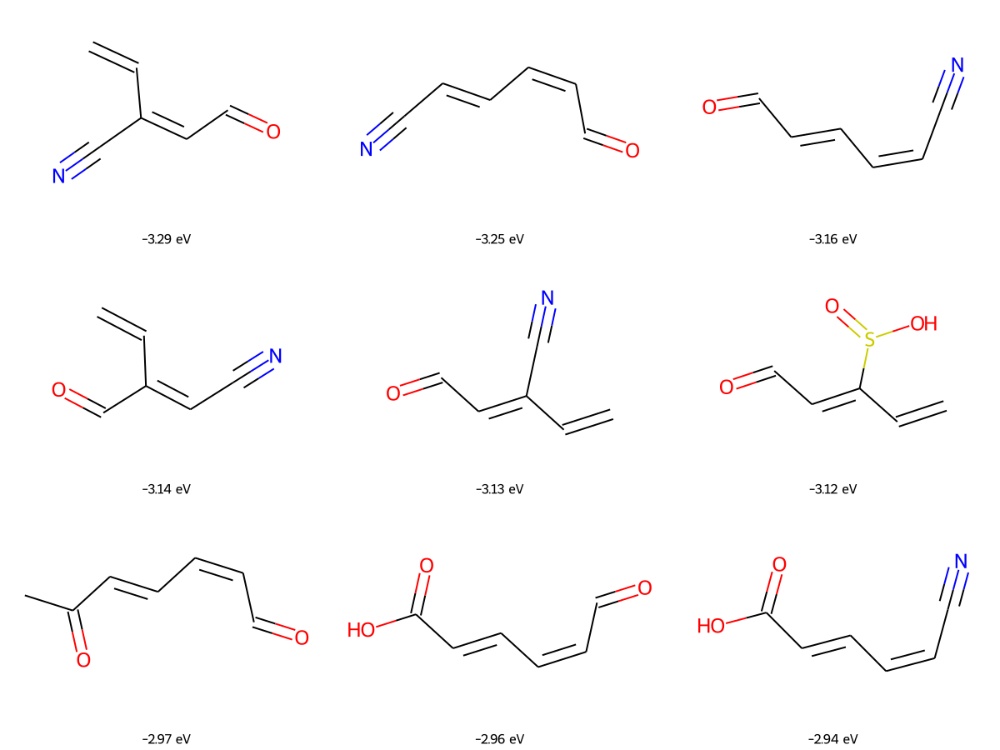

In [23]:
top = df_pnl.head(9)
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in top['SMILES']], molsPerRow=3, subImgSize=(400, 300), returnPNG=False, legends=[str(round(p,2))+' eV' for p in top['LUMO']], )  
img.save('CCCC_lowest_LUMO.png')
display(img)

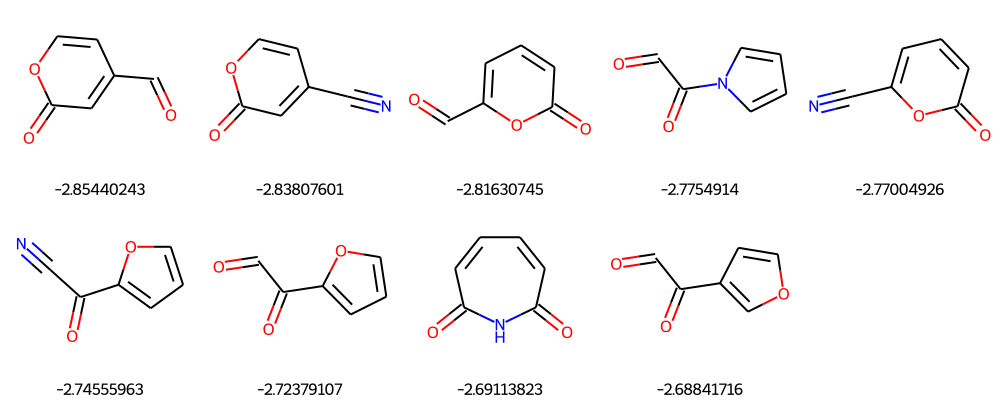

In [16]:
top = df_qm9.head(9)
img = Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in top['SMILES']], molsPerRow=5, legends=[str(p) for p in top['LUMO']] )  
display(img)

## PNL CCCC 

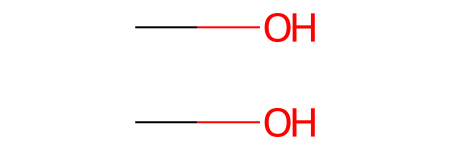

In [122]:
mol = Chem.MolFromSmiles( 'CO/C=C/C=C/OC' )
rm = AllChem.DeleteSubstructs(mol, d)
display( rm )

In [162]:
from itertools import chain

prop_list = [ 
    'TPSA',
    'MinAbsPartialCharge',
    'NumHeteroatoms',
    'MolLogP',
    'EState_VSA10',
    'PEOE_VSA6',
    'Chi1v',
    'MaxAbsEStateIndex',
    'BCUT2D_MRLOW',
    'BCUT2D_CHGHI',
]
    
from rdkit.ML.Descriptors import MoleculeDescriptors
def get_rdkprop(smies_list, prop_list):
    calc = MoleculeDescriptors.MolecularDescriptorCalculator(prop_list)           
    fp_data = {}
    for smi in smies_list:
        fp = calc.CalcDescriptors( Chem.MolFromSmiles(smi) )
        fp_data[smi] = fp
    return fp_data

functionality=[] 
for s in df_pnl['SMILES']:
    f=list(chain( *locate_func(smi=s).values() ) )
    functionality += f

functionality = list(set(functionality ))
functionality = get_rdkprop(functionality, prop_list )

functionality = pd.DataFrame(functionality.values(), index=functionality.keys(), columns=prop_list)
functionality = functionality.dropna(axis='columns')
functionality = clean_std(functionality)
print(functionality.columns)
functionality = {k: list(v.values()) for k,v in functionality.to_dict('index').items() }
functionality['*C=O']

Before clean (141, 7)
After clean (141, 6)
Index(['TPSA', 'NumHeteroatoms', 'MolLogP', 'EState_VSA10', 'Chi1v',
       'MaxAbsEStateIndex'],
      dtype='object')


[17.07, 2, -0.2741, 0.0, 0.2357022603955159, 8.916666666666666]

In [172]:
known_func = ['*O', '*N(C)C', '*NC', '*N', '*OC', '*NC(=O)C', '*OC(=O)C', '*C', '*C=C', '*C=O', '*C(=O)C', '*C(=O)OC', '*C(=O)O', '*C#N', '*S(=O)(=O)O','*[N+](=O)[O-]']
functionality= get_rdkprop(known_func, prop_list)
functionality = pd.DataFrame(functionality.values(), index=functionality.keys(), columns=prop_list)
functionality = functionality.dropna(axis='columns')
functionality = clean_std(functionality)
functionality = {k: list(v.values()) for k,v in functionality.to_dict('index').items() }
functionality['*N(C)C']

Before clean (16, 7)
After clean (16, 6)


[3.24, 2, 0.012299999999999978, 0.0, 0.8944271909999159, 2.25]

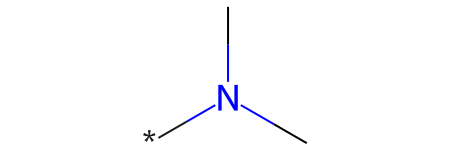

(3.24, 2, 0.012299999999999978, 0.0, 0.8944271909999159, 2.25)

In [173]:
mol_ref = Chem.MolFromSmiles( '*N(C)C' )
display( mol_ref )
calc = MoleculeDescriptors.MolecularDescriptorCalculator(['TPSA', 'NumHeteroatoms', 'MolLogP', 'EState_VSA10', 'Chi1v','MaxAbsEStateIndex'])  
vec_ref = calc.CalcDescriptors( mol_ref )
vec_ref

,name,dist
8,*C=C,0.610240
7,*C,0.619164
14,*S(=O)(=O)O,0.824277
3,*N,0.826812
15,*[N+](=O)[O-],0.842479
12,*C(=O)O,0.850061
13,*C#N,0.868578
5,*NC(=O)C,0.873616
0,*O,0.881255
11,*C(=O)OC,0.881310


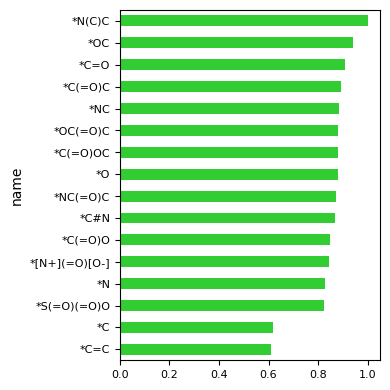

In [176]:
def dist_cos(v1,v2):
    dot_product = np.dot(v1, v2)
    d1,d2 = np.linalg.norm(v1), np.linalg.norm(v2)
    cosine_distance = dot_product / (d1 * d2)
    return cosine_distance

df = [ [ k, dist_cos(v, vec_ref) ] for k,v in functionality.items() ]
df = pd.DataFrame(df, columns=['name','dist']).sort_values(by='dist',ascending=True)

fig, axs = plt.subplots(1,1,  figsize=(4,4),tight_layout=True)
df.plot(kind='barh', x='name', y=['dist'], color=['limegreen'], legend=False, fontsize=8, xlabel=None, ax=axs)
df

## QM9 CCCC

RingCount_3 350
RingCount_4 188
RingCount_5 3146
RingCount_6 638
RingCount_7 258
RingCount_8 53
RingCount_9 14
RingCount_10 0
RingCount_11 0
14


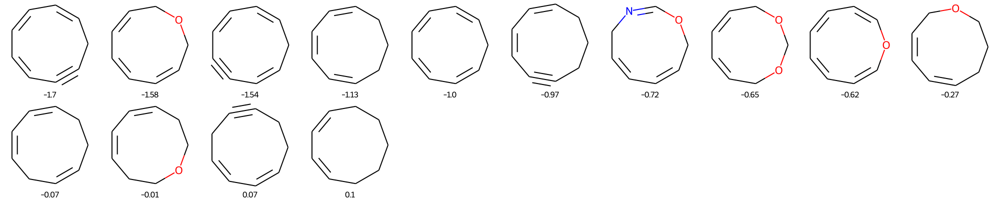

In [72]:
df_qm9 = df_diene_pattern[ df_diene_pattern['source'] =='QM9' ].sort_values(by='LUMO',ascending=True)

ring = [ c for c in df_qm9.columns if 'RingCount_' in c ]
for r in ring:
    #display(df_qm9['RingCount_3'].value_counts())
    df = df_qm9[df_qm9[r]==1]
    print(r, len(df) )



df = df[df['RingCount_9']==1]

print( len(df) )
Draw.MolsToGridImage( [Chem.MolFromSmiles(p) for p in df['SMILES']], molsPerRow=10, legends=[str(round(p,2)) for p in df['LUMO']] )  


# Understand descriptor meaning

In [37]:
# from: https://github.com/rdkit/rdkit/blob/master/Code/GraphMol/Descriptors/Crippen.cpp#L194
# each line includes the atom label, the SMARTS, the logP contribution, the MR contribution, and an optional note
rdkit_data='''C1    [CH4]   0.1441  2.503   
C1  [CH3]C  0.1441  2.503   
C1  [CH2](C)C   0.1441  2.503   
C2  [CH](C)(C)C 0   2.433   
C2  [C](C)(C)(C)C   0   2.433   
C3  [CH3][N,O,P,S,F,Cl,Br,I]    -0.2035 2.753   
C3  [CH2X4]([N,O,P,S,F,Cl,Br,I])[A;!#1] -0.2035 2.753   
C4  [CH1X4]([N,O,P,S,F,Cl,Br,I])([A;!#1])[A;!#1]    -0.2051 2.731   
C4  [CH0X4]([N,O,P,S,F,Cl,Br,I])([A;!#1])([A;!#1])[A;!#1]   -0.2051 2.731   
C5  [C]=[!C;A;!#1]  -0.2783 5.007   
C6  [CH2]=C 0.1551  3.513   
C6  [CH1](=C)[A;!#1]    0.1551  3.513   
C6  [CH0](=C)([A;!#1])[A;!#1]   0.1551  3.513   
C6  [C](=C)=C   0.1551  3.513   
C7  [CX2]#[A;!#1]   0.0017  3.888   
C8  [CH3]c  0.08452 2.464   
C9  [CH3]a  -0.1444 2.412   
C10 [CH2X4]a    -0.0516 2.488   
C11 [CHX4]a 0.1193  2.582   
C12 [CH0X4]a    -0.0967 2.576   
C13 [cH0]-[A;!C;!N;!O;!S;!F;!Cl;!Br;!I;!#1] -0.5443 4.041   
C14 [c][#9] 0   3.257   
C15 [c][#17]    0.245   3.564   
C16 [c][#35]    0.198   3.18    
C17 [c][#53]    0   3.104   
C18 [cH]    0.1581  3.35    
C19 [c](:a)(:a):a   0.2955  4.346   
C20 [c](:a)(:a)-a   0.2713  3.904   
C21 [c](:a)(:a)-C   0.136   3.509   
C22 [c](:a)(:a)-N   0.4619  4.067   
C23 [c](:a)(:a)-O   0.5437  3.853   
C24 [c](:a)(:a)-S   0.1893  2.673   
C25 [c](:a)(:a)=[C,N,O] -0.8186 3.135   
C26 [C](=C)(a)[A;!#1]   0.264   4.305   
C26 [C](=C)(c)a 0.264   4.305   
C26 [CH1](=C)a  0.264   4.305   
C26 [C]=c   0.264   4.305   
C27 [CX4][A;!C;!N;!O;!P;!S;!F;!Cl;!Br;!I;!#1]   0.2148  2.693   
CS  [#6]    0.08129 3.243   
H1  [#1][#6,#1] 0.123   1.057   
H2  [#1]O[CX4,c]    -0.2677 1.395   
H2  [#1]O[!#6;!#7;!#8;!#16] -0.2677 1.395   
H2  [#1][!#6;!#7;!#8]   -0.2677 1.395   
H3  [#1][#7]    0.2142  0.9627  
H3  [#1]O[#7]   0.2142  0.9627  
H4  [#1]OC=[#6,#7,O,S]  0.298   1.805   
H4  [#1]O[O,S]  0.298   1.805   
HS  [#1]    0.1125  1.112   
N1  [NH2+0][A;!#1]  -1.019  2.262   
N2  [NH+0]([A;!#1])[A;!#1]  -0.7096 2.173   
N3  [NH2+0]a    -1.027  2.827   
N4  [NH1+0]([!#1;A,a])a -0.5188 3   
N5  [NH+0]=[!#1;A,a]    0.08387 1.757   
N6  [N+0](=[!#1;A,a])[!#1;A,a]  0.1836  2.428   
N7  [N+0]([A;!#1])([A;!#1])[A;!#1]  -0.3187 1.839   
N8  [N+0](a)([!#1;A,a])[A;!#1]  -0.4458 2.819   
N8  [N+0](a)(a)a    -0.4458 2.819   
N9  [N+0]#[A;!#1]   0.01508 1.725   
N10 [NH3,NH2,NH;+,+2,+3]    -1.95       
N11 [n+0]   -0.3239 2.202   
N12 [n;+,+2,+3] -1.119      
N13 [NH0;+,+2,+3]([A;!#1])([A;!#1])([A;!#1])[A;!#1] -0.3396 0.2604  
N13 [NH0;+,+2,+3](=[A;!#1])([A;!#1])[!#1;A,a]   -0.3396 0.2604  
N13 [NH0;+,+2,+3](=[#6])=[#7]   -0.3396 0.2604  
N14 [N;+,+2,+3]#[A;!#1] 0.2887  3.359   
N14 [N;-,-2,-3] 0.2887  3.359   
N14 [N;+,+2,+3](=[N;-,-2,-3])=N 0.2887  3.359   
NS  [#7]    -0.4806 2.134   
O1  [o] 0.1552  1.08    
O2  [OH,OH2]    -0.2893 0.8238  
O3  [O]([A;!#1])[A;!#1] -0.0684 1.085   
O4  [O](a)[!#1;A,a] -0.4195 1.182   
O5  [O]=[#7,#8] 0.0335  3.367   
O5  [OX1;-,-2,-3][#7]   0.0335  3.367   
O6  [OX1;-,-2,-2][#16]  -0.3339 0.7774  
O6  [O;-0]=[#16;-0] -0.3339 0.7774  
O12 [O-]C(=O)   -1.326      \"order flip here intentional\"
O7  [OX1;-,-2,-3][!#1;!N;!S]    -1.189  0   
O8  [O]=c   0.1788  3.135   
O9  [O]=[CH]C   -0.1526 0   
O9  [O]=C(C)([A;!#1])   -0.1526 0   
O9  [O]=[CH][N,O]   -0.1526 0   
O9  [O]=[CH2]   -0.1526 0   
O9  [O]=[CX2]=O -0.1526 0   
O10 [O]=[CH]c   0.1129  0.2215  
O10 [O]=C([C,c])[a;!#1] 0.1129  0.2215  
O10 [O]=C(c)[A;!#1] 0.1129  0.2215  
O11 [O]=C([!#1;!#6])[!#1;!#6]   0.4833  0.389   
OS  [#8]    -0.1188 0.6865  
F   [#9-0]  0.4202  1.108   
Cl  [#17-0] 0.6895  5.853   
Br  [#35-0] 0.8456  8.927   
I   [#53-0] 0.8857  14.02   
Hal [#9,#17,#35,#53;-]  -2.996      
Hal [#53;+,+2,+3]   -2.996      
Hal [+;#3,#11,#19,#37,#55]  -2.996      \"Footnote h indicates these should be here?\"
P   [#15]   0.8612  6.92    
S2  [S;-,-2,-3,-4,+1,+2,+3,+5,+6]   -0.0024 7.365   \"Order flip here is intentional\"
S2  [S-0]=[N,O,P,S] -0.0024 7.365   \"Expanded definition of (pseudo-)ionic S\"
S1  [S;A]   0.6482  7.591   \"Order flip here is intentional\"
S3  [s;a]   0.6237  6.691   
Me1 [#3,#11,#19,#37,#55]    -0.3808 5.754   
Me1 [#4,#12,#20,#38,#56]    -0.3808 5.754   
Me1 [#5,#13,#31,#49,#81]    -0.3808 5.754   
Me1 [#14,#32,#50,#82]   -0.3808 5.754   
Me1 [#33,#51,#83]   -0.3808 5.754   
Me1 [#34,#52,#84]   -0.3808 5.754   
Me2 [#21,#22,#23,#24,#25,#26,#27,#28,#29,#30]   -0.0025     
Me2 [#39,#40,#41,#42,#43,#44,#45,#46,#47,#48]   -0.0025     
Me2 [#72,#73,#74,#75,#76,#77,#78,#79,#80]   -0.0025     '''

In [38]:
from collections import namedtuple

CrippenTuple = namedtuple('CrippenTuple',('name','smarts','logp_contrib','mr_contrib'))
lines = [x.split('\t') for x in rdkit_data.split('\n')]

crippenData = []
for i,entry in enumerate(lines):
    entry = entry[0].split()
    entry[2] = float(entry[2])
    if len(entry)<=3:
        entry.append(None)
    else:
        try: 
            entry[3] = float(entry[3])
        except:
            entry[3] = None
    entry = entry[:4]
    crippenData.append(CrippenTuple(*entry))
print(crippenData[:3])

[CrippenTuple(name='C1', smarts='[CH4]', logp_contrib=0.1441, mr_contrib=2.503), CrippenTuple(name='C1', smarts='[CH3]C', logp_contrib=0.1441, mr_contrib=2.503), CrippenTuple(name='C1', smarts='[CH2](C)C', logp_contrib=0.1441, mr_contrib=2.503)]


In [39]:
import re
def find_contribs_for_bin(lower,upper,crippenData=crippenData,which='mr_contrib'):
    ' returns a list of Crippen contributions which are between lower and upper '
    res = []
    for tpl in crippenData:
        v = getattr(tpl,which)
        if v is not None and v>=lower and v<=upper:
            res.append(tpl)
    return res
def find_tuples_for_atom(symbol,crippenData=crippenData):
    ' returns a list of crippen contributions for a particular atomic symbol, i.e. "C" or "N"'
    res = []
    anum = Chem.GetPeriodicTable().GetAtomicNumber(symbol)
    for tpl in crippenData:
        if tpl.name.startswith(symbol) or re.match(f'\[[^\]]*#{anum}[^0-9]',tpl.smarts):
            res.append(tpl)
    return res

In [40]:
print(Descriptors.SMR_VSA1.__doc__)

MOE MR VSA Descriptor 1 (-inf < x <  1.29)


In [50]:
sub = find_contribs_for_bin(-999999999,1.29, which='mr_contrib')
sub

[CrippenTuple(name='H1', smarts='[#1][#6,#1]', logp_contrib=0.123, mr_contrib=1.057),
 CrippenTuple(name='H3', smarts='[#1][#7]', logp_contrib=0.2142, mr_contrib=0.9627),
 CrippenTuple(name='H3', smarts='[#1]O[#7]', logp_contrib=0.2142, mr_contrib=0.9627),
 CrippenTuple(name='HS', smarts='[#1]', logp_contrib=0.1125, mr_contrib=1.112),
 CrippenTuple(name='N13', smarts='[NH0;+,+2,+3]([A;!#1])([A;!#1])([A;!#1])[A;!#1]', logp_contrib=-0.3396, mr_contrib=0.2604),
 CrippenTuple(name='N13', smarts='[NH0;+,+2,+3](=[A;!#1])([A;!#1])[!#1;A,a]', logp_contrib=-0.3396, mr_contrib=0.2604),
 CrippenTuple(name='N13', smarts='[NH0;+,+2,+3](=[#6])=[#7]', logp_contrib=-0.3396, mr_contrib=0.2604),
 CrippenTuple(name='O1', smarts='[o]', logp_contrib=0.1552, mr_contrib=1.08),
 CrippenTuple(name='O2', smarts='[OH,OH2]', logp_contrib=-0.2893, mr_contrib=0.8238),
 CrippenTuple(name='O3', smarts='[O]([A;!#1])[A;!#1]', logp_contrib=-0.0684, mr_contrib=1.085),
 CrippenTuple(name='O4', smarts='[O](a)[!#1;A,a]', lo

CrippenTuple(name='H1', smarts='[#1][#6,#1]', logp_contrib=0.123, mr_contrib=1.057)

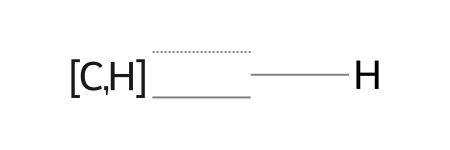

CrippenTuple(name='H3', smarts='[#1][#7]', logp_contrib=0.2142, mr_contrib=0.9627)

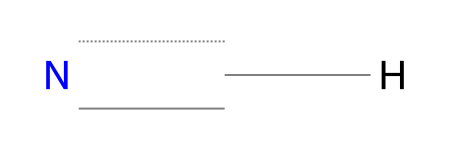

CrippenTuple(name='H3', smarts='[#1]O[#7]', logp_contrib=0.2142, mr_contrib=0.9627)

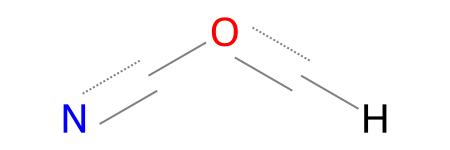

CrippenTuple(name='HS', smarts='[#1]', logp_contrib=0.1125, mr_contrib=1.112)

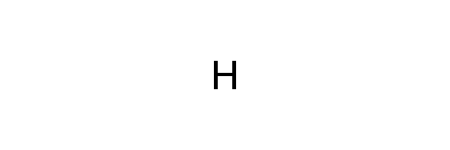

CrippenTuple(name='N13', smarts='[NH0;+,+2,+3]([A;!#1])([A;!#1])([A;!#1])[A;!#1]', logp_contrib=-0.3396, mr_contrib=0.2604)

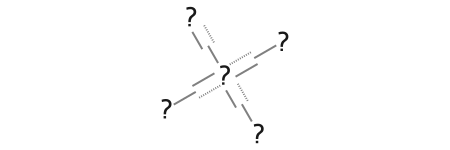

CrippenTuple(name='N13', smarts='[NH0;+,+2,+3](=[A;!#1])([A;!#1])[!#1;A,a]', logp_contrib=-0.3396, mr_contrib=0.2604)

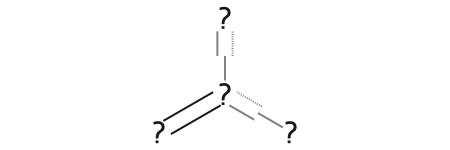

CrippenTuple(name='N13', smarts='[NH0;+,+2,+3](=[#6])=[#7]', logp_contrib=-0.3396, mr_contrib=0.2604)

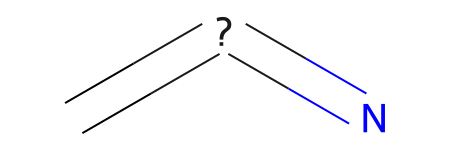

CrippenTuple(name='O1', smarts='[o]', logp_contrib=0.1552, mr_contrib=1.08)

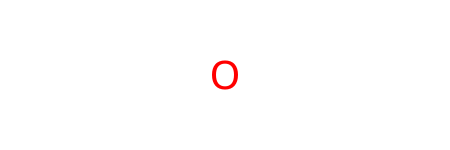

CrippenTuple(name='O2', smarts='[OH,OH2]', logp_contrib=-0.2893, mr_contrib=0.8238)

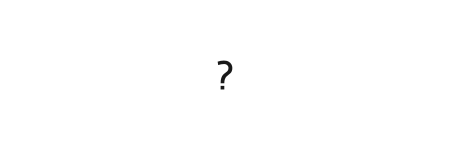

CrippenTuple(name='O3', smarts='[O]([A;!#1])[A;!#1]', logp_contrib=-0.0684, mr_contrib=1.085)

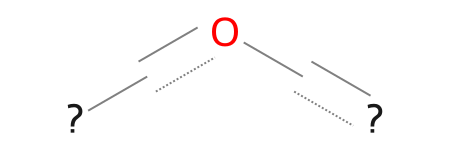

CrippenTuple(name='O4', smarts='[O](a)[!#1;A,a]', logp_contrib=-0.4195, mr_contrib=1.182)

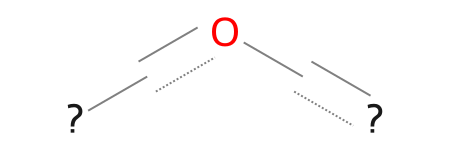

CrippenTuple(name='O6', smarts='[OX1;-,-2,-2][#16]', logp_contrib=-0.3339, mr_contrib=0.7774)

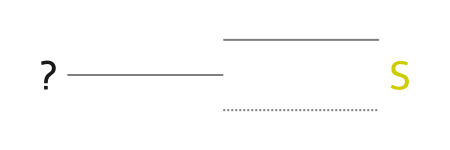

CrippenTuple(name='O6', smarts='[O;-0]=[#16;-0]', logp_contrib=-0.3339, mr_contrib=0.7774)

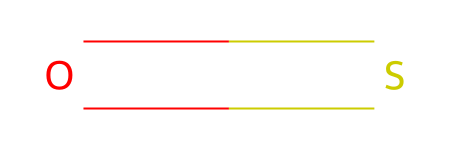

CrippenTuple(name='O7', smarts='[OX1;-,-2,-3][!#1;!N;!S]', logp_contrib=-1.189, mr_contrib=0.0)

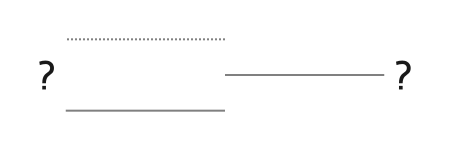

CrippenTuple(name='O9', smarts='[O]=[CH]C', logp_contrib=-0.1526, mr_contrib=0.0)

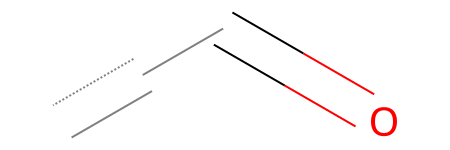

CrippenTuple(name='O9', smarts='[O]=C(C)([A;!#1])', logp_contrib=-0.1526, mr_contrib=0.0)

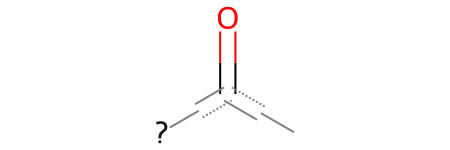

CrippenTuple(name='O9', smarts='[O]=[CH][N,O]', logp_contrib=-0.1526, mr_contrib=0.0)

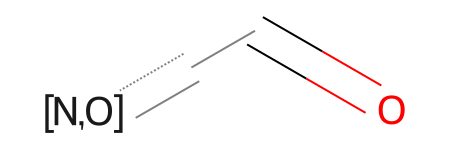

CrippenTuple(name='O9', smarts='[O]=[CH2]', logp_contrib=-0.1526, mr_contrib=0.0)

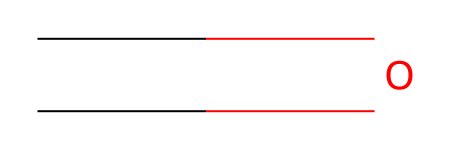

CrippenTuple(name='O9', smarts='[O]=[CX2]=O', logp_contrib=-0.1526, mr_contrib=0.0)

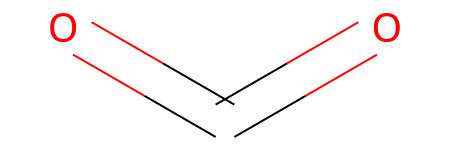

CrippenTuple(name='O10', smarts='[O]=[CH]c', logp_contrib=0.1129, mr_contrib=0.2215)

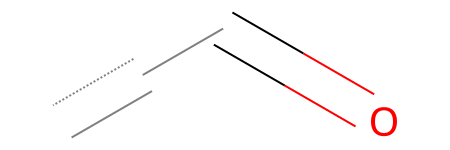

CrippenTuple(name='O10', smarts='[O]=C([C,c])[a;!#1]', logp_contrib=0.1129, mr_contrib=0.2215)

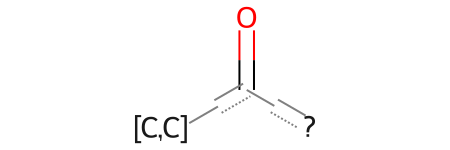

CrippenTuple(name='O10', smarts='[O]=C(c)[A;!#1]', logp_contrib=0.1129, mr_contrib=0.2215)

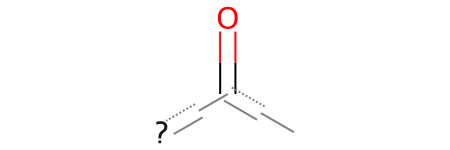

CrippenTuple(name='O11', smarts='[O]=C([!#1;!#6])[!#1;!#6]', logp_contrib=0.4833, mr_contrib=0.389)

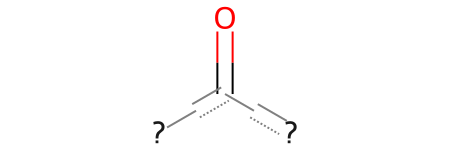

CrippenTuple(name='OS', smarts='[#8]', logp_contrib=-0.1188, mr_contrib=0.6865)

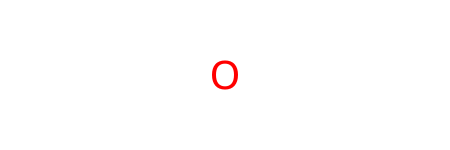

CrippenTuple(name='F', smarts='[#9-0]', logp_contrib=0.4202, mr_contrib=1.108)

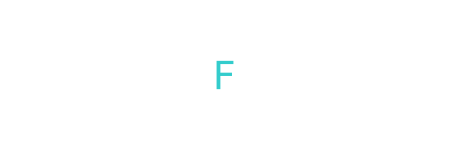

In [64]:
for at in sub:
    mol = Chem.MolFromSmarts(at[1])
    display(at, mol)
#img = Draw.MolsToGridImage( mol, molsPerRow=5, )#legends=[at[1] for at in sub] )  
#display(img)

In [42]:
print(Descriptors.SlogP_VSA6.__doc__)

MOE logP VSA Descriptor 6 ( 0.15 <= x <  0.20)


In [65]:
sub = find_contribs_for_bin( 0.15, 0.20, which='logp_contrib')
sub

[CrippenTuple(name='C6', smarts='[CH2]=C', logp_contrib=0.1551, mr_contrib=3.513),
 CrippenTuple(name='C6', smarts='[CH1](=C)[A;!#1]', logp_contrib=0.1551, mr_contrib=3.513),
 CrippenTuple(name='C6', smarts='[CH0](=C)([A;!#1])[A;!#1]', logp_contrib=0.1551, mr_contrib=3.513),
 CrippenTuple(name='C6', smarts='[C](=C)=C', logp_contrib=0.1551, mr_contrib=3.513),
 CrippenTuple(name='C16', smarts='[c][#35]', logp_contrib=0.198, mr_contrib=3.18),
 CrippenTuple(name='C18', smarts='[cH]', logp_contrib=0.1581, mr_contrib=3.35),
 CrippenTuple(name='C24', smarts='[c](:a)(:a)-S', logp_contrib=0.1893, mr_contrib=2.673),
 CrippenTuple(name='N6', smarts='[N+0](=[!#1;A,a])[!#1;A,a]', logp_contrib=0.1836, mr_contrib=2.428),
 CrippenTuple(name='O1', smarts='[o]', logp_contrib=0.1552, mr_contrib=1.08),
 CrippenTuple(name='O8', smarts='[O]=c', logp_contrib=0.1788, mr_contrib=3.135)]

CrippenTuple(name='C6', smarts='[CH2]=C', logp_contrib=0.1551, mr_contrib=3.513)

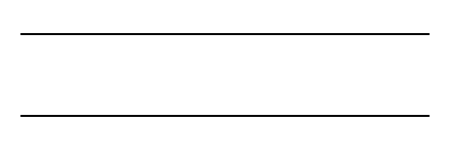

CrippenTuple(name='C6', smarts='[CH1](=C)[A;!#1]', logp_contrib=0.1551, mr_contrib=3.513)

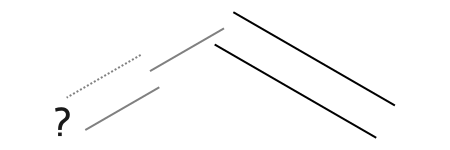

CrippenTuple(name='C6', smarts='[CH0](=C)([A;!#1])[A;!#1]', logp_contrib=0.1551, mr_contrib=3.513)

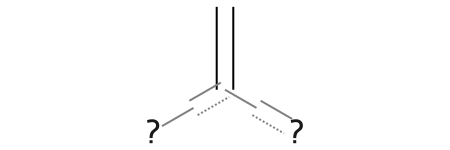

CrippenTuple(name='C6', smarts='[C](=C)=C', logp_contrib=0.1551, mr_contrib=3.513)

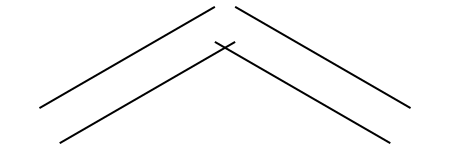

CrippenTuple(name='C16', smarts='[c][#35]', logp_contrib=0.198, mr_contrib=3.18)

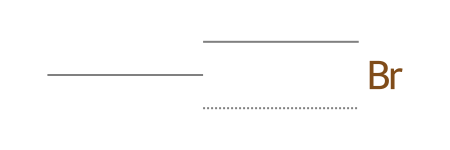

CrippenTuple(name='C18', smarts='[cH]', logp_contrib=0.1581, mr_contrib=3.35)

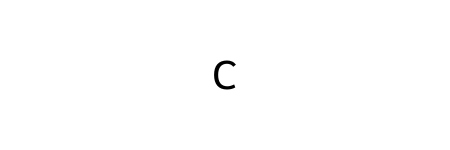

CrippenTuple(name='C24', smarts='[c](:a)(:a)-S', logp_contrib=0.1893, mr_contrib=2.673)

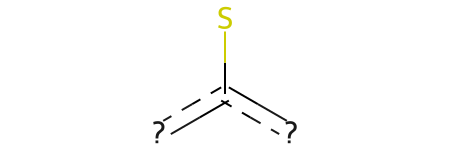

CrippenTuple(name='N6', smarts='[N+0](=[!#1;A,a])[!#1;A,a]', logp_contrib=0.1836, mr_contrib=2.428)

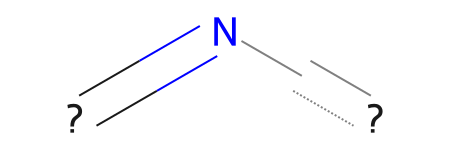

CrippenTuple(name='O1', smarts='[o]', logp_contrib=0.1552, mr_contrib=1.08)

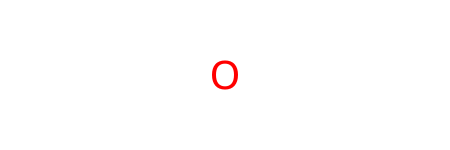

CrippenTuple(name='O8', smarts='[O]=c', logp_contrib=0.1788, mr_contrib=3.135)

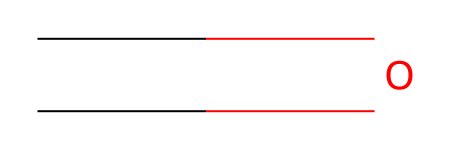

In [66]:
for at in sub:
    mol = Chem.MolFromSmarts(at[1])
    display(at, mol)

In [43]:
print(Descriptors.PEOE_VSA1.__doc__)

MOE Charge VSA Descriptor 1 (-inf < x < -0.30)


[21:33:41] SMARTS Parse Error: syntax error while parsing: N(~C)(~H)
[21:33:41] SMARTS Parse Error: Failed parsing SMARTS 'N(~C)(~H)' for input: 'N(~C)(~H)'


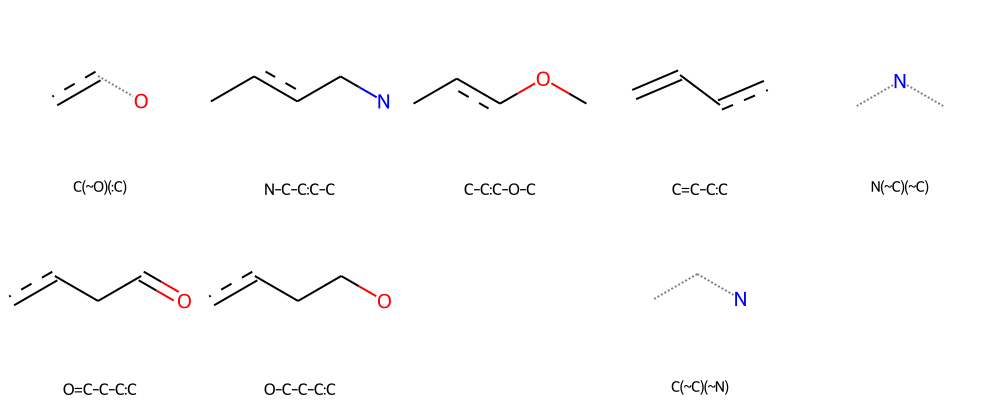

In [67]:
smarts = [
    'C(~O)(:C)',
    'N-C-C:C-C',
    'C-C:C-O-C',
    'C=C-C:C',
    'N(~C)(~C)',
    'O=C-C-C:C',
    'O-C-C-C:C',
    'N(~C)(~H)',
    'C(~C)(~N)',
]

img = Draw.MolsToGridImage( [Chem.MolFromSmarts(s) for s in smarts], molsPerRow=5, legends=[s for s in smarts] )  
img

In [ ]:
143 >= 1 any ring size 5
